# Anticiper les besoins en consommation énergétique à Seattle
# Première partie : nettoyage et analyse des données

---

**Vérification de l'environnement**

In [0]:
import sys
IN_COLAB = "google.colab" in sys.modules
PATH_DRIVE = "/content/drive/My Drive/MachineLearning/ML03" # to change according to your Google Drive folders

In [2]:
if IN_COLAB:
    print("Le notebook est exécuté sur Google Colab")
else:
    print("Le notebook est exécuté en local")

Le notebook est exécuté sur Google Colab


In [3]:
if IN_COLAB:
    from google.colab import drive, files
    drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


---

## <font color=blue>Sommaire</font>

[1. Téléchargement des données](#1_0)  
  
[2. Regroupement des données 2015 et 2016](#2_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[2.1. Vérification des variables différentes](#2_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[2.2. Changements dans les colonnes de Data2015](#2_2)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[2.3. Première exploration des colonnes disponibles](#2_3)  
  
[3. Nettoyage des données](#3_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.1. Densité des données renseignées](#3_1)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.2. Exploration de la catégorisation des bâtiments](#3_2)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.3. Exploration de la localisation des bâtiments](#3_3)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.4. Vérification des changements de valeurs dans les colonnes de description](#3_4)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.5. Nettoyage des variables quantitatives](#3_5)  
  
[4. Conservation des seules données sur les biens non résidentiels](#4_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.1. Suppression des bâtiments résidentiels](#4_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.2. Vérification du remplissage des variables sur les bâtiments non résidentiels](#4_2)  
  
[5. Séparation des données en set d'entraînement et de test](#5_0)  
  
[6. Analyse des données d'entraînement](#6_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[6.1. Analyses univariées](#6_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[6.2. Analyses multivariées](#6_2)  

---
## <font color=blue>Set-up du notebook</font>

**Importation des librairies**

In [0]:
import pkg_resources
if "dython" not in [pkg.key for pkg in pkg_resources.working_set]:  # install dython if necessary
    if IN_COLAB:
        !pip install dython
    else:
        !{sys.executable} -m pip install dython

In [5]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno
import re
import ast
if IN_COLAB:
    import os
else:
    import requests

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
from IPython.display import Image
from sklearn.impute import SimpleImputer, KNNImputer
from dython.nominal import associations

In [0]:
if IN_COLAB:
    sys.path.append(PATH_DRIVE)
    import sf_graphiques as sfg
    import sf_tests_distributions as sftd
    import sf_reduction_dimension as sfrd
    import sf_contingence as sfco
else:
    import modules_perso.sf_graphiques as sfg
    import modules_perso.sf_tests_distributions as sftd
    import modules_perso.sf_reduction_dimension as sfrd
    import modules_perso.sf_contingence as sfco

**Setup du notebook**

In [8]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [0]:
if IN_COLAB:
    os.chdir(PATH_DRIVE)

In [0]:
def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = fig_id + "." + fig_extension
    if IN_COLAB:
        path = PATH_DRIVE + "/" + path
    #print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, dpi=resolution)

In [0]:
def mydefault_plt_parameters(figsize=(12,8)):
    plt.rcParams['figure.figsize'] = figsize
    if figsize[0] == 12:
        mult_param = 1.0
        plt.rcParams['font.size'] = 18
        plt.rcParams['axes.titlepad'] = 20
        plt.rcParams['axes.labelpad'] = 15
    else:
        mult_param = np.sqrt(1.0 * figsize[0] / 12)
        plt.rcParams['font.size'] = np.around(18 * mult_param)
        plt.rcParams['axes.titlepad'] = np.around(20 * mult_param)
        plt.rcParams['axes.labelpad'] = np.around(15 * mult_param)
    plt.rcParams['figure.titleweight'] = 'bold'
    plt.rcParams['axes.titleweight'] = 'bold'
    plt.rcParams['legend.framealpha'] = 1
    plt.rcParams['legend.facecolor'] = (0.95,0.95,0.95)
    plt.rcParams['legend.edgecolor'] = (0.95,0.95,0.95)
    plt.rcParams['savefig.orientation'] = 'landscape'
    plt.rcParams['savefig.dpi'] = 300
    plt.rcParams['savefig.bbox'] = 'tight'
mydefault_plt_parameters()

---
<a id='1_0'></a>

## <font color=blue>1. Téléchargement des données</font>

In [0]:
data2015 = pd.read_csv("2015-building-energy-benchmarking.csv")
data2016 = pd.read_csv("2016-building-energy-benchmarking.csv")

In [13]:
data2015.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,"{'latitude': '47.61219025', 'longitude': '-122...",7,DOWNTOWN,1927,1,12.0,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,0.0,249.43,2.64,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,"{'latitude': '47.61310583', 'longitude': '-122...",7,DOWNTOWN,1996,1,11.0,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,0.0,263.51,2.38,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,"{'latitude': '47.61334897', 'longitude': '-122...",7,DOWNTOWN,1969,1,41.0,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.0,Parking,100000.0,Swimming Pool,0.0,NaN,18.0,96.6,99.7,242.7,246.5,73130656.0,75506272.0,19660404.0,14583930.0,49762435.0,37099.0,3709900.0,0.0,2061.48,1.92,Yes,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,18081
3,5,2015,NonResidential,Hotel,HOTEL MAX,659000640,"{'latitude': '47.61421585', 'longitude': '-122...",7,DOWNTOWN,1926,1,10.0,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,1.0,460.4,462.5,636.3,643.2,28229320.0,28363444.0,23458518.0,811521.0,2769023.0,20019.0,2001894.0,0.0,1936.34,31.38,No,NaN,Compliant,High Outlier,NaN,56.0,NaN,31.0,18081
4,8,2015,NonResidential,Hotel,WARWICK SEATTLE HOTEL,659000970,"{'latitude': '47.6137544', 'longitude': '-122....",7,DOWNTOWN,1980,1,18.0,119890,12460,107430,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,67.0,120.1,122.1,228.8,227.1,14829099.0,15078243.0,0.0,1777841.0,6066245.0,87631.0,8763105.0,0.0,507.70,4.02,No,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,19576


In [14]:
data2016.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [15]:
data2015.shape

(3340, 47)

In [16]:
data2016.shape

(3376, 46)

---
<a id='2_0'></a>

## <font color=blue>2. Regroupement des données 2015 et 2016</font>

Le premier aperçu des deux dataframes laisse penser que toutes les colonnes ne sont pas les mêmes dans les deux sets de données. Avant de les regrouper, je dois mettre en correspondance leurs features.

### 2.1. Vérification des variables différentes

In [0]:
diff2015 = [col for col in data2015.columns if col not in data2016.columns]
diff2016 = [col for col in data2016.columns if col not in data2015.columns]

In [18]:
data2016[diff2016].head()

,Address,City,State,ZipCode,Latitude,Longitude,Comments,TotalGHGEmissions,GHGEmissionsIntensity
0,405 Olive way,Seattle,WA,98101.0,47.61220,-122.33799,NaN,249.98,2.83
1,724 Pine street,Seattle,WA,98101.0,47.61317,-122.33393,NaN,295.86,2.86
2,1900 5th Avenue,Seattle,WA,98101.0,47.61393,-122.33810,NaN,2089.28,2.19
3,620 STEWART ST,Seattle,WA,98101.0,47.61412,-122.33664,NaN,286.43,4.67
4,401 LENORA ST,Seattle,WA,98121.0,47.61375,-122.34047,NaN,505.01,2.88


In [19]:
data2015[diff2015].head()

,Location,OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),Comment,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes
0,"{'latitude': '47.61219025', 'longitude': '-122...",0.0,249.43,2.64,NaN,NaN,14.0,NaN,31.0,18081
1,"{'latitude': '47.61310583', 'longitude': '-122...",0.0,263.51,2.38,NaN,NaN,14.0,NaN,31.0,18081
2,"{'latitude': '47.61334897', 'longitude': '-122...",0.0,2061.48,1.92,NaN,NaN,56.0,NaN,31.0,18081
3,"{'latitude': '47.61421585', 'longitude': '-122...",0.0,1936.34,31.38,NaN,NaN,56.0,NaN,31.0,18081
4,"{'latitude': '47.6137544', 'longitude': '-122....",0.0,507.70,4.02,NaN,NaN,56.0,NaN,31.0,19576


In [20]:
data2015.Location[0]

'{\'latitude\': \'47.61219025\', \'longitude\': \'-122.33799744\', \'human_address\': \'{"address": "405 OLIVE WAY", "city": "SEATTLE", "state": "WA", "zip": "98101"}\'}'

La colonne Location dans data2015 contient les données de localisation qui correspondent chacune à une colonne dans data2016.  
D'autre part, 3 colonnes ont changé de noms.  
Enfin, certaines colonnes ont disparu entre 2015 et 2016.

<a id='2_2'></a>

### 2.2. Changements dans les colonnes de Data2015

**Extraction de Latitude, Longitude, Address, City, State, ZipCode à partir du champ Location**

In [21]:
intercol = [ast.literal_eval(locstr) for locstr in data2015.Location]
df = pd.DataFrame([newcol for newcol in intercol])
df.head()

,latitude,longitude,human_address
0,47.61219025,-122.33799744,"{""address"": ""405 OLIVE WAY"", ""city"": ""SEATTLE""..."
1,47.61310583,-122.33335756,"{""address"": ""724 PINE ST"", ""city"": ""SEATTLE"", ..."
2,47.61334897,-122.33769944,"{""address"": ""1900 5TH AVE"", ""city"": ""SEATTLE"",..."
3,47.61421585,-122.33660889,"{""address"": ""620 STEWART ST"", ""city"": ""SEATTLE..."
4,47.6137544,-122.3409238,"{""address"": ""401 LENORA ST"", ""city"": ""SEATTLE""..."


In [22]:
intercol = [ast.literal_eval(locstr) for locstr in df.human_address]
df2 = pd.DataFrame([newcol for newcol in intercol])
df = df.merge(df2, how='left', left_index=True, right_index=True)
df.drop(columns="human_address", inplace=True)
df.columns = df.columns.str.capitalize()
df.columns = df.columns.str.replace("Zip","ZipCode")
df["Latitude"] = df.Latitude.astype(float)
df["Longitude"] = df.Longitude.astype(float)
df["ZipCode"] = df.ZipCode.astype(float)
df.head()

,Latitude,Longitude,Address,City,State,ZipCode
0,47.612190,-122.337997,405 OLIVE WAY,SEATTLE,WA,98101.0
1,47.613106,-122.333358,724 PINE ST,SEATTLE,WA,98101.0
2,47.613349,-122.337699,1900 5TH AVE,SEATTLE,WA,98101.0
3,47.614216,-122.336609,620 STEWART ST,SEATTLE,WA,98101.0
4,47.613754,-122.340924,401 LENORA ST,SEATTLE,WA,98121.0


In [0]:
for col in df.columns:
    data2015[col] = df[col]

**Mise en correspondance des noms de champ avec Data2016**

In [0]:
data2015.columns = data2015.columns.str.replace("GHGEmissions(MetricTonsCO2e)","TotalGHGEmissions", regex=False)
data2015.columns = data2015.columns.str.replace("GHGEmissionsIntensity(kgCO2e/ft2)","GHGEmissionsIntensity", regex=False)
data2015.columns = data2015.columns.str.replace("Comment","Comments", regex=False)

**Nouvelle vérification des champs différents et suppression des variables supplémentaires de data2015**

In [0]:
diff2015 = [col for col in data2015.columns if col not in data2016.columns]
diff2016 = [col for col in data2016.columns if col not in data2015.columns]

In [26]:
data2016[diff2016].head()

""
0
1
2
3
4


In [27]:
data2015[diff2015].head()

,Location,OtherFuelUse(kBtu),2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes
0,"{'latitude': '47.61219025', 'longitude': '-122...",0.0,NaN,14.0,NaN,31.0,18081
1,"{'latitude': '47.61310583', 'longitude': '-122...",0.0,NaN,14.0,NaN,31.0,18081
2,"{'latitude': '47.61334897', 'longitude': '-122...",0.0,NaN,56.0,NaN,31.0,18081
3,"{'latitude': '47.61421585', 'longitude': '-122...",0.0,NaN,56.0,NaN,31.0,18081
4,"{'latitude': '47.6137544', 'longitude': '-122....",0.0,NaN,56.0,NaN,31.0,19576


In [0]:
data2015.drop(columns=diff2015, inplace=True)

<a id='2_3'></a>

### 2.3. Première exploration des colonnes disponibles

**Proportion de données manquantes**

Je ré-arrange l'ordre des colonnes dans les deux jeux de données pour avoir une correspondance.

In [0]:
columns_order = ["OSEBuildingID","DataYear","BuildingType","PrimaryPropertyType",
                 "PropertyName","Address","City","State","ZipCode","TaxParcelIdentificationNumber",
                 "CouncilDistrictCode","Neighborhood","Latitude","Longitude",
                 "YearBuilt","NumberofBuildings","NumberofFloors",
                 "PropertyGFATotal","PropertyGFAParking","PropertyGFABuilding(s)",
                 "ListOfAllPropertyUseTypes","LargestPropertyUseType","LargestPropertyUseTypeGFA",
                 "SecondLargestPropertyUseType","SecondLargestPropertyUseTypeGFA",
                 "ThirdLargestPropertyUseType","ThirdLargestPropertyUseTypeGFA",
                 "YearsENERGYSTARCertified","ENERGYSTARScore","SiteEUI(kBtu/sf)","SiteEUIWN(kBtu/sf)",
                 "SourceEUI(kBtu/sf)","SourceEUIWN(kBtu/sf)","SiteEnergyUse(kBtu)","SiteEnergyUseWN(kBtu)",
                 "SteamUse(kBtu)","Electricity(kWh)","Electricity(kBtu)","NaturalGas(therms)","NaturalGas(kBtu)",
                 "DefaultData","Comments","ComplianceStatus","Outlier","TotalGHGEmissions","GHGEmissionsIntensity"]
data2015 = data2015[columns_order]
data2016 = data2016[columns_order]

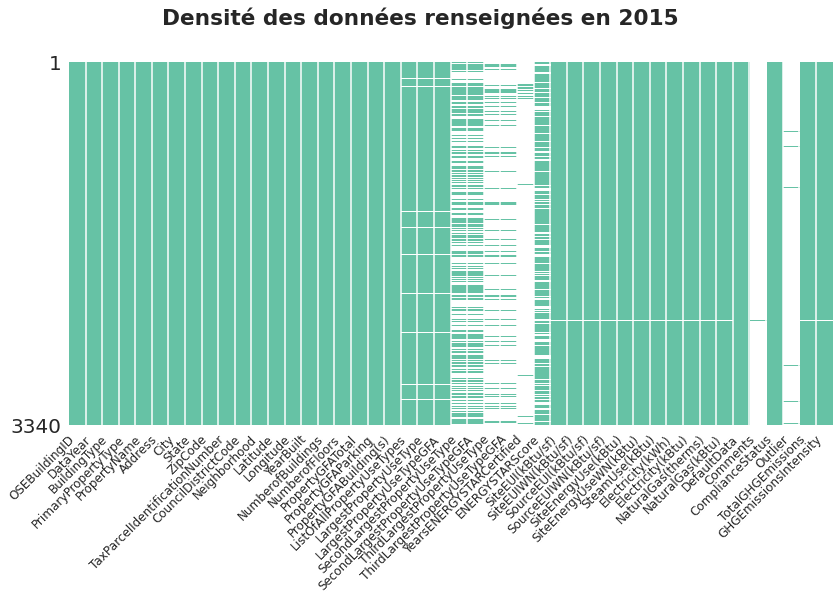

In [30]:
fig, ax = sfg.graph_densite_remplissage(data2015, title="Densité des données renseignées en 2015", label_fontsize=12)
plt.show()

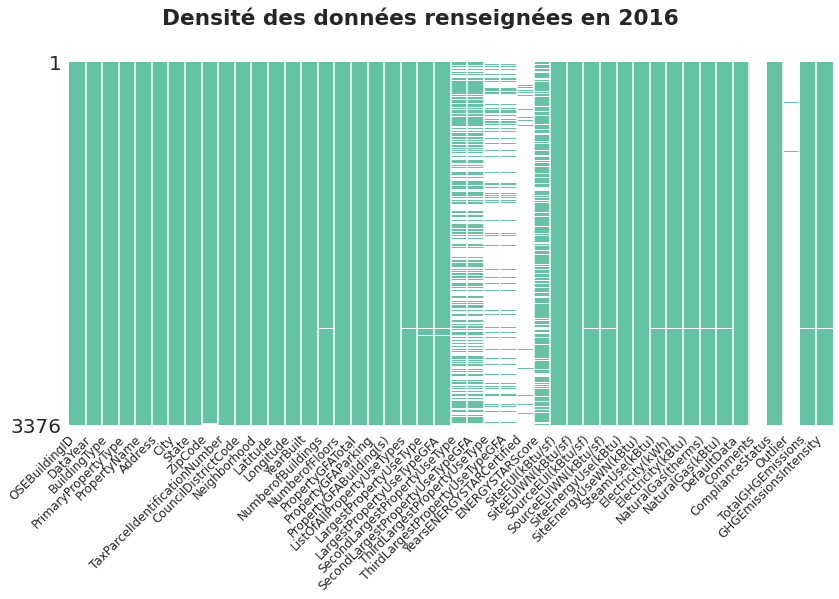

In [31]:
fig, ax = sfg.graph_densite_remplissage(data2016, title="Densité des données renseignées en 2016", label_fontsize=12)
plt.show()

Les taux de remplissage sont similaires entre les 2 années.

**Définition des variables inclues dans le dataset**

In [32]:
data2016.iloc[1]

OSEBuildingID                                               2
DataYear                                                 2016
BuildingType                                   NonResidential
PrimaryPropertyType                                     Hotel
PropertyName                                  Paramount Hotel
Address                                       724 Pine street
City                                                  Seattle
State                                                      WA
ZipCode                                                 98101
TaxParcelIdentificationNumber                      0659000220
CouncilDistrictCode                                         7
Neighborhood                                         DOWNTOWN
Latitude                                              47.6132
Longitude                                            -122.334
YearBuilt                                                1996
NumberofBuildings                                           1
Numberof

Définition des colonnes (sources : fichier json de Kaggle et site internet EnergyStar https://portfoliomanager.energystar.gov/pm/glossary) :
- OSEBuildingID : identifiant unique du bâtiment attribué par la ville de Seattle ;
- DataYear : année des données ;
- BuildingType : type de bâtiment selon les catégories définies par la ville de Seattle ;
- PrimaryPropertyType : usage principal du bâtiment (plus de 50% de son usage) ;
- PropertyName, Address, City, State : nom (à conserver pour description plus userfriendly que OSEBuildingID) et localisation du bien (à abandonner - tous les biens sont à Seattle par définition; les longitudes et latitudes sont plus utiles pour localiser le bien que l'adresse écrite) ;
- Longitude, Latitude : localisation exacte du bien ;
- ZipCode (code postal), CouncilDistrictCode (code de district), Neighborhood (quartier) : peuvent servir à localiser les biens en les regroupant par zones ;
- TaxParcelIdentificationNumber = numéro d'identification fiscal (à abandonner) ;
- YearBuilt = année de construction du bâtiment ou de rénovation complète du bâtiment - peut influencer la consommation énergétique du bâtiment ;
- PropertyGFATotal = superficie totale du site (GFA = Gross Floor Area en pieds carrés) ;
- PropertyGFAParking = superficie des parkings ;
- PropertyGFABuilding(s) = superficie utile des bâtiments ;
- NumberofBuildings : nombre de bâtiments sur le site ;
- NumberofFloors : nombre d'étages ;
- Comments : vide -> à supprimer;
- Outlier : est-ce que l'enregistrement est considéré comme un outlier - je le conserve pour tester éventuellement l'influence des outliers ;
- ComplianceStatus : est-ce que le bâtiment a atteint les objectifs énergétiques (à abandonner car déduit des estimations que l'on cherche à faire) ;
- ListOfAllPropertyUseTypes : liste de tous les usages du bâtiment (à abandonner - la séparation par ordre d'importance de l'usage et la superficie liée sont plus intéressants) ;
- LargestPropertyUseType, LargestPropertyUseTypeGFA, SecondLargestPropertyUseType, SecondLargestPropertyUseTypeGFA, ThirdLargestPropertyUseType, ThirdLargestPropertyUseTypeGFA : usage principal, 2ème usage et 3ème usage du bâtiment - usages classés par superfice GFA - et superficie associée à chaque usage ;
- YearsENERGYSTARCertified : liste des années de certification EnergyStar (à abandonner - pas intéressant pour estimer la consommation) ;
- ENERGYSTARScore : score qui évalue le coût énergétique des bâtiments, en les comparant aux propriétés similaires au niveau national américain, avec une normalisation liée au climat et aux caractéristiques opérationnelles (nombre d'heures de fréquentation du site et nombre de travailleurs). Indique le percentile de classement du bâtiment. Plus le score est élevé, plus il est efficient du point de vue énergétique par rapport aux bâtiments à usage similaire ;
- SiteEUI : consommation annuelle d'énergie du site par pied carré (pied carré = unité de superficie anglosaxonne) ;
- SiteEUIWN : Weather Normalized site EUI : consommation normalisée par le climat (calculée sur la base des températures moyennes sur 30 ans) ;
- SourceEUI : consommation annuelle d'énergie à la source par pied carré - prend en compte la déperdition d'énergie entre la production d'énergie et la consommation sur site - plus représentative pour comparer différents bâtiments (cf https://www.energystar.gov/buildings/facility-owners-and-managers/existing-buildings/use-portfolio-manager/understand-metrics/difference) ;
- SourceEUIWN : Weather Normalized source EUI : consommation normalisée par le climat (calculée sur la base des températures moyennes sur 30 ans) ;
- SiteEnergyUse et SiteEnergyUseWN : consommation totale annuelle d'énergie du site ;
- SteamUse, Electricity, NaturalGas : consommation annuelle par type d'énergie ;
- DefaultData : booléen qui indique si des valeurs par défaut ont été utilisées pour estimer la normalisation du score EnergyStar ; 
- TotalGHGEmissions : total des émissions de gaz à effet de serre (dioxyde de carbonne, méthane et oxyde nitrique) - en tonnes équivalent de dioxyde de carbonne ;
- GHGEmissionsIntensity : total des émissions de gaz à effet de serre par pied carré.

Les variables SiteEUI, SiteEUIWN, SourceEUI, SourceEUIWN, SteamUse, Electricity, NaturalGas et DefaultData sont les relevés de consommation que l'on cherche à remplacer par notre modèle. Je ne garde donc pas ces variables.

Je conserve les variables que je cherche à estimer : SiteEnergyUse ou SiteEnergyUseWN, et TotalGHGEmissions.  
Je ne conserve pas GHGEmissionsIntensity qui l'équivalent par pied carré des émissions.

PropertyGFATotal, PropertyGFAParking, PropertyGFABuilding(s), LargestPropertyUseType, LargestPropertyUseTypeGFA, SecondLargestPropertyUseType, SecondLargestPropertyUseTypeGFA, ThirdLargestPropertyUseType et ThirdLargestPropertyUseTypeGFA ne changent pas d'années en années, sauf en cas de réhabilitation d'un site.

In [0]:
columns_to_drop = ["Address","City","State","TaxParcelIdentificationNumber","Comments","ComplianceStatus",
                   "ListOfAllPropertyUseTypes","YearsENERGYSTARCertified","SiteEUI(kBtu/sf)","SiteEUIWN(kBtu/sf)",
                   "SourceEUI(kBtu/sf)","SourceEUIWN(kBtu/sf)","SteamUse(kBtu)","Electricity(kWh)","Electricity(kBtu)",
                   "NaturalGas(therms)","NaturalGas(kBtu)","DefaultData","GHGEmissionsIntensity"]

In [0]:
data2015.drop(columns=columns_to_drop, inplace=True)
data2016.drop(columns=columns_to_drop, inplace=True)

In [0]:
data = data2015.append(data2016, ignore_index=True)

---
<a id='3_0'></a>

## <font color=blue>3. Nettoyage des données</font>

Avant toute chose, je vérifie s'il y a des lignes en doublon.

In [36]:
data.duplicated().sum()

0

Il n'y a pas de lignes en doublon.

Puis je vérifie si la combinaison DataYear et OSEBuildingID peut former un index unique. Normalement, ce devrait être le cas.

In [37]:
verif_index = pd.Series(["{}_{}".format(row.DataYear, row.OSEBuildingID) for i, row in data.iterrows()])
verif_index.duplicated().sum()

0

Je peux utiliser la combinaison DataYear et OSEBuildingID pour former un index unique.

<a id='3_1'></a>

### 3.1. Densité des données renseignées

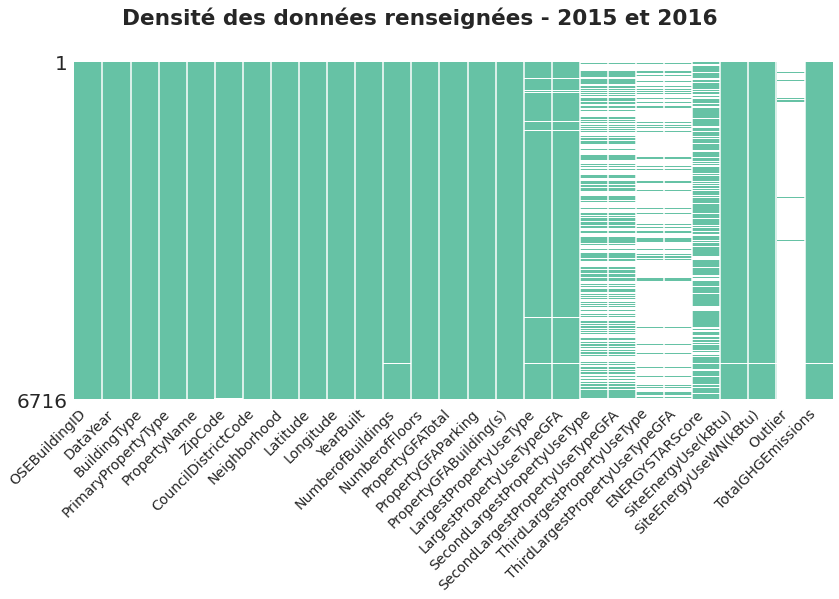

In [38]:
fig, ax = sfg.graph_densite_remplissage(data, title="Densité des données renseignées - 2015 et 2016")
plt.show()

<a id='3_2'></a>

### 3.2. Exploration de la catégorisation des bâtiments

**Variable Building Type**

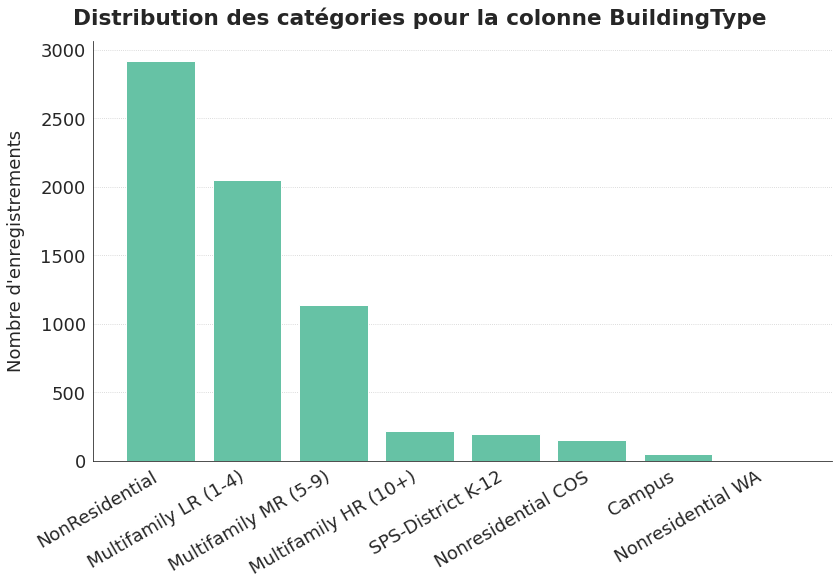

In [39]:
values = data.BuildingType.value_counts()
graph = sfg.MyGraph("Distribution des catégories pour la colonne BuildingType", figsize=(12,8))
graph.add_barv(values.index, values.values)
graph.set_axe_x(rotation=30, ha='right')
graph.set_axe_y(label="Nombre d'enregistrements")
fig, ax = graph.fig, graph.ax
save_fig("ml03_1_01_batiments_residentiels")
plt.show()

Catégories non résidentielles : NonResidential, SPS-District K-12 (enseignement primaire et secondaire), Nonresidential COS, Campus (enseignement supérieur), Nonresidential WA.

Catégories résidentielles : Multifamily LR (immeubles de 4 étages et moins), Multifamily MR (immeubles de 5 à 9 étages), Multifamily HR (immeubles de plus de 10 étages).

Notre étude ne porte que sur les bâtiments non résidentiels. **<font color=red>Il faudra supprimer les catégories résidentielles.</font>**

**Variable Primary Poperty Type**

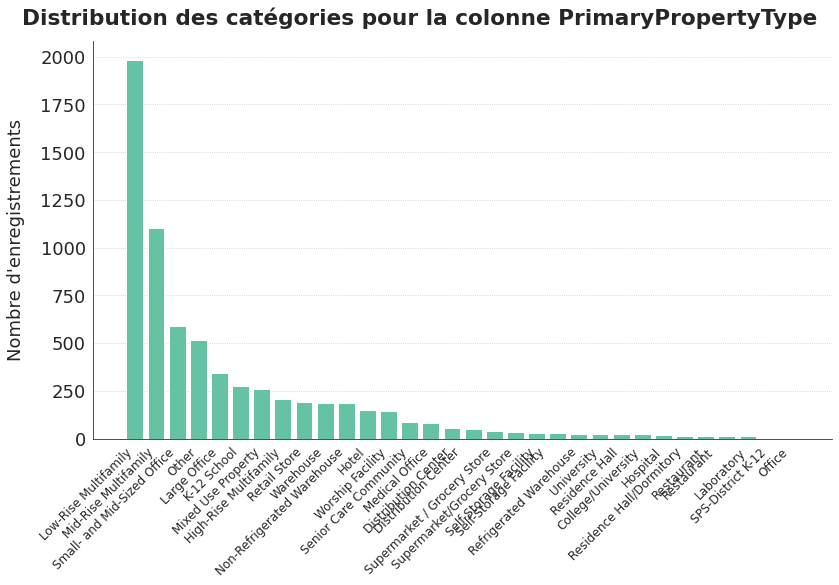

In [40]:
values = data.PrimaryPropertyType.value_counts()
graph = sfg.MyGraph("Distribution des catégories pour la colonne PrimaryPropertyType", figsize=(12,8))
graph.add_barv(values.index, values.values)
graph.set_axe_x(rotation=45, ha='right')
graph.set_axe_y(label="Nombre d'enregistrements")
ticklabels = graph.ax[0].xaxis.get_ticklabels()
graph.ax[0].set_xticklabels(ticklabels, fontsize=12)
fig, ax = graph.fig, graph.ax
save_fig("ml03_1_02_noms_differents")
plt.show()

Il y a des erreurs avec des catégories en doublon (saisies légèrement différentes). Je corrige ces erreurs.

In [41]:
values

Low-Rise Multifamily           1985
Mid-Rise Multifamily           1103
Small- and Mid-Sized Office     590
Other                           514
Large Office                    344
K-12 School                     275
Mixed Use Property              259
High-Rise Multifamily           208
Retail Store                    191
Warehouse                       187
Non-Refrigerated Warehouse      187
Hotel                           150
Worship Facility                143
Senior Care Community            88
Medical Office                   82
Distribution Center              55
Distribution Center\n            51
Supermarket / Grocery Store      40
Supermarket/Grocery Store        36
Self-Storage Facility            29
Self-Storage Facility\n          27
Refrigerated Warehouse           25
University                       25
Residence Hall                   23
College/University               22
Hospital                         20
Residence Hall/Dormitory         15
Restaurant                  

In [0]:
def change_ColValue(df, col, oldvalue, newvalue):
    index_to_change = df[df[col]==oldvalue].index
    df.loc[index_to_change, col] = newvalue
    return df

In [43]:
data[data.PrimaryPropertyType=="Residence Hall"].DataYear.unique()

array([2016])

In [44]:
data[data.PrimaryPropertyType=="Residence Hall/Dormitory"].DataYear.unique()

array([2015])

In [45]:
data[data.PrimaryPropertyType=="Non-Refrigerated Warehouse"].DataYear.unique()

array([2015])

In [46]:
data[data.PrimaryPropertyType=="Warehouse"].DataYear.unique()

array([2016])

In [47]:
data[data.PrimaryPropertyType=="College/University"].DataYear.unique()

array([2015])

In [48]:
data[data.PrimaryPropertyType=="University"].DataYear.unique()

array([2016])

In [0]:
data = change_ColValue(data, "PrimaryPropertyType", "Distribution Center\n", "Distribution Center")
data = change_ColValue(data, "PrimaryPropertyType", "Supermarket / Grocery Store", "Supermarket/Grocery Store")
data = change_ColValue(data, "PrimaryPropertyType", "Self-Storage Facility\n", "Self-Storage Facility")
data = change_ColValue(data, "PrimaryPropertyType", "Restaurant\n", "Restaurant")
data = change_ColValue(data, "PrimaryPropertyType", "Residence Hall/Dormitory", "Residence Hall")
data = change_ColValue(data, "PrimaryPropertyType", "Non-Refrigerated Warehouse", "Warehouse")
data = change_ColValue(data, "PrimaryPropertyType", "College/University", "University")
data = change_ColValue(data, "PrimaryPropertyType", "SPS-District K-12", "K-12 School")

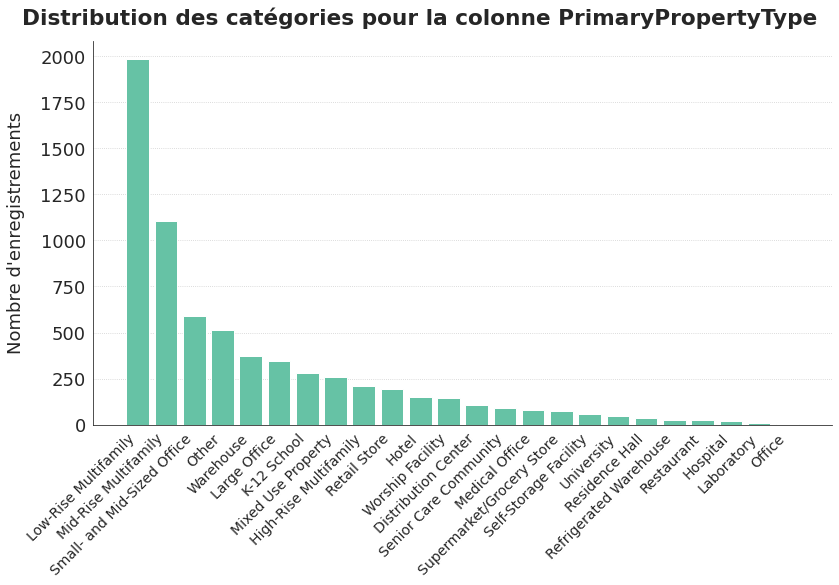

In [50]:
values = data.PrimaryPropertyType.value_counts()
graph = sfg.MyGraph("Distribution des catégories pour la colonne PrimaryPropertyType", figsize=(12,8))
graph.add_barv(values.index, values.values)
graph.set_axe_x(rotation=45, ha='right')
graph.set_axe_y(label="Nombre d'enregistrements")
ticklabels = graph.ax[0].xaxis.get_ticklabels()
graph.ax[0].set_xticklabels(ticklabels, fontsize=14)
fig, ax = graph.fig, graph.ax
save_fig("ml03_1_03_noms_identiques")
plt.show()

**Variable Largest Property Use Type**

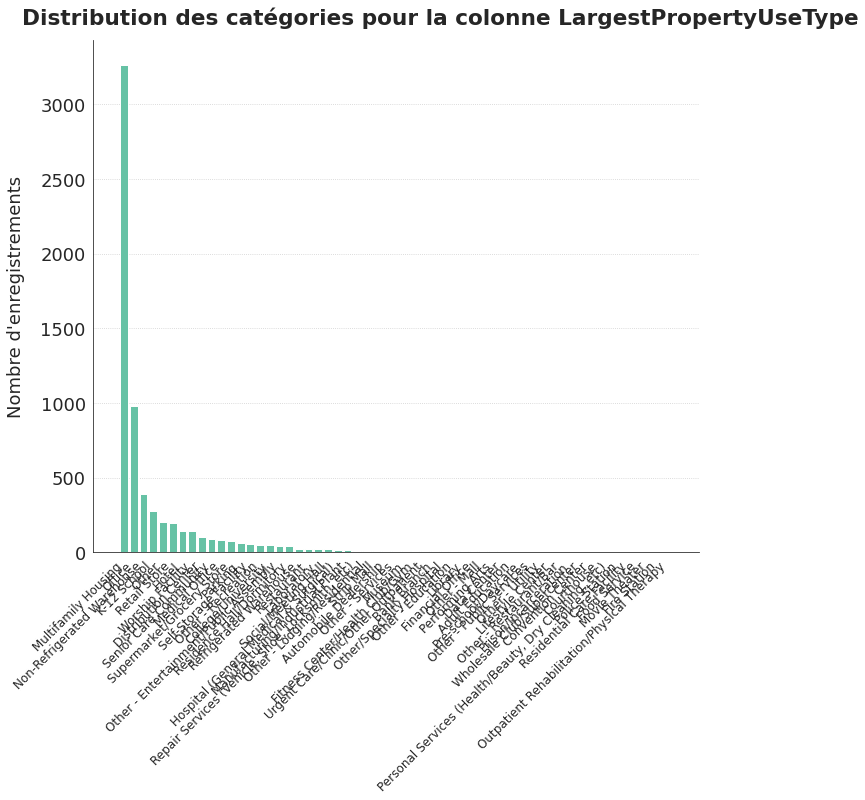

In [51]:
values = data.LargestPropertyUseType.value_counts()
graph = sfg.MyGraph("Distribution des catégories pour la colonne LargestPropertyUseType", figsize=(12,8))
graph.add_barv(values.index, values.values)
graph.set_axe_x(rotation=45, ha='right')
graph.set_axe_y(label="Nombre d'enregistrements")
ticklabels = graph.ax[0].xaxis.get_ticklabels()
graph.ax[0].set_xticklabels(ticklabels, fontsize=12)
fig, ax = graph.fig, graph.ax
plt.show()

In [52]:
values

Multifamily Housing                                     3265
Office                                                   977
Non-Refrigerated Warehouse                               393
K-12 School                                              275
Other                                                    206
Retail Store                                             198
Hotel                                                    145
Worship Facility                                         141
Distribution Center                                      106
Senior Care Community                                     88
Medical Office                                            84
Supermarket/Grocery Store                                 78
Parking                                                   60
Self-Storage Facility                                     55
Other - Recreation                                        51
College/University                                        46
Other - Entertainment/Pu

In [53]:
values = data.SecondLargestPropertyUseType.value_counts()
values

Parking                                                 1857
Office                                                   419
Retail Store                                             310
Other                                                    116
Restaurant                                                83
Non-Refrigerated Warehouse                                68
Multifamily Housing                                       34
Supermarket/Grocery Store                                 28
Fitness Center/Health Club/Gym                            27
Data Center                                               26
Other - Services                                          24
Medical Office                                            23
Swimming Pool                                             18
Other - Entertainment/Public Assembly                     16
Laboratory                                                14
Distribution Center                                       14
Bank Branch             

In [54]:
values = data.ThirdLargestPropertyUseType.value_counts()
values

Retail Store                                            217
Office                                                  205
Parking                                                 135
Restaurant                                              110
Other                                                   102
Swimming Pool                                            54
Non-Refrigerated Warehouse                               36
Medical Office                                           34
Data Center                                              24
Multifamily Housing                                      22
Social/Meeting Hall                                      22
Food Service                                             22
Other - Restaurant/Bar                                   17
Bank Branch                                              12
Pre-school/Daycare                                       12
Other - Entertainment/Public Assembly                    11
Fitness Center/Health Club/Gym          

Les colonnes Largest Property Use Type, Second Largest Property Use Type, Third Largest Property Use Type comprennent beaucoup de valeurs avec une seule ou deux occurences. Cela peut poser un problème de sur-optimisation lors de la modélisation.

<a id='3_3'></a>

### 3.3. Exploration de la localisation des bâtiments

**Variable Council District Code**

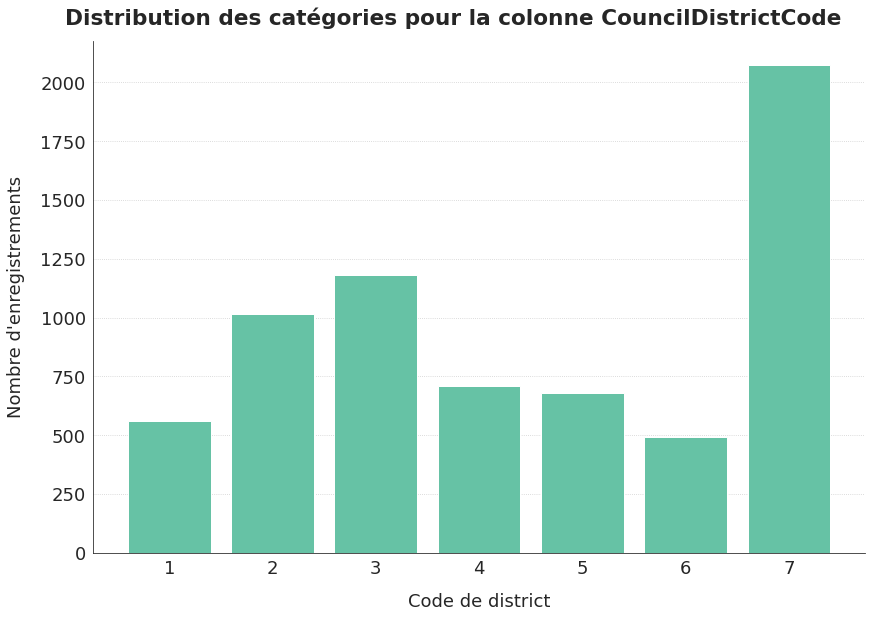

In [55]:
values = data.CouncilDistrictCode.value_counts()
graph = sfg.MyGraph("Distribution des catégories pour la colonne CouncilDistrictCode", figsize=(12,8))
graph.add_barv(values.index, values.values)
graph.set_axe_x(label="Code de district")
graph.set_axe_y(label="Nombre d'enregistrements")
fig, ax = graph.fig, graph.ax
plt.show()

Il y a 7 districts dans la ville de Seattle.

**Variable Zip Code**

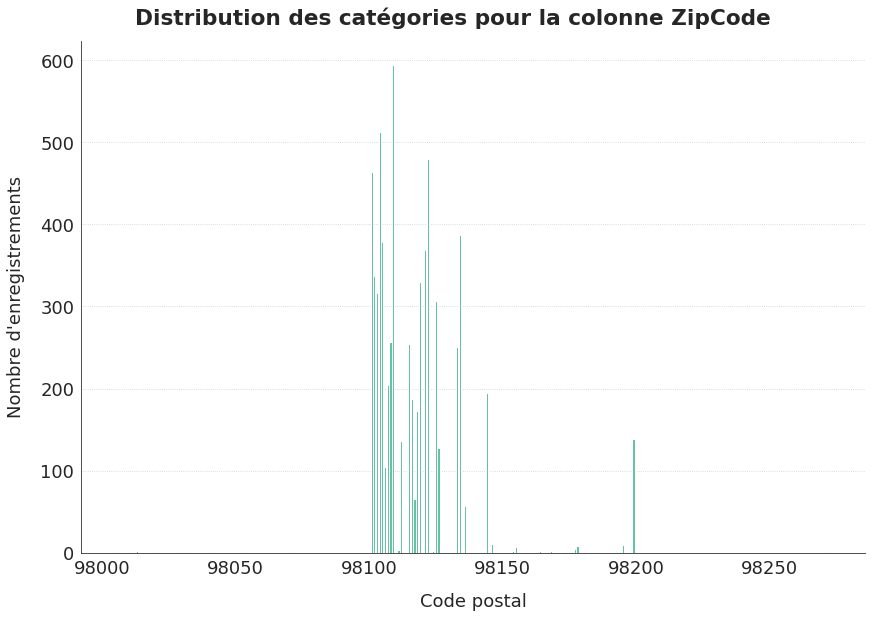

In [56]:
data["ZipCode"] = data.ZipCode.astype('float').astype('Int32')
values = data.ZipCode.value_counts()
graph = sfg.MyGraph("Distribution des catégories pour la colonne ZipCode", figsize=(12,8))
graph.add_barv(values.index, values.values)
graph.set_axe_x(label="Code postal")
graph.set_axe_y(label="Nombre d'enregistrements")
fig, ax = graph.fig, graph.ax
plt.show()

In [57]:
data.ZipCode.nunique()

55

Il y a 55 codes postaux, avec beaucoup qui ont peu de bâtiments. Cette variable ne semble pas intéressante pour répartir les bâtiments par zone géographique.

**Variable Neighborhood**

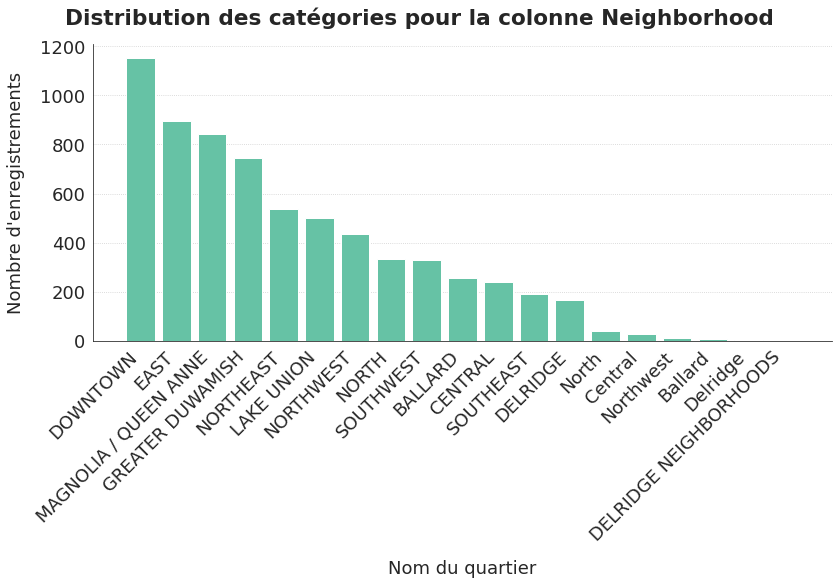

In [58]:
values = data.Neighborhood.value_counts()
graph = sfg.MyGraph("Distribution des catégories pour la colonne Neighborhood", figsize=(12,8))
graph.add_barv(values.index, values.values)
graph.set_axe_x(label="Nom du quartier", rotation=45, ha='right')
graph.set_axe_y(label="Nombre d'enregistrements")
fig, ax = graph.fig, graph.ax
save_fig("ml03_1_04_quartiers_toclean")
plt.show()

Il y a des erreurs avec des quartiers en doublon (saisies légèrement différentes). Je corrige ces erreurs.

In [0]:
data = change_ColValue(data, "Neighborhood", "DELRIDGE NEIGHBORHOODS", "Delridge")
data["Neighborhood"] = data.Neighborhood.str.title()

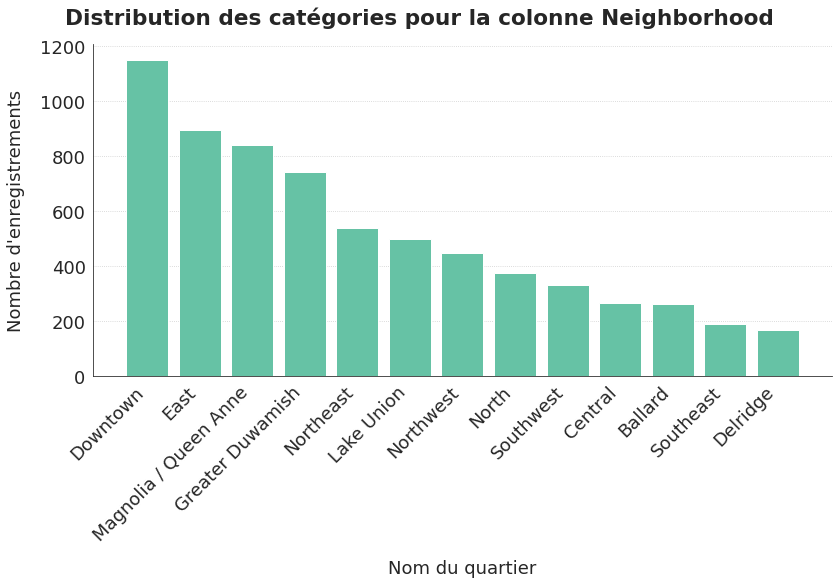

In [60]:
values = data.Neighborhood.value_counts()
graph = sfg.MyGraph("Distribution des catégories pour la colonne Neighborhood", figsize=(12,8))
graph.add_barv(values.index, values.values)
graph.set_axe_x(label="Nom du quartier", rotation=45, ha='right')
graph.set_axe_y(label="Nombre d'enregistrements")
fig, ax = graph.fig, graph.ax
save_fig("ml03_1_05_quartiers_cleaned")
plt.show()

In [61]:
data.Neighborhood.nunique()

13

Il y a 13 quartiers différents dans Seattle. Cette variable paraît la plus adaptée pour regrouper géographiquement les bâtiments. Il y a suffisamment de quartiers différents et ils comportent tous suffisamment de bâtiments.

**Comparaison des trois colonnes de localisation sur une carte**

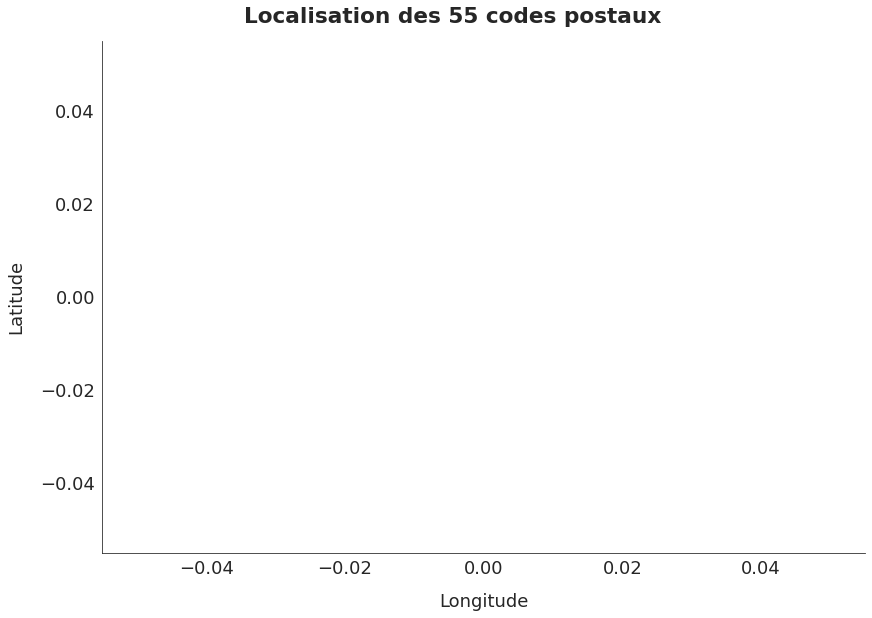

In [62]:
graph = sfg.MyGraph("Localisation des {} codes postaux".format(data.ZipCode.nunique()))
for zc in np.sort(data.ZipCode.notna().unique()):
    graph.add_plot(data[data.ZipCode==zc].Longitude, data[data.ZipCode==zc].Latitude, label=zc, marker="o", linestyle='')
graph.set_axe_x(label="Longitude")
graph.set_axe_y(label="Latitude")
fig, ax = graph.fig, graph.ax
plt.show()

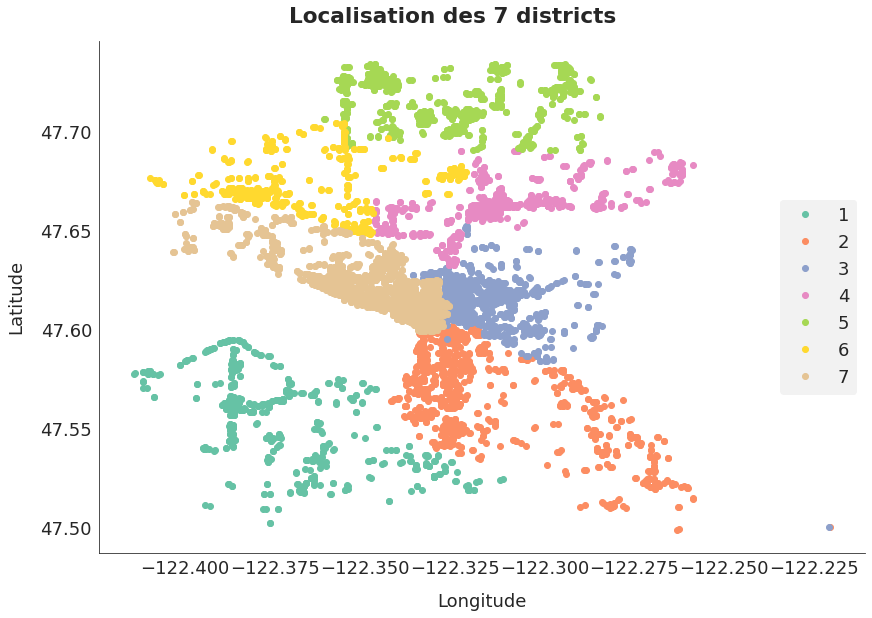

In [63]:
graph = sfg.MyGraph("Localisation des {} districts".format(data.CouncilDistrictCode.nunique()))
for cdc in np.sort(data.CouncilDistrictCode.unique()):
    graph.add_plot(data[data.CouncilDistrictCode==cdc].Longitude, data[data.CouncilDistrictCode==cdc].Latitude, label=cdc, marker="o", linestyle='')
graph.set_axe_x(label="Longitude")
graph.set_axe_y(label="Latitude")
graph.set_legend(loc='right')
fig, ax = graph.fig, graph.ax
plt.show()

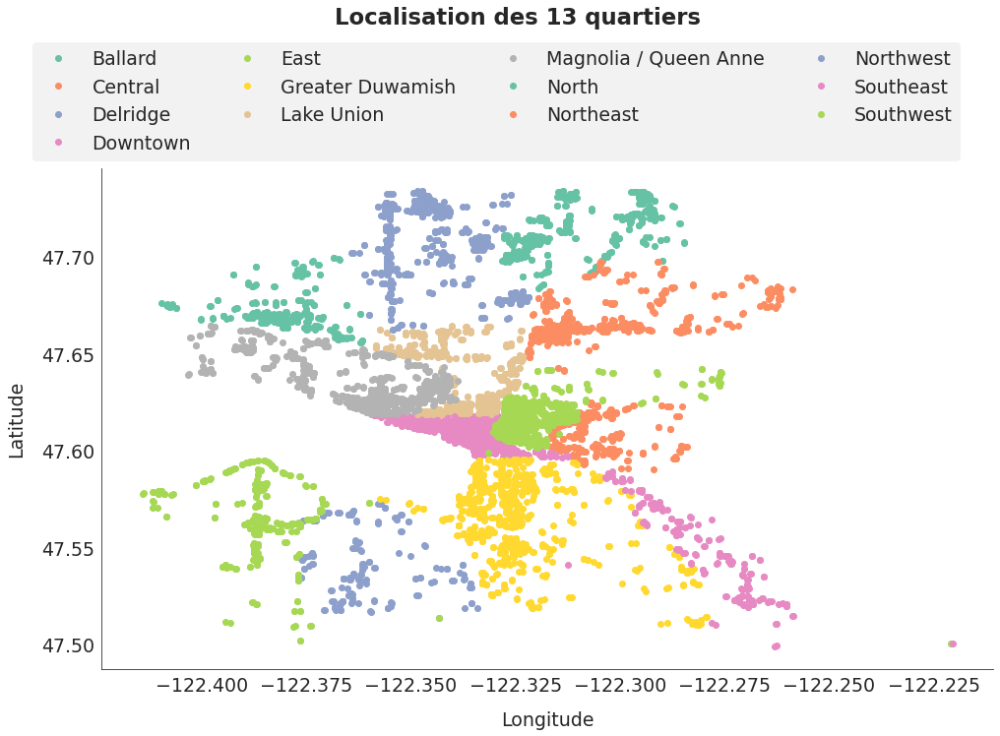

In [64]:
graph = sfg.MyGraph("Localisation des {} quartiers".format(data.Neighborhood.nunique()), y_title=1.25, figsize=(14,8))
for nb in np.sort(data.Neighborhood.unique()):
    graph.add_plot(data[data.Neighborhood==nb].Longitude, data[data.Neighborhood==nb].Latitude, label=nb, marker="o", linestyle='')
graph.set_axe_x(label="Longitude")
graph.set_axe_y(label="Latitude")
graph.set_legend(loc='lower center', bbox_to_anchor=(0.5, 1.0), ncol=4, multi_index=0)
fig, ax = graph.fig, graph.ax
save_fig("ml03_1_06_quartiers_affichage", tight_layout=False)
plt.show()

Comme vu précédemment :
- il y a trop de codes postaux différents. J'abandonne l'utilisation de cette variable.  
- Je ne conserve que les quartiers et les districts, avec une préférence pour les quartiers.

**Suppression des outliers**

Je remarque 2 outliers en bas à droite, qui sont très éloignés des autres points. Ils semblent en dehors de la ville et ils ont avec une affectation (au quartier ou au district) suspecte. Je les vérifie.

In [65]:
verif = data[data.Longitude>-122.25]
verif[["DataYear","OSEBuildingID","PropertyName","BuildingType","CouncilDistrictCode","Neighborhood","ZipCode",
       "PrimaryPropertyType","LargestPropertyUseType","SecondLargestPropertyUseType","ThirdLargestPropertyUseType",
       "Longitude","Latitude"]]

,DataYear,OSEBuildingID,PropertyName,BuildingType,CouncilDistrictCode,Neighborhood,ZipCode,PrimaryPropertyType,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,Longitude,Latitude
3126,2015,29069,THE LAKESHORE,Multifamily LR (1-4),2,Southeast,98178,Mixed Use Property,Multifamily Housing,Senior Care Community,NaN,-122.220470,47.500557
6424,2016,29069,Lakeshore,Multifamily LR (1-4),3,East,98178,Senior Care Community,Senior Care Community,Senior Care Community,NaN,-122.220966,47.500619


Il s'agit du même bâtiment (même OSEBuildingID), référencé en 2015 et en 2016. Les 2 enregistrements ont le même code postal mais des districts et des quartiers différents les 2 années.

Je supprime ce bâtiment outlier qui semble en-dehors de la ville.

In [0]:
data = data[data.OSEBuildingID != 29069]

Je remarque également que le nom n'est pas exactement le même, ni le type principal d'usage, ni la longitude et la latitude.  
Y-a-t'il d'autres enregistrements avec le problème similaire ?

<a id='3_4'></a>

### 3.4. Vérification des changements de valeurs dans les colonnes de description

Je vérifie toutes les colonnes dont les valeurs ne devraient pas changer, ou occasionnellement (gros travaux). Auparavant, je mets tous les noms de propriété dans le même format avec la fonction title().

In [0]:
data["PropertyName"] = data.PropertyName.str.title()

In [0]:
col_to_check = ["PropertyName","BuildingType","CouncilDistrictCode","Neighborhood","ZipCode","Longitude","Latitude",
                "PrimaryPropertyType","LargestPropertyUseType","SecondLargestPropertyUseType","ThirdLargestPropertyUseType",
                "LargestPropertyUseTypeGFA","SecondLargestPropertyUseTypeGFA","ThirdLargestPropertyUseTypeGFA",
                "PropertyGFABuilding(s)","PropertyGFAParking","PropertyGFATotal",
                "NumberofBuildings","NumberofFloors","YearBuilt"]

In [0]:
nbdiff = []
for col in col_to_check:
    checkdiff = 0
    for ose in data.OSEBuildingID.unique():
        if data[data.OSEBuildingID==ose][col].nunique() > 1:
            checkdiff += 1
    nbdiff.append(checkdiff)
verif = pd.DataFrame({"nombre_changements":nbdiff}, index=col_to_check)
verif.sort_values(by="nombre_changements", ascending=False, inplace=True)

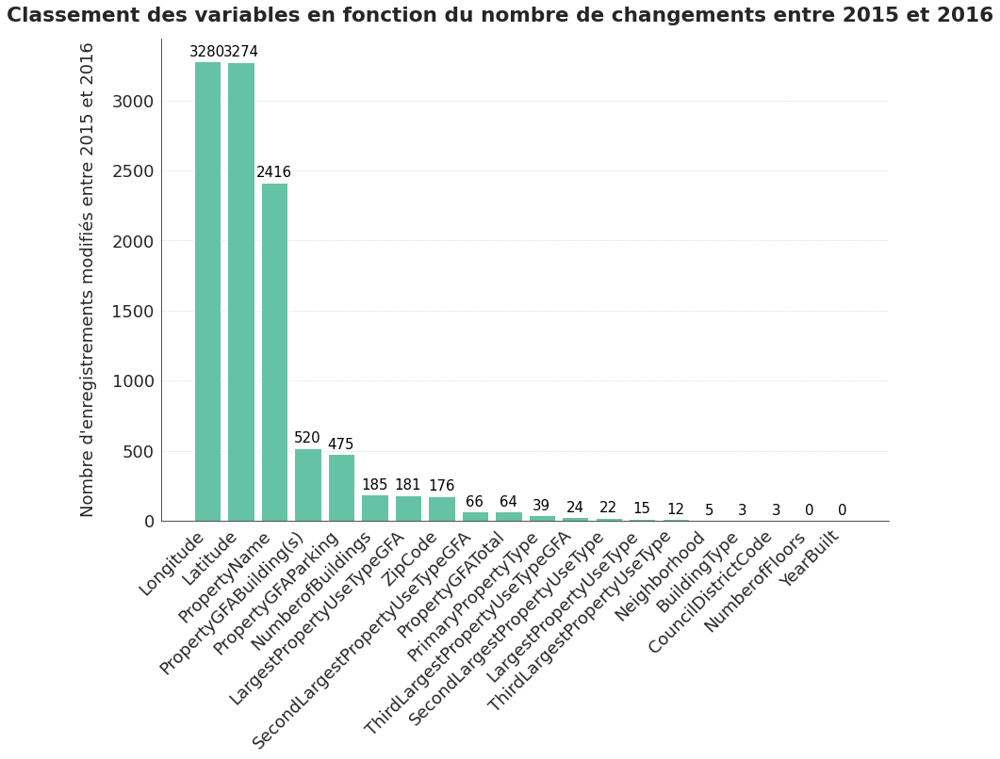

In [70]:
graph = sfg.MyGraph("Classement des variables en fonction du nombre de changements entre 2015 et 2016", figsize=(12,8))
graph.add_barv(verif.index, verif.nombre_changements)
for i, v in enumerate(verif.nombre_changements):
    graph.add_text(i, v+120, str(v), fontsize=15, backgroundalpha=0)
graph.set_axe_x(rotation=45, ha='right')
graph.set_axe_y(label="Nombre d'enregistrements modifiés entre 2015 et 2016")
fig, ax = graph.fig, graph.ax
save_fig("ml03_1_07_variables_changees", tight_layout=False)
plt.show()

Les variables PropertyName, Longitude et Latitude ne paraissent pas précises. Elles varient quasiment toutes très légèrement d'une année sur l'autre.  
Le code postal n'est pas fiable : 176 valeurs changent entre les 2 années.  
La plupart des autres variables qui changent peuvent indiquer des travaux qui ont été effectués dans le cours de l'année.  
A garder en mémoire : le nombre de buildings change pour beaucoup de propriétés entre les deux années. Est-ce dû à une différence de comptabilisation ou à des travaux ?

Il faut vérifier les lignes où BuildingType, Neighborhood et CouncilDistrictCode changent.

#### 3.4.1. Vérification des 3 bâtiments où le type de building change

In [71]:
index_verif = []
for ose in data.OSEBuildingID.unique():
    if data[data.OSEBuildingID==ose]["BuildingType"].nunique() > 1:
        index_verif.append(ose)
data[data.OSEBuildingID.isin(index_verif)][["DataYear","OSEBuildingID","PropertyName","BuildingType",
       "PrimaryPropertyType","LargestPropertyUseType","SecondLargestPropertyUseType","ThirdLargestPropertyUseType",
       "NumberofFloors","NumberofBuildings"]]

,DataYear,OSEBuildingID,PropertyName,BuildingType,PrimaryPropertyType,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,NumberofFloors,NumberofBuildings
979,2015,20377,Washington Care Center,Multifamily LR (1-4),Senior Care Community,Senior Care Community,Parking,NaN,3.0,1.0
1711,2015,23117,Joint Training Facilities Campus,Nonresidential COS,Other,Adult Education,NaN,NaN,1.0,1.0
1727,2015,23174,Taylor Anne Condominium,Multifamily MR (5-9),Mid-Rise Multifamily,Multifamily Housing,NaN,NaN,5.0,1.0
4306,2016,20377,Washington Care Center,NonResidential,Senior Care Community,Senior Care Community,Parking,NaN,3.0,1.0
5032,2016,23117,Joint Training Facilities Campus,Campus,Other,Adult Education,NaN,NaN,1.0,5.0
5047,2016,23174,Taylor Anne Condominium,Multifamily LR (1-4),Mid-Rise Multifamily,Multifamily Housing,NaN,NaN,5.0,1.0


**Bâtiment 20377**

Je vérifie le classement des autres bâtiments avec des soins pour les seniors.

In [72]:
data[data.PrimaryPropertyType=="Senior Care Community"].BuildingType.value_counts()

NonResidential          39
Multifamily LR (1-4)    30
Multifamily MR (5-9)    12
Multifamily HR (10+)     6
Name: BuildingType, dtype: int64

Comme il y a un service associé, je vais classer ces bâtiments en Non Résidentiel. Je considère comme résidentiels les bâtiments à seul usage d'habitation, sans service associé.

In [0]:
index_to_change = data[data.PrimaryPropertyType=="Senior Care Community"].index
data.loc[index_to_change,"BuildingType"] = "NonResidential"

**Vérification supplémentaires induites par cette observation**

Je vérifie la cohérence entre PrimaryPropertyType et BuildingType pour les autres lignes (seulement lorsqu'il y a plusieurs BuildingTypes pour un PrimaryPropertyType). Je ne veux pas de classement en Multifamily lorsqu'un service est associé aux logements.

In [74]:
for ppt in data.PrimaryPropertyType.unique():
    if data[data.PrimaryPropertyType==ppt]["BuildingType"].nunique() > 1:
        print("PrimaryPropertyType : {}".format(ppt))
        print("   BuildingTypes : " + ", ".join(data[data.PrimaryPropertyType==ppt]["BuildingType"].unique()))

PrimaryPropertyType : Hotel
   BuildingTypes : NonResidential, Multifamily HR (10+)
PrimaryPropertyType : Other
   BuildingTypes : Nonresidential COS, NonResidential, Campus, SPS-District K-12, Multifamily LR (1-4), Multifamily HR (10+), Multifamily MR (5-9)
PrimaryPropertyType : Mid-Rise Multifamily
   BuildingTypes : Multifamily MR (5-9), Multifamily LR (1-4)
PrimaryPropertyType : Mixed Use Property
   BuildingTypes : NonResidential, Campus, Multifamily LR (1-4), Multifamily MR (5-9), Nonresidential COS
PrimaryPropertyType : K-12 School
   BuildingTypes : SPS-District K-12, NonResidential, Campus
PrimaryPropertyType : University
   BuildingTypes : NonResidential, Campus, Multifamily LR (1-4), Nonresidential WA
PrimaryPropertyType : Small- and Mid-Sized Office
   BuildingTypes : NonResidential, Nonresidential COS, Multifamily LR (1-4)
PrimaryPropertyType : Distribution Center
   BuildingTypes : NonResidential, Nonresidential COS
PrimaryPropertyType : Large Office
   BuildingTypes : No

Le BuildingType des Hotel, Mixed Use Property, University, Small- and Mid-Sized Office, Residence Hall dont le building type commence par Multifamily doit être modifié en NonResidential.  
Pour la catégorie Other qui semble regrouper les valeurs non renseignées, je vérifie plus précisément.

In [0]:
list_ppt = ["Hotel","Mixed Use Property","University","Small- and Mid-Sized Office","Residence Hall"]
index_to_change = data[(data.PrimaryPropertyType.isin(list_ppt)) & (data.BuildingType.str.startswith("Multifamily"))].index
data.loc[index_to_change,"BuildingType"] = "NonResidential"

Je vérifie pour la catégorie Other

In [76]:
data[data.BuildingType.str.startswith("Multifamily")]["LargestPropertyUseType"].value_counts()

Multifamily Housing            3208
Other                             8
Other - Lodging/Residential       2
Parking                           2
Name: LargestPropertyUseType, dtype: int64

In [77]:
data[data.BuildingType.str.startswith("Multifamily") & (data.LargestPropertyUseType!="Multifamily Housing") & (data.LargestPropertyUseType.notna())]["PrimaryPropertyType"].value_counts()

Other    12
Name: PrimaryPropertyType, dtype: int64

Les seuls bâtiments classés Multifamily (donc résidentiels) qui ont un LargestPropertyUseType différent de Multifamily Housing sont les 12 bâtiments dont le PrimaryType est Other. Je change donc également leur BuildingType à NonResidential.

In [0]:
index_to_change = data[(data.PrimaryPropertyType=="Other") & (data.BuildingType.str.startswith("Multifamily"))].index
data.loc[index_to_change,"BuildingType"] = "NonResidential"

Enfin, je vérifie les bâtiments pour lesquels le type de propriété est multifamilial et dont le BuildingType ne commence pas par Multifamily.

In [79]:
data[(data.PrimaryPropertyType.str.contains("Multifamily")) & (~data.BuildingType.str.startswith("Multifamily"))]\
[["OSEBuildingID","DataYear","BuildingType","PrimaryPropertyType","PropertyName","LargestPropertyUseType"]]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,LargestPropertyUseType
1311,21481,2015,Campus,Low-Rise Multifamily,Sanitary Market - Master Campus For Pike Place...,Multifamily Housing
2481,25674,2015,NonResidential,Low-Rise Multifamily,Comet Tavern,Multifamily Housing
3984,19445,2016,NonResidential,Low-Rise Multifamily,Pacific Pointe,Multifamily Housing
4640,21481,2016,Campus,Low-Rise Multifamily,Sanitary Market,Multifamily Housing
5790,25674,2016,NonResidential,Low-Rise Multifamily,(Id25674) Comet Tavern,Multifamily Housing


In [0]:
index_to_change = data[(data.PrimaryPropertyType.str.contains("Multifamily")) & (~data.BuildingType.str.startswith("Multifamily"))].index
data.loc[index_to_change,"BuildingType"] = "Multifamily LR (1-4)"

**Bâtiment 23117**

Le nombre de buildings pour ce bâtiment a changé. Des travaux ont pu entraîner son changement de classification. Je ne modifie rien.

**Bâtiment 23174**

Le bâtiment est mal classé en 2016. Il a 5 étages et devrait être classé en Multifamily MR (5-9) comme en 2015.

In [0]:
def change_building_value(df, buildingID, col_to_change, newvalue):
    index_to_change = df[df.OSEBuildingID==buildingID].index
    df.loc[index_to_change, col_to_change] = newvalue
    return df

In [0]:
data = change_building_value(data, 23174, "BuildingType", "Multifamily MR (5-9)")

#### 3.4.2. Vérification des 3 bâtiments où le district change

Le district change pour 3 bâtiments. Il faut vérifier leur localisation : sont-ils à la limite de 2 quartiers ou districts ?

In [83]:
index_verif = []
for ose in data.OSEBuildingID.unique():
    if data[data.OSEBuildingID==ose]["CouncilDistrictCode"].nunique() > 1:
        index_verif.append(ose)
data[data.OSEBuildingID.isin(index_verif)][["DataYear","OSEBuildingID","PropertyName","BuildingType",
                                            "ZipCode","CouncilDistrictCode","Neighborhood",
                                            "PrimaryPropertyType","LargestPropertyUseType"]]

,DataYear,OSEBuildingID,PropertyName,BuildingType,ZipCode,CouncilDistrictCode,Neighborhood,PrimaryPropertyType,LargestPropertyUseType
483,2015,649,Immigration Service Building,NonResidential,98134,2,Greater Duwamish,Small- and Mid-Sized Office,Office
2506,2015,25752,Granview Apartments,Multifamily LR (1-4),98103,5,Northwest,Low-Rise Multifamily,NaN
3129,2015,29170,Chief Seattle Club/Monterey Lofts,NonResidential,98104,2,Downtown,Mixed Use Property,Multifamily Housing
3821,2016,649,Inscape,NonResidential,98134,3,East,Small- and Mid-Sized Office,Office
5814,2016,25752,Granview Apartments,Multifamily LR (1-4),98103,6,Northwest,Low-Rise Multifamily,NaN
6427,2016,29170,Chief Seattle Club/Monterey Lofts,NonResidential,98104,3,East,Mixed Use Property,Multifamily Housing


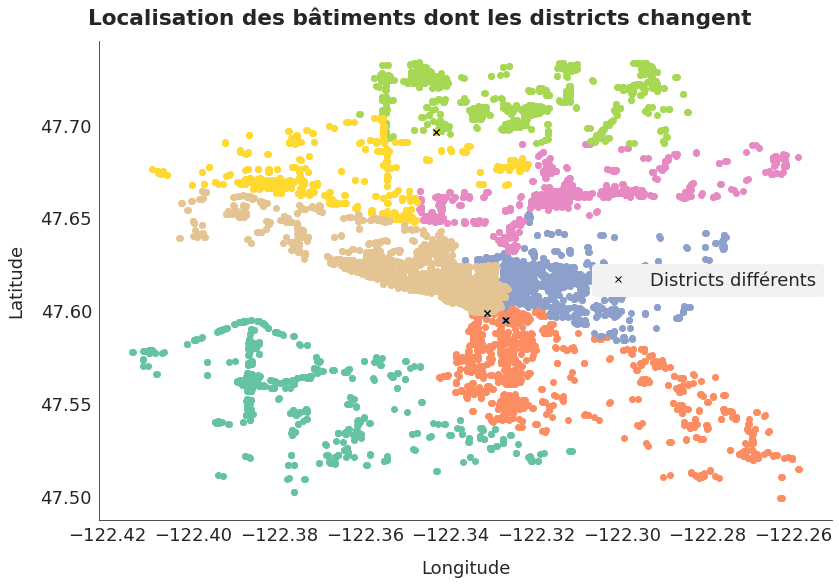

In [84]:
graph = sfg.MyGraph("Localisation des bâtiments dont les districts changent")
for cdc in np.sort(data.CouncilDistrictCode.unique()):
    graph.add_plot(data[data.CouncilDistrictCode==cdc].Longitude, data[data.CouncilDistrictCode==cdc].Latitude, label="", marker="o", linestyle='')
graph.add_plot(data[data.OSEBuildingID.isin(index_verif)].Longitude, data[data.OSEBuildingID.isin(index_verif)].Latitude, label="Districts différents", marker="x", color='black', linestyle='')
graph.set_axe_x(label="Longitude")
graph.set_axe_y(label="Latitude")
graph.set_legend(loc='right')
fig, ax = graph.fig, graph.ax
save_fig("ml03_1_08_districts_differents")
plt.show()

Zooms sur les points à analyser

**Premier bâtiment**

In [0]:
zoomdata = data[(data.Longitude.between(-122.36,-122.33)) & (data.Latitude.between(47.68,47.72))].copy()
buildingID = zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].OSEBuildingID

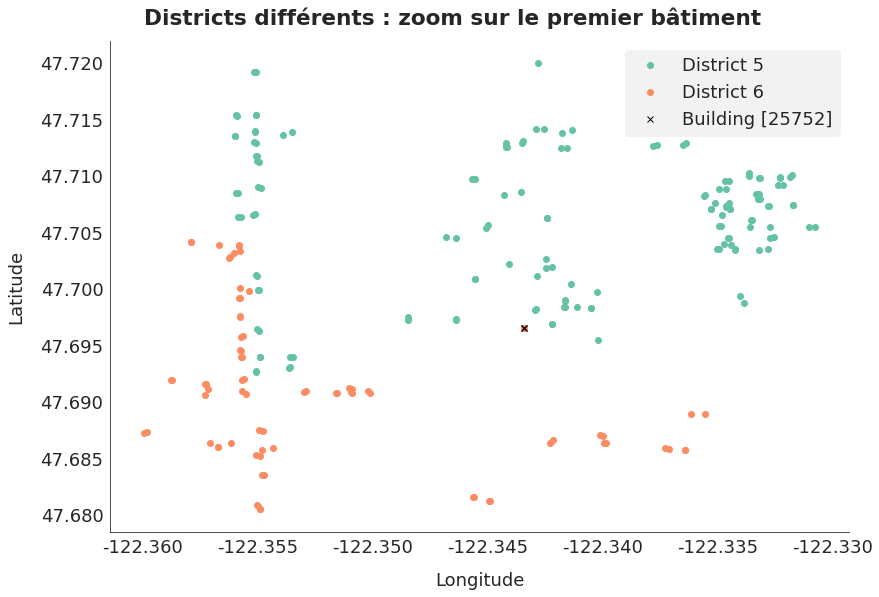

In [86]:
graph = sfg.MyGraph("Districts différents : zoom sur le premier bâtiment")
for cdc in np.sort(zoomdata.CouncilDistrictCode.unique()):
    graph.add_plot(zoomdata[zoomdata.CouncilDistrictCode==cdc].Longitude, zoomdata[zoomdata.CouncilDistrictCode==cdc].Latitude, label="District {}".format(cdc), marker="o", linestyle='')
graph.add_plot(zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Longitude, zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Latitude, label="Building {}".format(list(np.unique(buildingID))), marker="x", color='black', linestyle='', legend=True)
graph.set_axe_x(label="Longitude", tick_labels_format=':.3f')
graph.set_axe_y(label="Latitude")
fig, ax = graph.fig, graph.ax
plt.show()

Le building 25752 semble plutôt appartenir au district 5 qu'au district 6.

In [0]:
data = change_building_value(data, 25752, "CouncilDistrictCode", 5)

**Deuxième bâtiment**

In [0]:
zoomdata = data[(data.Longitude.between(-122.35,-122.33)) & (data.Latitude.between(47.59,47.61))].copy()
buildingID = zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].OSEBuildingID

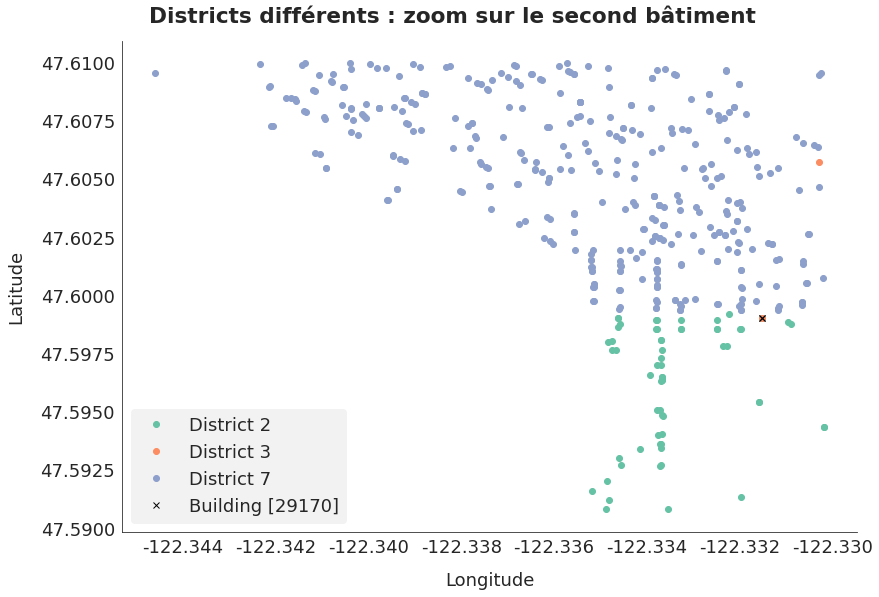

In [89]:
graph = sfg.MyGraph("Districts différents : zoom sur le second bâtiment")
for cdc in np.sort(zoomdata.CouncilDistrictCode.unique()):
    graph.add_plot(zoomdata[zoomdata.CouncilDistrictCode==cdc].Longitude, zoomdata[zoomdata.CouncilDistrictCode==cdc].Latitude, label="District {}".format(cdc), marker="o", linestyle='')
graph.add_plot(zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Longitude, zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Latitude, label="Building {}".format(list(np.unique(buildingID))), marker="x", color='black', linestyle='', legend=True)
graph.set_axe_x(label="Longitude", tick_labels_format=':.3f')
graph.set_axe_y(label="Latitude")
fig, ax = graph.fig, graph.ax
plt.show()

In [90]:
zoomdata[zoomdata.OSEBuildingID.isin(index_verif)][["DataYear","OSEBuildingID","PropertyName","BuildingType",
                                                    "ZipCode","CouncilDistrictCode","Neighborhood"]]

,DataYear,OSEBuildingID,PropertyName,BuildingType,ZipCode,CouncilDistrictCode,Neighborhood
3129,2015,29170,Chief Seattle Club/Monterey Lofts,NonResidential,98104,2,Downtown
6427,2016,29170,Chief Seattle Club/Monterey Lofts,NonResidential,98104,3,East


Le building 29170 appartient au district 2, et non pas au district 3.

In [0]:
data = change_building_value(data, 29170, "CouncilDistrictCode", 2)

**Troisième bâtiment**

In [0]:
zoomdata = data[(data.Longitude.between(-122.33,-122.31)) & (data.Latitude.between(47.59,47.61))].copy()
buildingID = zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].OSEBuildingID

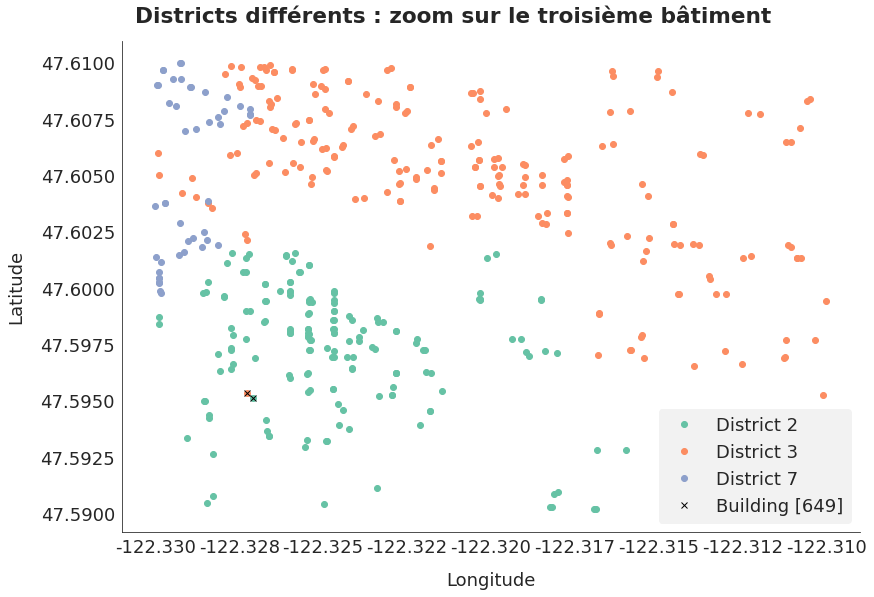

In [93]:
graph = sfg.MyGraph("Districts différents : zoom sur le troisième bâtiment")
for cdc in np.sort(zoomdata.CouncilDistrictCode.unique()):
    graph.add_plot(zoomdata[zoomdata.CouncilDistrictCode==cdc].Longitude, zoomdata[zoomdata.CouncilDistrictCode==cdc].Latitude, label="District {}".format(cdc), marker="o", linestyle='')
graph.add_plot(zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Longitude, zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Latitude, label="Building {}".format(list(np.unique(buildingID))), marker="x", color='black', linestyle='', legend=True)
graph.set_axe_x(label="Longitude", tick_labels_format=':.3f')
graph.set_axe_y(label="Latitude")
fig, ax = graph.fig, graph.ax
plt.show()

Le building 649 appartient au district 2, et non pas au district 3.

In [0]:
data = change_building_value(data, 649, "CouncilDistrictCode", 2)

#### 3.4.3. Vérification des 5 bâtiments où le quartier change

Le quartier change pour 5 bâtiments. Il faut vérifier leur localisation : sont-ils à la limite de 2 quartiers ou districts ?

In [95]:
index_verif = []
for ose in data.OSEBuildingID.unique():
    if data[data.OSEBuildingID==ose]["Neighborhood"].nunique() > 1:
        index_verif.append(ose)
data[data.OSEBuildingID.isin(index_verif)][["DataYear","OSEBuildingID","PropertyName","BuildingType",
                                            "ZipCode","CouncilDistrictCode","Neighborhood",
                                            "PrimaryPropertyType","LargestPropertyUseType"]]

,DataYear,OSEBuildingID,PropertyName,BuildingType,ZipCode,CouncilDistrictCode,Neighborhood,PrimaryPropertyType,LargestPropertyUseType
483,2015,649,Immigration Service Building,NonResidential,98134,2,Greater Duwamish,Small- and Mid-Sized Office,Office
2412,2015,25464,Waterworks Office & Marina,NonResidential,98109,7,Lake Union,Small- and Mid-Sized Office,Office
2440,2015,25563,Nautical Landing,NonResidential,98109,7,Lake Union,Warehouse,Non-Refrigerated Warehouse
3129,2015,29170,Chief Seattle Club/Monterey Lofts,NonResidential,98104,2,Downtown,Mixed Use Property,Multifamily Housing
3294,2015,49911,Educare,NonResidential,98146,1,Southwest,Other,Pre-school/Daycare
3821,2016,649,Inscape,NonResidential,98134,2,East,Small- and Mid-Sized Office,Office
5724,2016,25464,Waterworks Offices + Marina,NonResidential,98109,7,Magnolia / Queen Anne,Small- and Mid-Sized Office,Office
5752,2016,25563,Nautical Landing,NonResidential,98109,7,Magnolia / Queen Anne,Warehouse,Non-Refrigerated Warehouse
6427,2016,29170,Chief Seattle Club/Monterey Lofts,NonResidential,98104,2,East,Mixed Use Property,Multifamily Housing
6593,2016,49911,Educare Early Learning Center,NonResidential,98146,1,Delridge,Other,Pre-school/Daycare


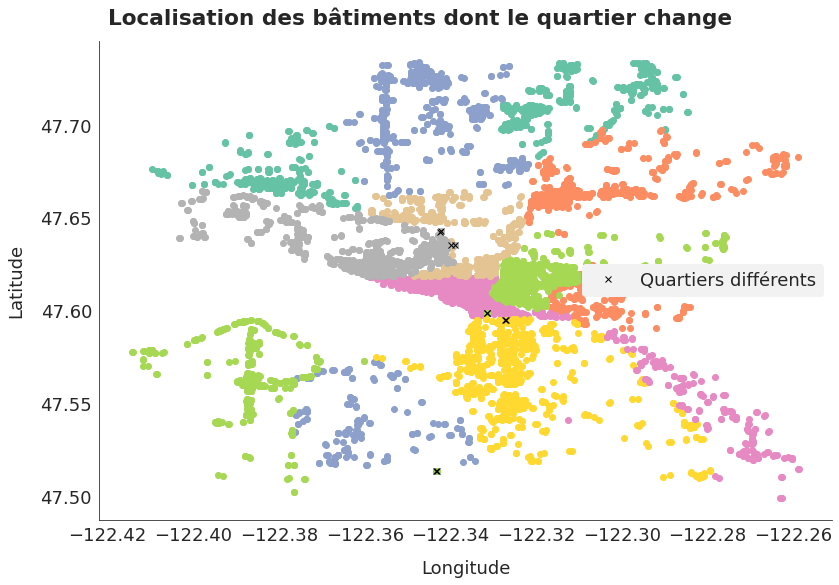

In [96]:
graph = sfg.MyGraph("Localisation des bâtiments dont le quartier change")
for nb in np.sort(data.Neighborhood.unique()):
    graph.add_plot(data[data.Neighborhood==nb].Longitude, data[data.Neighborhood==nb].Latitude, label="", marker="o", linestyle='')
graph.add_plot(data[data.OSEBuildingID.isin(index_verif)].Longitude, data[data.OSEBuildingID.isin(index_verif)].Latitude, label="Quartiers différents", marker="x", color='black', linestyle='')
graph.set_axe_x(label="Longitude")
graph.set_axe_y(label="Latitude")
graph.set_legend(loc='right')
fig, ax = graph.fig, graph.ax
save_fig("ml03_1_09_quartiers_differents")
plt.show()

Zooms sur les points à analyser

**Premier bâtiment**

In [0]:
zoomdata = data[(data.Longitude.between(-122.355,-122.34)) & (data.Latitude.between(47.63,47.66))].copy()
buildingID = zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].OSEBuildingID

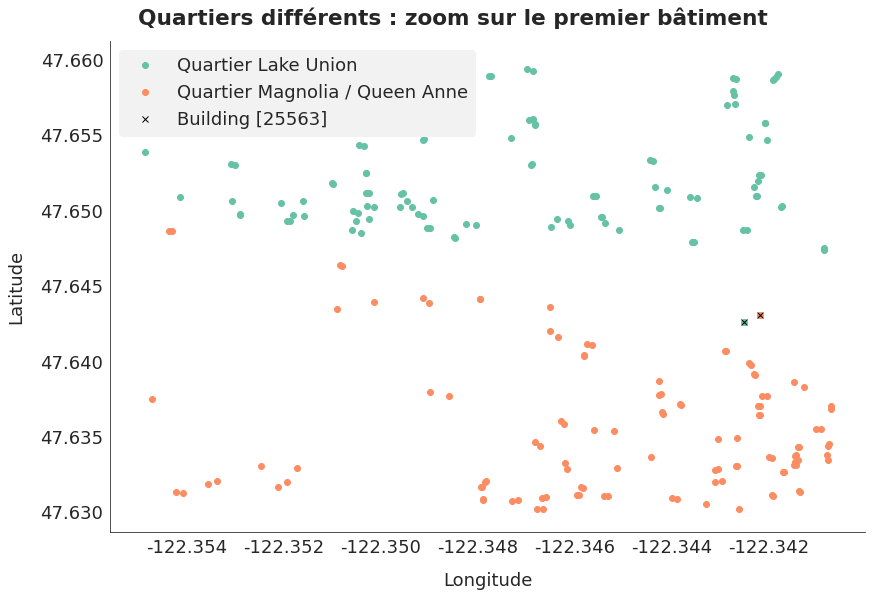

In [98]:
graph = sfg.MyGraph("Quartiers différents : zoom sur le premier bâtiment")
for nb in np.sort(zoomdata.Neighborhood.unique()):
    graph.add_plot(zoomdata[zoomdata.Neighborhood==nb].Longitude, zoomdata[zoomdata.Neighborhood==nb].Latitude, label="Quartier {}".format(nb), marker="o", linestyle='')
graph.add_plot(zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Longitude, zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Latitude, label="Building {}".format(list(np.unique(buildingID))), marker="x", color='black', linestyle='', legend=True)
graph.set_axe_x(label="Longitude", tick_labels_format=':.3f')
graph.set_axe_y(label="Latitude", tick_labels_format=':.3f')
fig, ax = graph.fig, graph.ax
plt.show()

Le building 25563 semble plutôt appartenir au quartier Magnolia / Queen Anne.

In [0]:
data = change_building_value(data, 25563, "Neighborhood", "Magnolia / Queen Anne")

**Deuxième bâtiment**

In [0]:
zoomdata = data[(data.Longitude.between(-122.342,-122.33)) & (data.Latitude.between(47.62,47.65))].copy()
buildingID = zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].OSEBuildingID

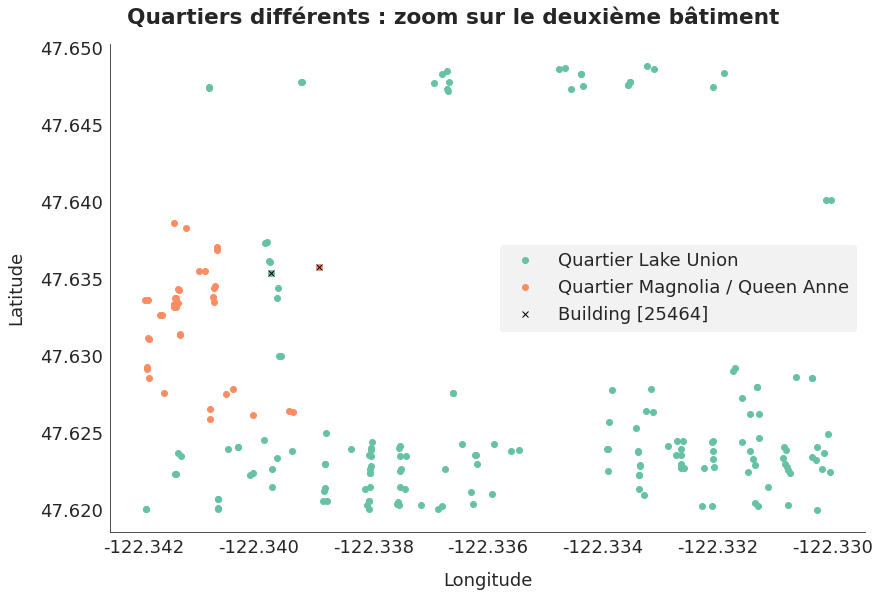

In [101]:
graph = sfg.MyGraph("Quartiers différents : zoom sur le deuxième bâtiment")
for nb in np.sort(zoomdata.Neighborhood.unique()):
    graph.add_plot(zoomdata[zoomdata.Neighborhood==nb].Longitude, zoomdata[zoomdata.Neighborhood==nb].Latitude, label="Quartier {}".format(nb), marker="o", linestyle='')
graph.add_plot(zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Longitude, zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Latitude, label="Building {}".format(list(np.unique(buildingID))), marker="x", color='black', linestyle='', legend=True)
graph.set_axe_x(label="Longitude", tick_labels_format=':.3f')
graph.set_axe_y(label="Latitude", tick_labels_format=':.3f')
fig, ax = graph.fig, graph.ax
plt.show()

Le building 25464 semble plutôt appartenir au quartier Lake Union.

In [0]:
data = change_building_value(data, 25464, "Neighborhood", "Lake Union")

**Troisième bâtiment**

In [0]:
zoomdata = data[(data.Longitude.between(-122.36,-122.33)) & (data.Latitude.between(47.50,47.55))].copy()
buildingID = zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].OSEBuildingID

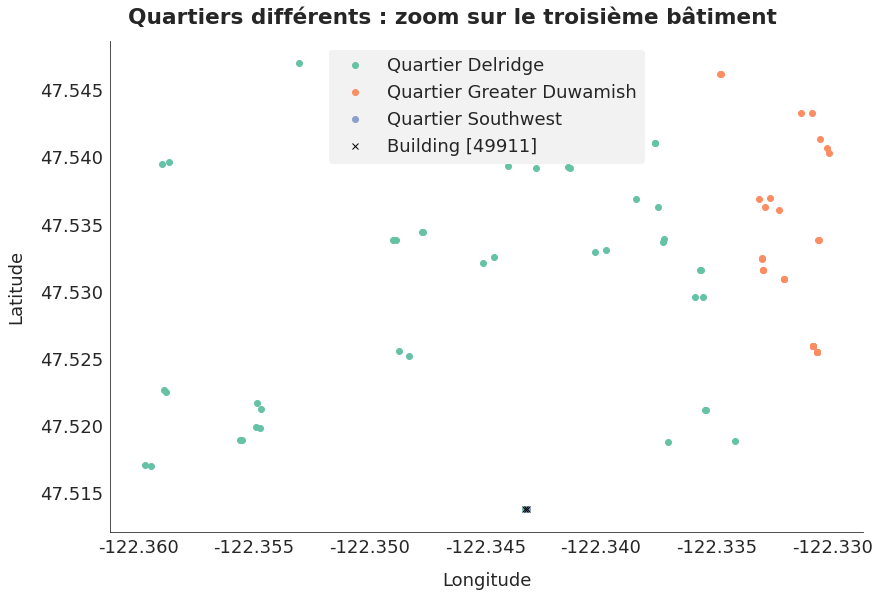

In [104]:
graph = sfg.MyGraph("Quartiers différents : zoom sur le troisième bâtiment")
for nb in np.sort(zoomdata.Neighborhood.unique()):
    graph.add_plot(zoomdata[zoomdata.Neighborhood==nb].Longitude, zoomdata[zoomdata.Neighborhood==nb].Latitude, label="Quartier {}".format(nb), marker="o", linestyle='')
graph.add_plot(zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Longitude, zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Latitude, label="Building {}".format(list(np.unique(buildingID))), marker="x", color='black', linestyle='', legend=True)
graph.set_axe_x(label="Longitude", tick_labels_format=':.3f')
graph.set_axe_y(label="Latitude", tick_labels_format=':.3f')
fig, ax = graph.fig, graph.ax
plt.show()

Le building 49911 appartient au quartier Delridge.

In [0]:
data = change_building_value(data, 49911, "Neighborhood", "Delridge")

**Quatrième bâtiment**

In [0]:
zoomdata = data[(data.Longitude.between(-122.345,-122.33)) & (data.Latitude.between(47.59,47.61))].copy()
buildingID = zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].OSEBuildingID

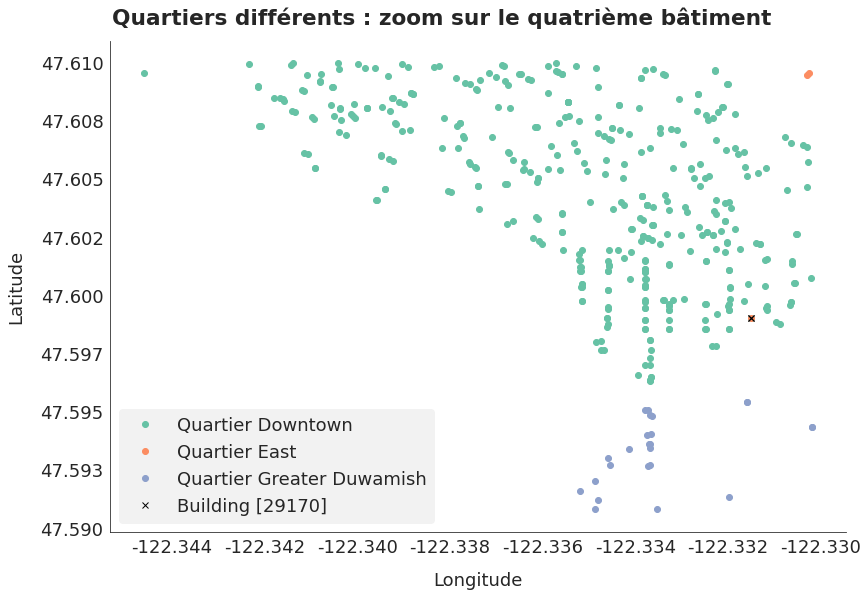

In [107]:
graph = sfg.MyGraph("Quartiers différents : zoom sur le quatrième bâtiment")
for nb in np.sort(zoomdata.Neighborhood.unique()):
    graph.add_plot(zoomdata[zoomdata.Neighborhood==nb].Longitude, zoomdata[zoomdata.Neighborhood==nb].Latitude, label="Quartier {}".format(nb), marker="o", linestyle='')
graph.add_plot(zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Longitude, zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Latitude, label="Building {}".format(list(np.unique(buildingID))), marker="x", color='black', linestyle='', legend=True)
graph.set_axe_x(label="Longitude", tick_labels_format=':.3f')
graph.set_axe_y(label="Latitude", tick_labels_format=':.3f')
fig, ax = graph.fig, graph.ax
plt.show()

Le building 29170 appartient au quartier Downtown.

In [0]:
data = change_building_value(data, 29170, "Neighborhood", "Downtown")

**Cinquième bâtiment**

In [0]:
zoomdata = data[(data.Longitude.between(-122.33,-122.315)) & (data.Latitude.between(47.59,47.61))].copy()
buildingID = zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].OSEBuildingID

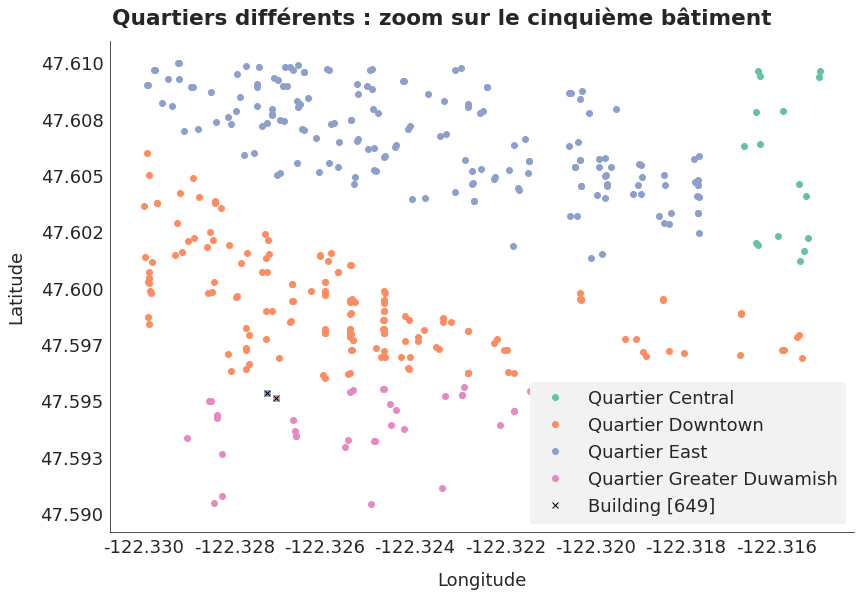

In [110]:
graph = sfg.MyGraph("Quartiers différents : zoom sur le cinquième bâtiment")
for nb in np.sort(zoomdata.Neighborhood.unique()):
    graph.add_plot(zoomdata[zoomdata.Neighborhood==nb].Longitude, zoomdata[zoomdata.Neighborhood==nb].Latitude, label="Quartier {}".format(nb), marker="o", linestyle='')
graph.add_plot(zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Longitude, zoomdata[zoomdata.OSEBuildingID.isin(index_verif)].Latitude, label="Building {}".format(list(np.unique(buildingID))), marker="x", color='black', linestyle='', legend=True)
graph.set_axe_x(label="Longitude", tick_labels_format=':.3f')
graph.set_axe_y(label="Latitude", tick_labels_format=':.3f')
fig, ax = graph.fig, graph.ax
plt.show()

Le building 649 appartient au quartier Greater Duwamish.

In [0]:
data = change_building_value(data, 649, "Neighborhood", "Greater Duwamish")

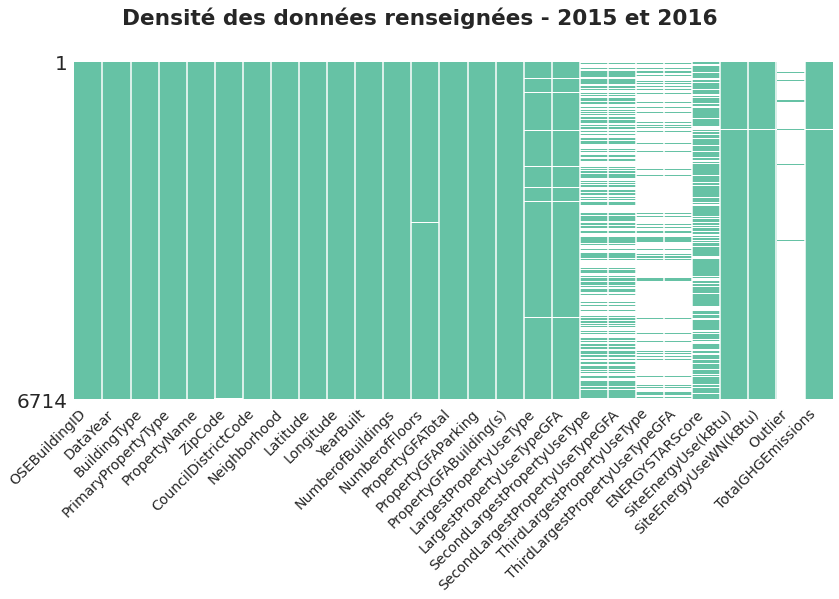

In [112]:
fig, ax = sfg.graph_densite_remplissage(data, title="Densité des données renseignées - 2015 et 2016")
plt.show()

<a id='3_5'></a>

### 3.5. Nettoyage des variables quantitatives

#### 3.5.1. Vérification DataYear et EnergyStarScore

Je vérifie que toutes les données sont bien de 2015 et 2016.

In [113]:
data.DataYear.unique()

array([2015, 2016])

Je vérifie que tous les scores EnergyStar sont compris entre 0 et 100.

In [114]:
data.ENERGYSTARScore.min()

1.0

In [115]:
data.ENERGYSTARScore.max()

100.0

#### 3.5.2. Vérification de l'absence de valeurs négatives

Je vérifie que les autres variables quantitatives sont positives.

In [0]:
list_num = ["NumberofBuildings","NumberofFloors","PropertyGFATotal","PropertyGFAParking","PropertyGFABuilding(s)",
            "LargestPropertyUseTypeGFA","SecondLargestPropertyUseTypeGFA","ThirdLargestPropertyUseTypeGFA",
            "SiteEnergyUse(kBtu)","SiteEnergyUseWN(kBtu)","TotalGHGEmissions"]

In [117]:
for col in list_num:
    if data[col].min() < 0:
        print("Problème avec la variable {} : le minimum vaut {}".format(col, data[col].min()))

Problème avec la variable PropertyGFAParking : le minimum vaut -3
Problème avec la variable PropertyGFABuilding(s) : le minimum vaut -50550
Problème avec la variable TotalGHGEmissions : le minimum vaut -0.8


Vérification de la variable PropertyGFAParking

In [118]:
len(data[data.PropertyGFAParking < 0])

2

In [119]:
data[data.PropertyGFAParking < 0][["OSEBuildingID","PropertyGFAParking"]]

,OSEBuildingID,PropertyGFAParking
2428,25530,-3
3136,29551,-2


Vérification de la variable PropertyGFABuilding(s)

In [120]:
len(data[data["PropertyGFABuilding(s)"] < 0])

2

In [121]:
data[data["PropertyGFABuilding(s)"] < 0][["OSEBuildingID","PropertyGFABuilding(s)"]]

,OSEBuildingID,PropertyGFABuilding(s)
3139,29788,-43310
3322,50002,-50550


Vérification de la variable TotalGHGEmissions

In [122]:
len(data[data.TotalGHGEmissions < 0])

1

In [123]:
data[data.TotalGHGEmissions < 0][["OSEBuildingID","TotalGHGEmissions"]]

,OSEBuildingID,TotalGHGEmissions
6546,49784,-0.8


Je ne peux pas corriger les valeurs négatives éronnées avec une autre information. Je supprime les lignes concernées.

In [0]:
def drop_neg_values(df, num_columns):
    for col in num_columns:
        if df[col].min() < 0:
            df.drop(df[df[col]<0].index, inplace=True)
    return df

In [0]:
data = drop_neg_values(data, list_num)

#### 3.5.3. Vérification des minimums

In [126]:
for col in list_num:
    print("Minimum de la variable {} : {}".format(col, data[col].min()))

Minimum de la variable NumberofBuildings : 0.0
Minimum de la variable NumberofFloors : 0.0
Minimum de la variable PropertyGFATotal : 11285
Minimum de la variable PropertyGFAParking : 0
Minimum de la variable PropertyGFABuilding(s) : 3636
Minimum de la variable LargestPropertyUseTypeGFA : 5656.0
Minimum de la variable SecondLargestPropertyUseTypeGFA : 0.0
Minimum de la variable ThirdLargestPropertyUseTypeGFA : 0.0
Minimum de la variable SiteEnergyUse(kBtu) : 0.0
Minimum de la variable SiteEnergyUseWN(kBtu) : 0.0
Minimum de la variable TotalGHGEmissions : 0.0


Le nombre de bâtiments ou d'étages ne peut pas être égal à 0. Je vérifie ces points.  
Je dois aussi vérifier les points pour lesquels la consommation d'énergie ou les émissions sont égales à 0.

In [127]:
len(data[data.NumberofFloors==0])

21

In [128]:
len(data[data.NumberofBuildings==0])

92

In [129]:
len(data[(data.NumberofFloors==0) & (data.NumberofBuildings==0)])

1

In [130]:
len(data[data["SiteEnergyUse(kBtu)"]==0])

20

In [131]:
len(data[data["SiteEnergyUseWN(kBtu)"]==0])

41

In [132]:
len(data[data["TotalGHGEmissions"]==0])

11

In [133]:
data[(data.NumberofFloors==0) & (data.NumberofBuildings==0)]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,ZipCode,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),Outlier,TotalGHGEmissions
3828,657,2016,NonResidential,Mixed Use Property,2200 Westlake - Sedo,98121,7,Downtown,47.61783,-122.33729,2006,0.0,0.0,516407,0,516407,Parking,385196.0,Multifamily Housing,340236.0,Hotel,67627.0,31.0,39403320.0,40754364.0,NaN,734.72


L'enregistrement qui n'a pas de valeur pour le nombre d'étages et de bâtiments a des valeurs de consommation énergétique et d'émissions.

<font color='red'>Les données numériques égales à 0 sont en fait des valeurs manquantes, sauf pour les superficies de parking qui peuvent être égales à 0. Je les transforme en NA et je les imputerai par la suite.</font>

In [0]:
def replace_zeros(df, list_na):
    for col in list_na:
        df[col] = df[col].replace(0, np.nan)
    return df

In [0]:
list_na = ["NumberofBuildings","NumberofFloors","SiteEnergyUse(kBtu)","SiteEnergyUseWN(kBtu)","TotalGHGEmissions",
               "SecondLargestPropertyUseTypeGFA","ThirdLargestPropertyUseTypeGFA"]
data = replace_zeros(data, list_na)

#### 3.5.4. Vérification des maximums

In [136]:
for col in list_num:
    print("Maximum de la variable {} : {}".format(col, data[col].max()))

Maximum de la variable NumberofBuildings : 111.0
Maximum de la variable NumberofFloors : 99.0
Maximum de la variable PropertyGFATotal : 9320156
Maximum de la variable PropertyGFAParking : 512608
Maximum de la variable PropertyGFABuilding(s) : 9320156
Maximum de la variable LargestPropertyUseTypeGFA : 9320156.0
Maximum de la variable SecondLargestPropertyUseTypeGFA : 686750.0
Maximum de la variable ThirdLargestPropertyUseTypeGFA : 459748.0
Maximum de la variable SiteEnergyUse(kBtu) : 873923712.0
Maximum de la variable SiteEnergyUseWN(kBtu) : 471613856.0
Maximum de la variable TotalGHGEmissions : 16870.98


Le plus grand bâtiment de Seattle a 76 étages. Les données avec plus de 76 étages doivent provenir de propriétés avec plusieurs bâtiments.

In [137]:
data[data.NumberofFloors > 76].NumberofFloors

1371    99.0
4699    99.0
Name: NumberofFloors, dtype: float64

In [138]:
data[data.NumberofFloors > 76]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,ZipCode,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),Outlier,TotalGHGEmissions
1371,21611,2015,NonResidential,Worship Facility,Chinese Baptist Church,98108,2,Greater Duwamish,47.550571,-122.302943,1977,1.0,99.0,21948,0,21948,Worship Facility,21948.0,NaN,NaN,NaN,NaN,54.0,318205.0000,318205.0000,NaN,2.22
4699,21611,2016,NonResidential,Worship Facility,Seattle Chinese Baptist Church,98108,2,Greater Duwamish,47.550720,-122.302650,1977,1.0,99.0,21948,0,21948,Worship Facility,21948.0,NaN,NaN,NaN,NaN,80.0,326001.1875,326001.1875,NaN,2.27


Il s'agit d'une église. Avec 99 étages et 1 seul bâtiment, c'est un point aberrant. Je supprime les bâtiments avec plus de 76 étages.

In [0]:
def remove_over_76floors(df):
    return df[df.NumberofFloors<=76].copy()

In [0]:
data = remove_over_76floors(data)

#### 3.5.5. Vérification que PropertyGFATotal = PropertyGFAParking + PropertyGFABuilding(s)

In [141]:
check_diff = data.PropertyGFATotal != (data.PropertyGFAParking + data["PropertyGFABuilding(s)"])
check_diff.sum()

0

Toutes les lignes ont une superficie totale égale à la somme des superficies de bâtiments et de parking. 

#### 3.5.6. Vérification du ratio entre PropertyGFATotal et la somme des superficies des différents usages.

Je vérifie également le ratio entre PropertyGFABuilding(s) et la somme des superficies des différents usages.  
Objectif : s'assurer que PropertyGFATotal et PropertyGFABuilding(s) sont bien exprimés en tant que mesures de superficie globale et non pas en tant que superficie par étage.

In [0]:
check_ratio = data[data.LargestPropertyUseTypeGFA.notna()][["LargestPropertyUseTypeGFA","SecondLargestPropertyUseTypeGFA",
                   "ThirdLargestPropertyUseTypeGFA","PropertyGFATotal","PropertyGFABuilding(s)","NumberofFloors"]].copy()
check_ratio["total_use_GFA"] = check_ratio.LargestPropertyUseTypeGFA + check_ratio.SecondLargestPropertyUseTypeGFA.fillna(0) + \
    check_ratio.ThirdLargestPropertyUseTypeGFA.fillna(0)
check_ratio["ratio_total"] = check_ratio["total_use_GFA"] / check_ratio["PropertyGFATotal"]
check_ratio["ratio_buildings"] = check_ratio["total_use_GFA"] / check_ratio["PropertyGFABuilding(s)"]

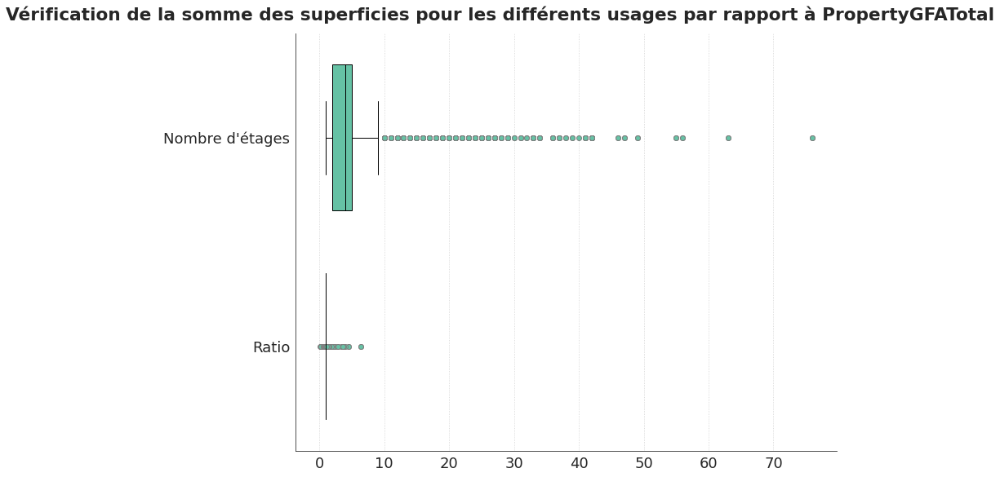

In [143]:
graph = sfg.MyGraph("Vérification de la somme des superficies pour les différents usages par rapport à PropertyGFATotal")
graph.add_boxplot([check_ratio.ratio_total, check_ratio.NumberofFloors], ["Ratio","Nombre d'étages"], vertical=False)
fig, ax = graph.fig, graph.ax
save_fig("ml03_1_10_ratio_gfas")
plt.show()

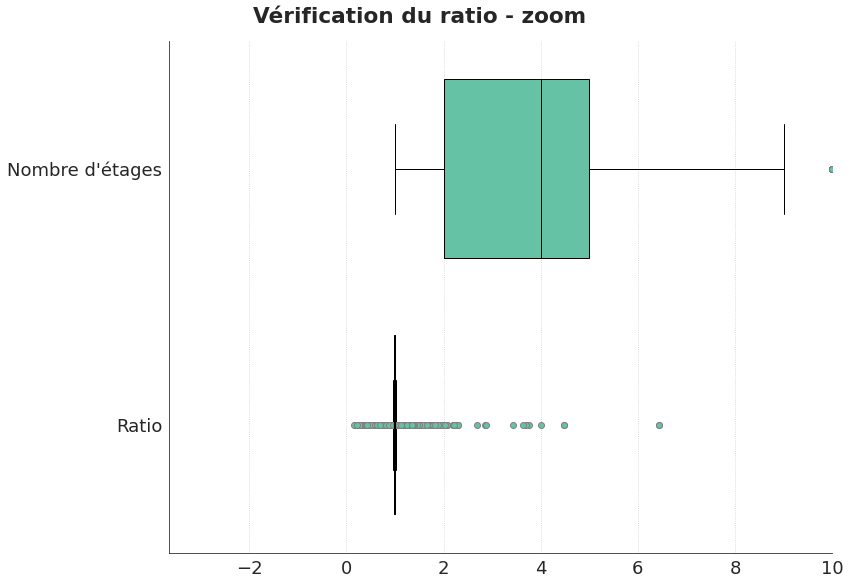

In [144]:
graph = sfg.MyGraph("Vérification du ratio - zoom")
graph.add_boxplot([check_ratio.ratio_total, check_ratio.NumberofFloors], ["Ratio","Nombre d'étages"], vertical=False)
graph.set_axe_x(tick_max=10)

In [145]:
check_ratio.ratio_total.describe()

count    6523.000000
mean        1.003309
std         0.230154
min         0.147469
25%         0.984310
50%         1.000000
75%         1.000000
max         6.426849
Name: ratio_total, dtype: float64

In [146]:
len(check_ratio[check_ratio.ratio_total > 1.1])

733

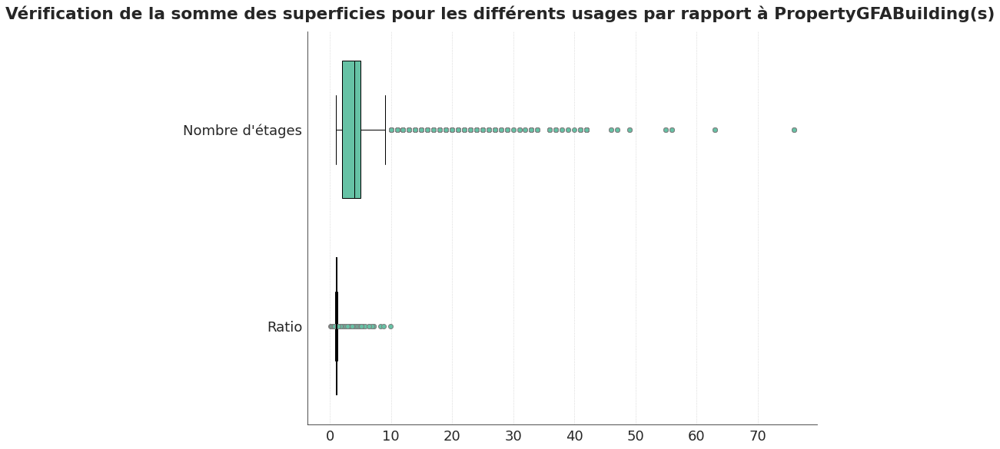

In [147]:
graph = sfg.MyGraph("Vérification de la somme des superficies pour les différents usages par rapport à PropertyGFABuilding(s)")
graph.add_boxplot([check_ratio.ratio_buildings, check_ratio.NumberofFloors], ["Ratio","Nombre d'étages"], vertical=False)

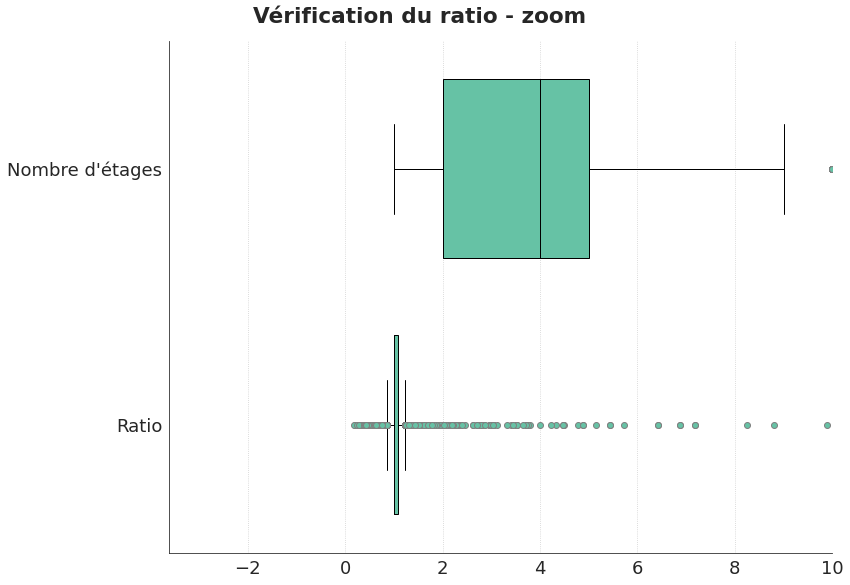

In [148]:
graph = sfg.MyGraph("Vérification du ratio - zoom")
graph.add_boxplot([check_ratio.ratio_buildings, check_ratio.NumberofFloors], ["Ratio","Nombre d'étages"], vertical=False)
graph.set_axe_x(tick_max=10)

In [149]:
check_ratio.ratio_buildings.describe()

count    6523.000000
mean        1.094793
std         0.411038
min         0.179118
25%         1.000000
50%         1.000000
75%         1.088207
max         9.900990
Name: ratio_buildings, dtype: float64

In [150]:
len(check_ratio[check_ratio.ratio_buildings > 1.1])

1586

Les données PropertyGFATotal et PropertyGFABuilding(s) sont données en superficie totale, tous étages sommés.  
Le parking étant un des usages mentionnés dans les types d'usages, le ratio à surveiller est celui basé sur PropertyGFATotal, car cette superficie inclut les parkings.  
Ce ratio devrait être inférieur ou égal à 1 (inférieur lorsque tous les usages ne sont pas renseignés). Pour laisser une marge d'erreur, je supprime tous les enregistrements dont la ratio est supérieur à 1,1.

In [0]:
index_to_remove = check_ratio[check_ratio.ratio_total > 1.1].index
data.drop(index_to_remove, inplace=True)

---
<a id='4_0'></a>

## 4. Conservation des seules données sur les biens non résidentiels

### 4.1. Suppression des bâtiments résidentiels

In [152]:
data.shape

(5945, 27)

In [153]:
data[data.DataYear==2015].shape

(2977, 27)

In [154]:
data[data.DataYear==2016].shape

(2968, 27)

In [155]:
data = data[~data.BuildingType.str.startswith("Multifamily")]
data.shape

(3035, 27)

In [156]:
data[data.DataYear==2015].shape

(1517, 27)

In [157]:
data[data.DataYear==2016].shape

(1518, 27)

<a id='4_2'></a>

### 4.2. Vérification du remplissage des variables sur les bâtiments non résidentiels

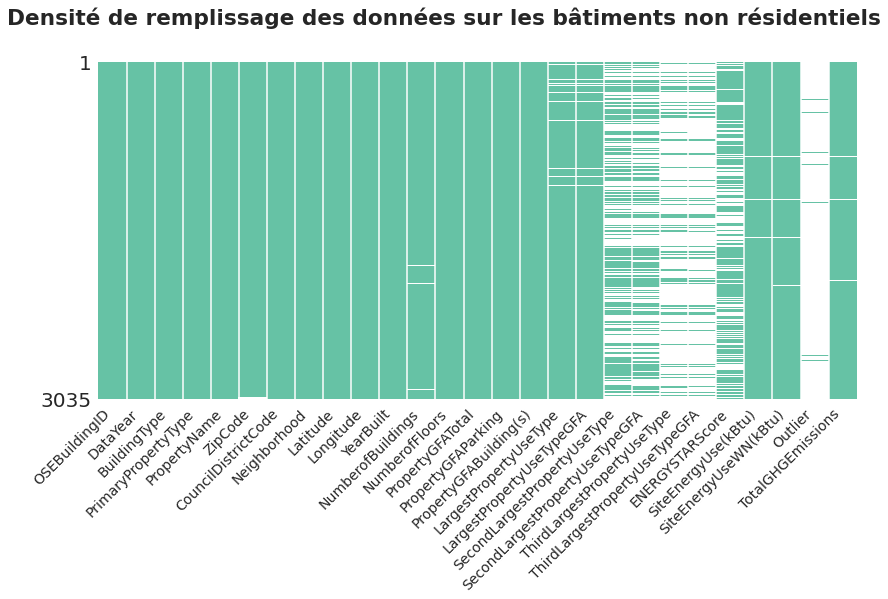

In [158]:
fig, ax = sfg.graph_densite_remplissage(data, title="Densité de remplissage des données sur les bâtiments non résidentiels")
plt.show()

In [159]:
percent_filled = pd.DataFrame(1.0 - (data.isna().sum() / len(data)), index=data.columns, columns=["percent"])
percent_filled.sort_values(by="percent", ascending=False, inplace=True)
percent_filled

,percent
OSEBuildingID,1.000000
Latitude,1.000000
PropertyGFABuilding(s),1.000000
PropertyGFAParking,1.000000
DataYear,1.000000
NumberofFloors,1.000000
YearBuilt,1.000000
Longitude,1.000000
PropertyGFATotal,1.000000
Neighborhood,1.000000


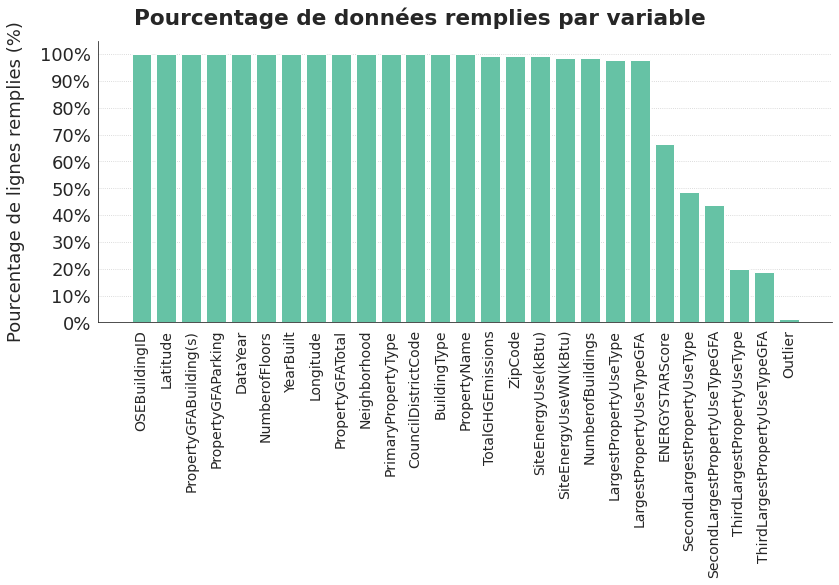

In [160]:
graph = sfg.MyGraph("Pourcentage de données remplies par variable")
graph.add_barv(percent_filled.index, percent_filled.percent)
graph.set_axe_x(rotation=90)
graph.set_axe_y(label="Pourcentage de lignes remplies (%)", tick_min=0, tick_max=1.0, tick_step=0.1, tick_labels_format=':.0%')
fig, ax = graph.fig, graph.ax
ax[0].tick_params(axis="x", labelsize=14)
save_fig("ml03_1_11_donnees_manquantes")
plt.show()

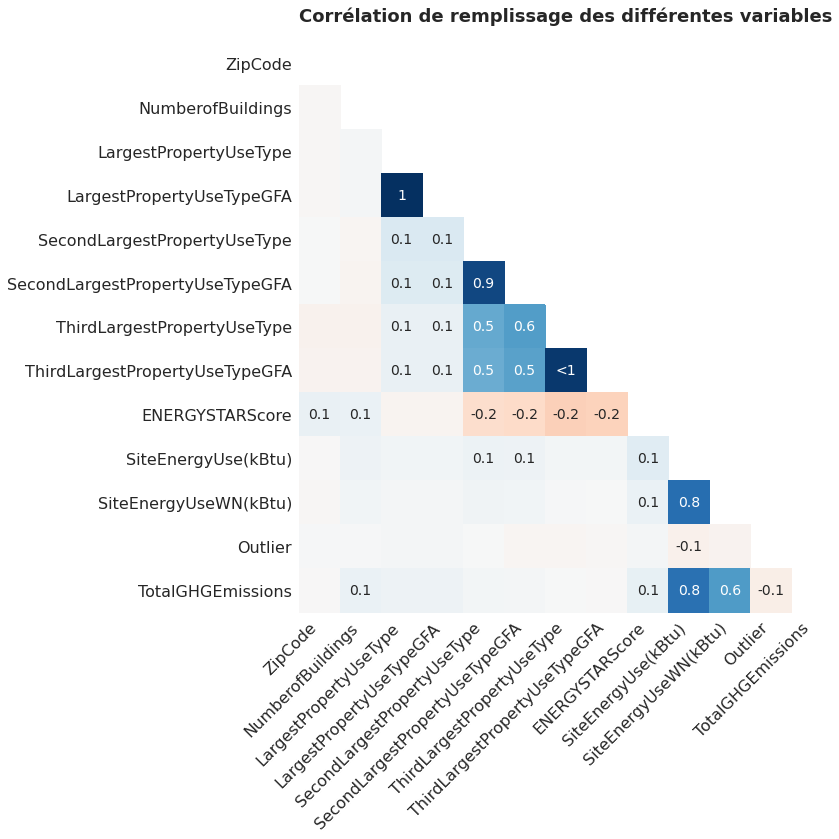

In [161]:
fig = plt.figure(figsize=(12,12))
ax = plt.axes()
msno.heatmap(data, cbar=False, ax=ax)
plt.title("Corrélation de remplissage des différentes variables", fontsize=18, y=1.05)
plt.tight_layout()
plt.show()

In [162]:
len(data[(data["SiteEnergyUseWN(kBtu)"].notna()) & (data["SiteEnergyUse(kBtu)"].isna())])

0

In [163]:
len(data[(data["TotalGHGEmissions"].notna()) & (data["SiteEnergyUse(kBtu)"].isna())])

10

In [164]:
len(data[(data["SiteEnergyUse(kBtu)"].notna()) & (data["TotalGHGEmissions"].isna())])

1

Il y un peu plus de données manquantes pour SiteEnegyUseWN que pour SiteEnergyUse. SiteEnergyUSe est toujours rempli lorsque SiteEnergyUseWN est rempli.  
**Je garde comme étiquettes les deux colonnes TotalGHGEmissions et SiteEnergyUse, et j'abandonne SiteEnergyUseWN.**  
Lors de l'entrainement et du test de mes modèles, je ne conserverai que les lignes où l'étiquette est renseignée.

In [0]:
data.drop(columns="SiteEnergyUseWN(kBtu)", inplace=True)

---
<a id='5_0'></a>

## 5. Séparation des données en set d'entraînement et de test

Je vais garder les données de 2015 comme données d'entraînement et les données de 2016 comme données de test. Cela permet d'avoir automatiquement le même type de stratification entre les biens.

In [0]:
data_train = data[data.DataYear==2015].copy()
data_test = data[data.DataYear==2016].copy()

In [0]:
data_train.to_csv("data_train.csv", index=False)
data_test.to_csv("data_test.csv", index=False)

---
<a id='6_0'></a>

## 6. Analyse des données d'entraînement

### 6.1. Analyses univariées

#### 6.1.1. Variables quantitatives

**Année de construction**

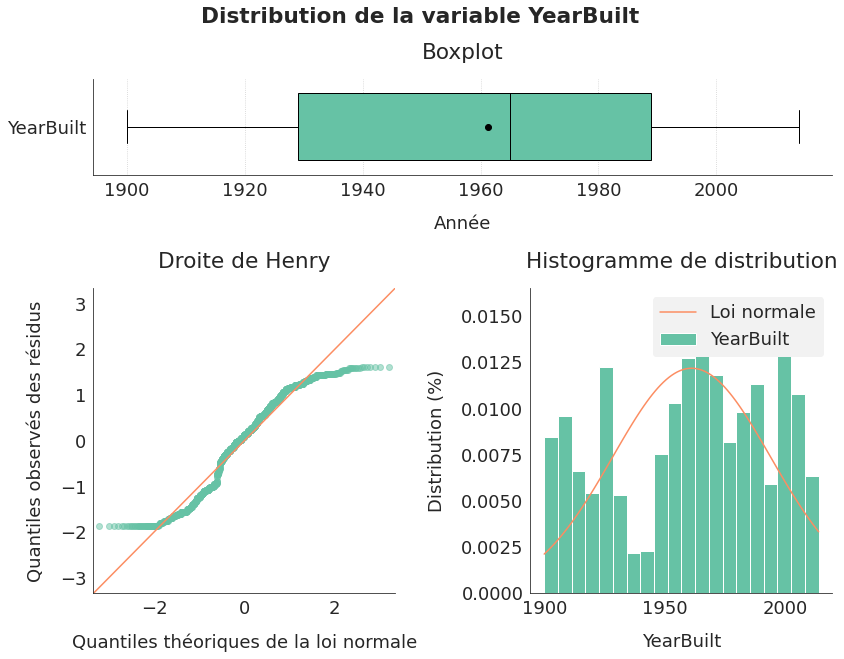

In [168]:
variable = "YearBuilt"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Année")
plt.show()

In [169]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable YearBuilt (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



<font color=red>L'année de construction ou de rénovation peut être transformée en une variable plus pertinente : l'âge de l'isolation.</font>

In [0]:
data_train["insulation_age"] = data_train.DataYear - data_train.YearBuilt

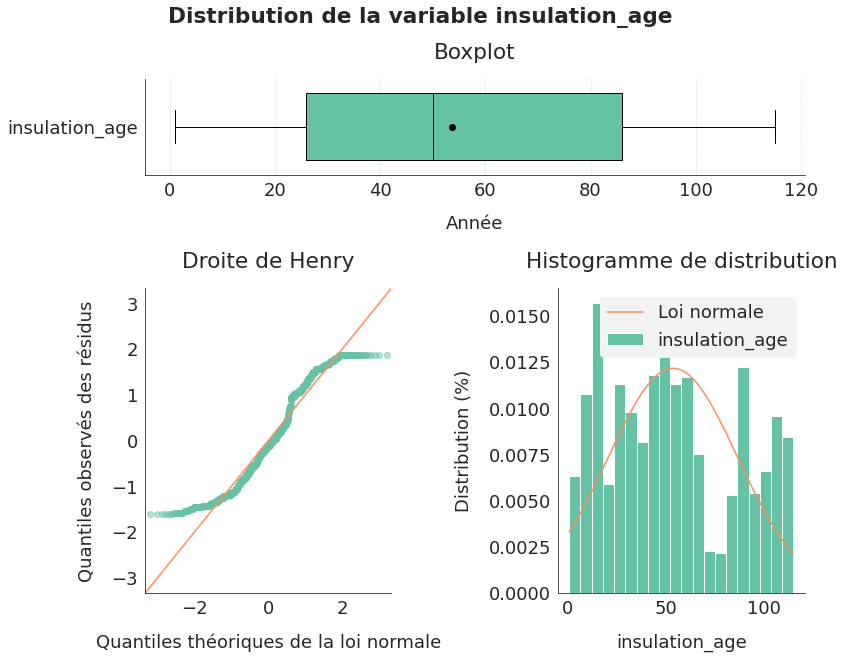

In [171]:
variable = "insulation_age"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Année")
save_fig("ml03_1_15_variable_creee1")
plt.show()

In [172]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable insulation_age (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



L'âge de l'isolation n'a pas une distribution normale, mais est une variable qui semble pertinente pour estimer la consommation énergétique et les émissions.  
Aucune transformation testée ne rapproche sa distribution de la normalité.

**Longitude et Latitude**

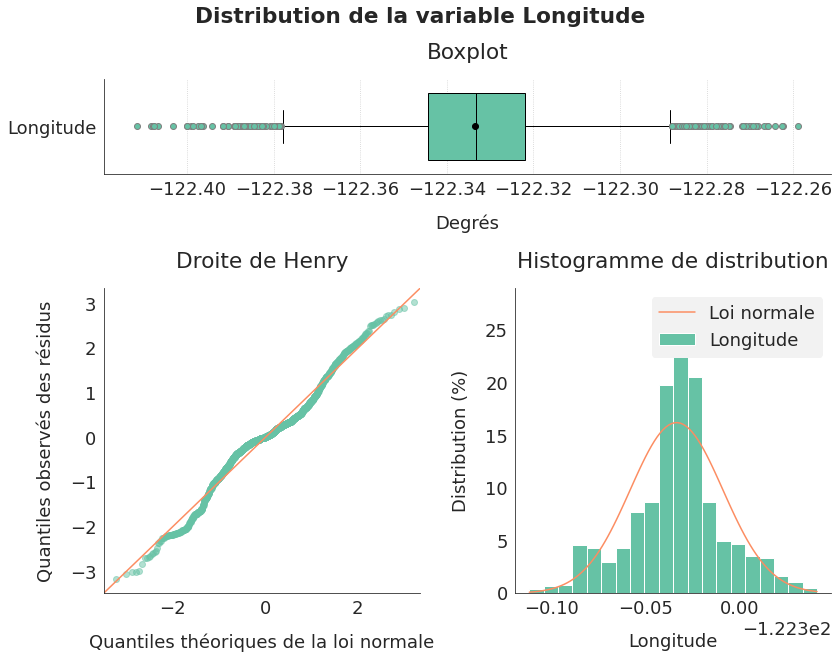

In [173]:
variable = "Longitude"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Degrés")
save_fig("ml03_1_14_variable_longitude")
plt.show()

In [174]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable Longitude (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



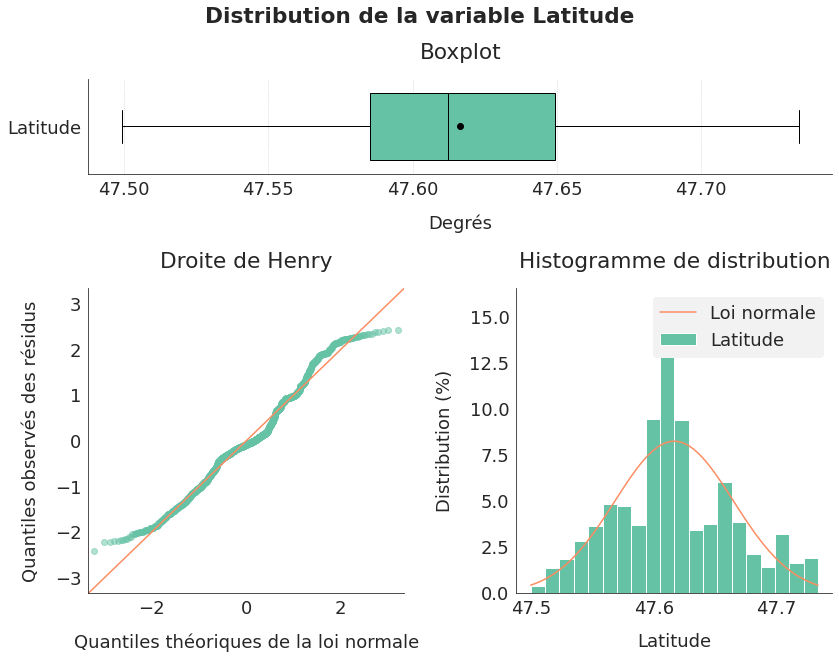

In [175]:
variable = "Latitude"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Degrés")
save_fig("ml03_1_14_variable_latitude")
plt.show()

In [176]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable Latitude (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0         0.0001               0      
Accept H0      False          False           False      



Même si les tests concluent que les variables Longitude et Latitude ne suivent pas une distribution normale, leur analyse graphique montre que l'on s'en rapproche.

**Number of Buildings**

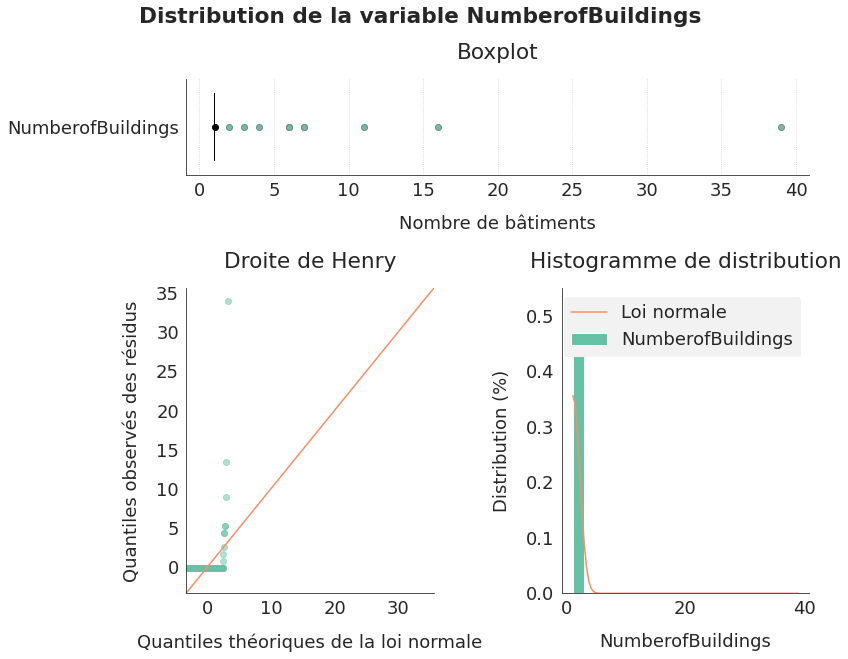

In [177]:
variable = "NumberofBuildings"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Nombre de bâtiments")
plt.show()

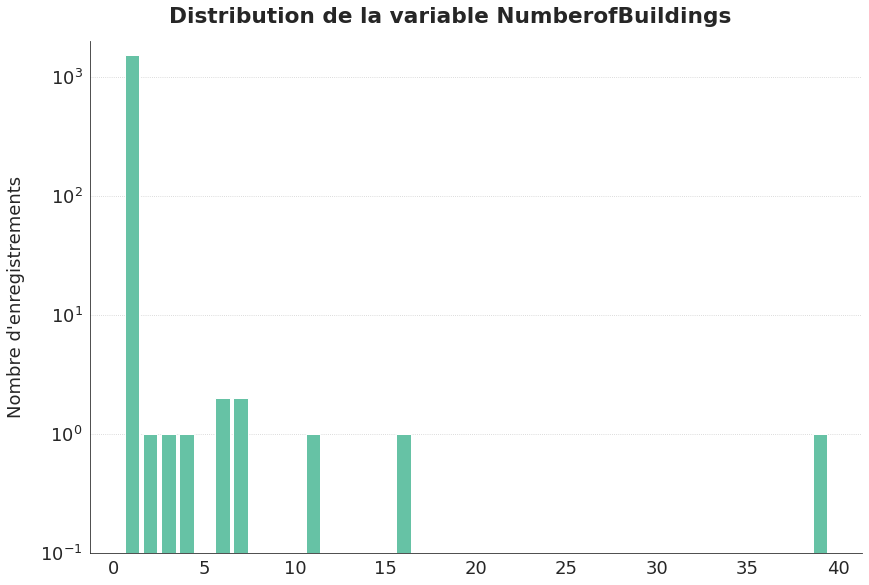

In [178]:
fig, ax = sfg.graph_analyse_variable_categ(data_train[variable].dropna(), variable, ticklabels_rotation=0)
ax[0].set_yscale('log')
ax[0].set_ylim([0.1, 2000])
plt.show()

In [179]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable NumberofBuildings (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


La grande majorité des propriétés n'a qu'un bâtiment. Avec une telle asymétrie des données, on ne peut pas rapprocher cette distribution de la normalité.  
<font color='red'>Il est plus utile de déterminer si la propriété a plusieurs bâtiments. Je crée une nouvelle variable "more_than_onebuilding".</font>

In [0]:
data_train["more_than_onebuilding"] = data_train.NumberofBuildings > 1

**Number of Floors**

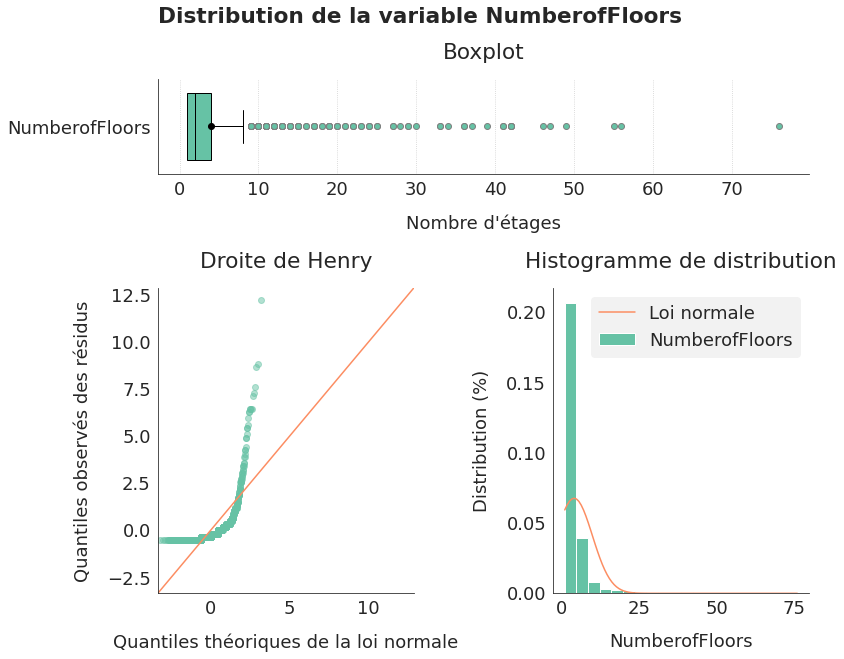

In [181]:
variable = "NumberofFloors"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Nombre d'étages")
save_fig("ml03_1_12_variables_a_transformer1")
plt.show()

In [182]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable NumberofFloors (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


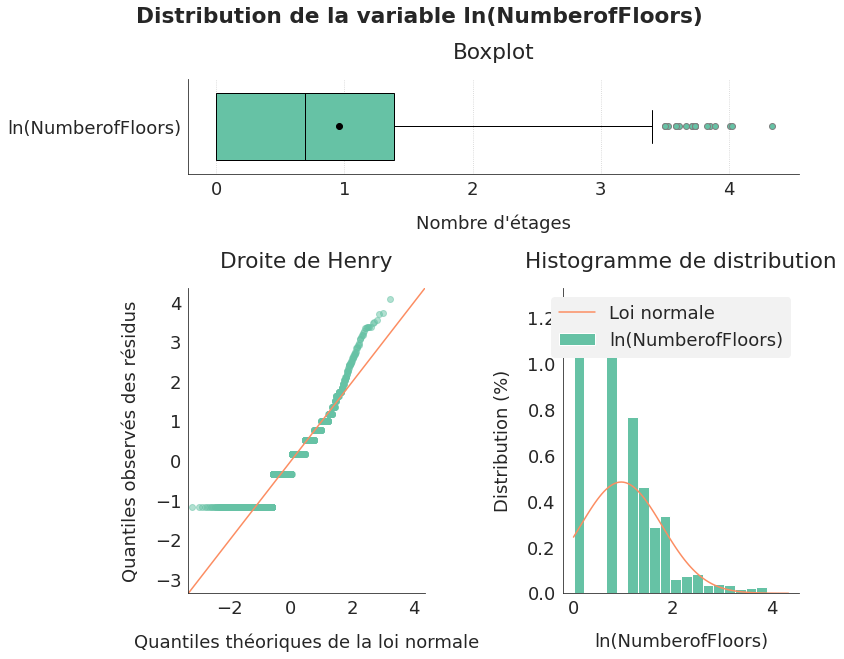

In [183]:
transfo_variable = "ln({})".format(variable)
transfo_data = np.log(data_train[variable].dropna())
fig, ax = sfg.graph_analyse_variable_quant(transfo_data, transfo_variable, "Nombre d'étages")
save_fig("ml03_1_13_variables_transformees_1")
plt.show()

In [184]:
sftd.test_normalite(transfo_data, title="Test de normalité pour la variable {}".format(transfo_variable), return_print=True)

Test de normalité pour la variable ln(NumberofFloors) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



Utiliser le log du nombre d'étages permet d'avoir une distribution avec moins d'outliers et moins de skewness positif (la moyenne se rapproche de la médiane).

In [0]:
data_train[transfo_variable] = np.where(data_train[variable].isna(), np.nan, np.log(data_train[variable]))

**Variables sur la superficie de la propriété**

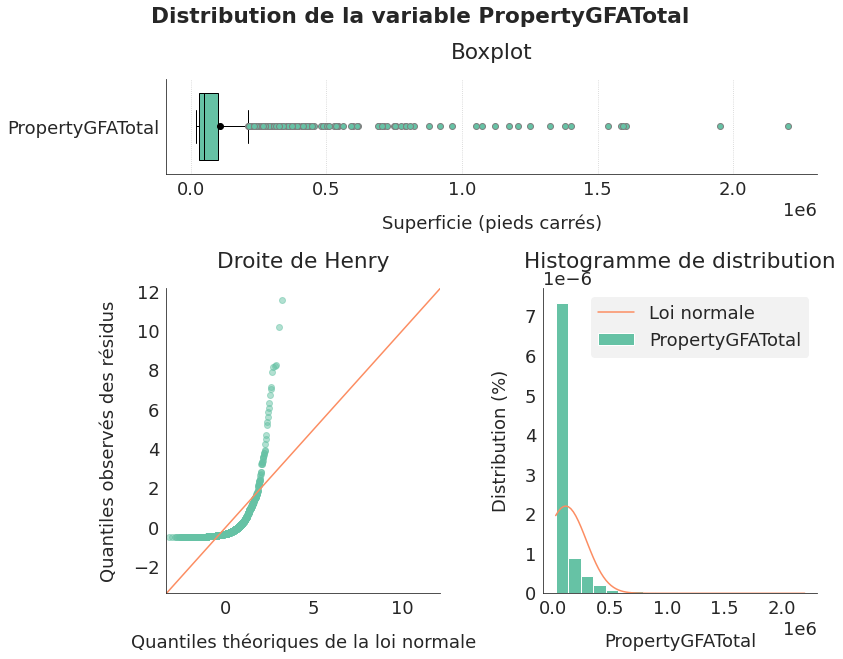

In [186]:
variable = "PropertyGFATotal"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Superficie (pieds carrés)")
save_fig("ml03_1_12_variables_a_transformer2")
plt.show()

In [187]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable PropertyGFATotal (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


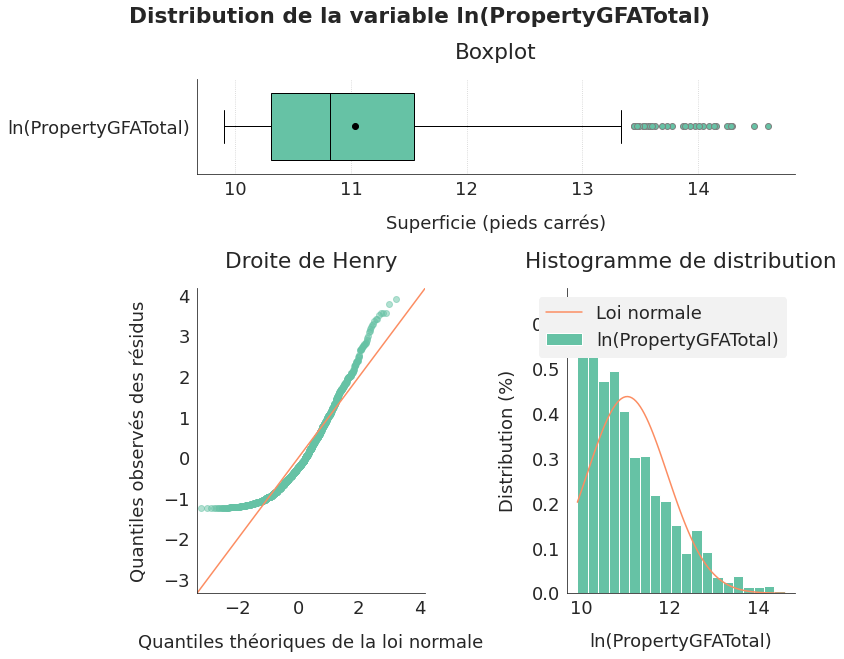

In [188]:
transfo_variable = "ln({})".format(variable)
transfo_data = np.log(data_train[variable].dropna())
fig, ax = sfg.graph_analyse_variable_quant(transfo_data, transfo_variable, "Superficie (pieds carrés)")
save_fig("ml03_1_13_variables_transformees_2")
plt.show()

In [189]:
sftd.test_normalite(transfo_data, title="Test de normalité pour la variable {}".format(transfo_variable), return_print=True)

Test de normalité pour la variable ln(PropertyGFATotal) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



In [0]:
data_train[transfo_variable] = np.where(data_train[variable].isna(), np.nan, np.log(data_train[variable]))

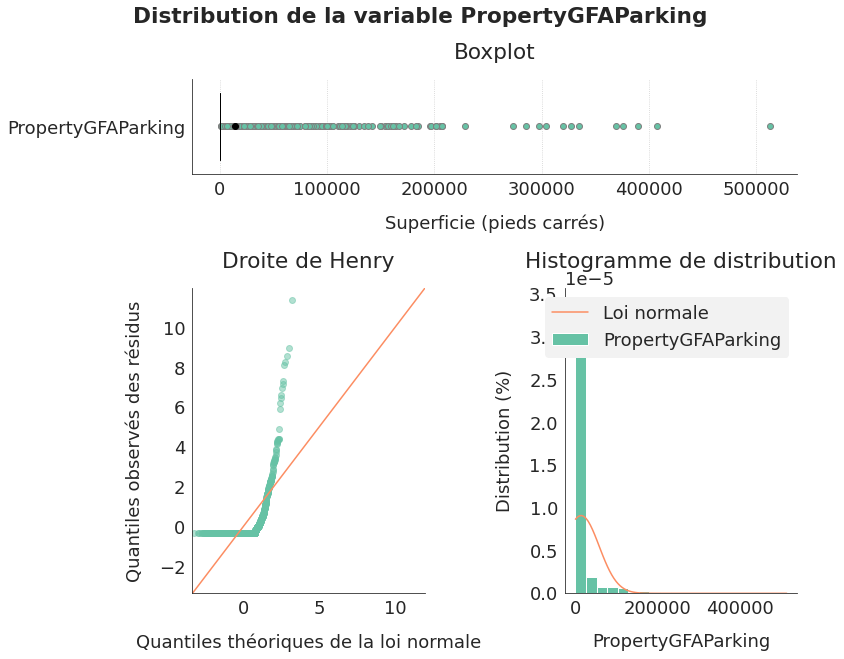

In [191]:
variable = "PropertyGFAParking"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Superficie (pieds carrés)")
save_fig("ml03_1_12_variables_a_transformer3")
plt.show()

In [192]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable PropertyGFAParking (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


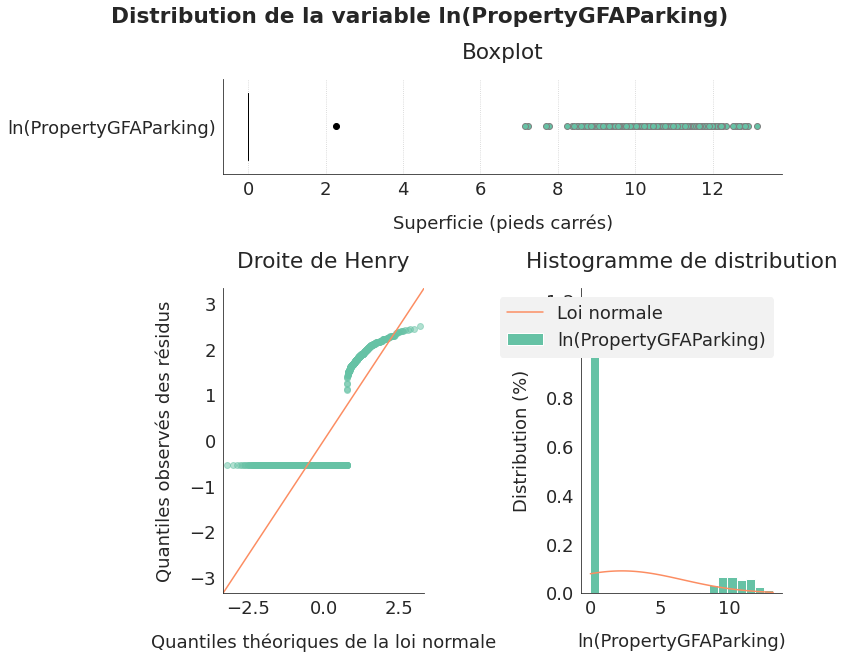

In [193]:
transfo_variable = "ln({})".format(variable)
transfo_data = np.log1p(data_train[variable].dropna())
fig, ax = sfg.graph_analyse_variable_quant(transfo_data, transfo_variable, "Superficie (pieds carrés)")
save_fig("ml03_1_13_variables_transformees_3")
plt.show()

In [194]:
sftd.test_normalite(transfo_data, title="Test de normalité pour la variable {}".format(transfo_variable), return_print=True)

Test de normalité pour la variable ln(PropertyGFAParking) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



In [0]:
data_train[transfo_variable] = np.where(data_train[variable].isna(), np.nan, np.log1p(data_train[variable]))

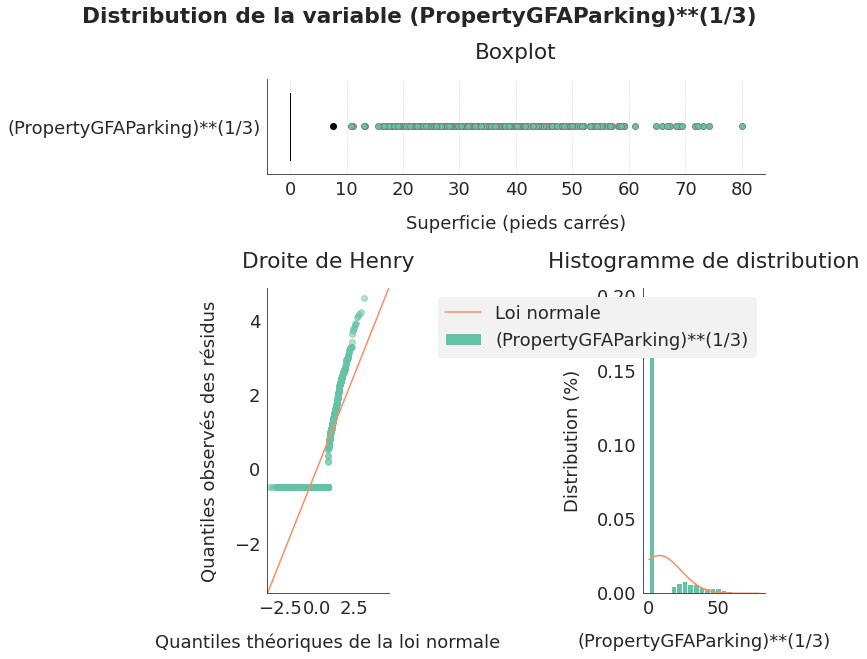

In [196]:
transfo_variable = "({})**(1/3)".format(variable)
transfo_data = np.cbrt(data_train[variable].dropna())
fig, ax = sfg.graph_analyse_variable_quant(transfo_data, transfo_variable, "Superficie (pieds carrés)")
plt.show()

In [197]:
sftd.test_normalite(transfo_data, title="Test de normalité pour la variable {}".format(transfo_variable), return_print=True)

Test de normalité pour la variable (PropertyGFAParking)**(1/3) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



Je conserve la transformation en log pour GFAParking.

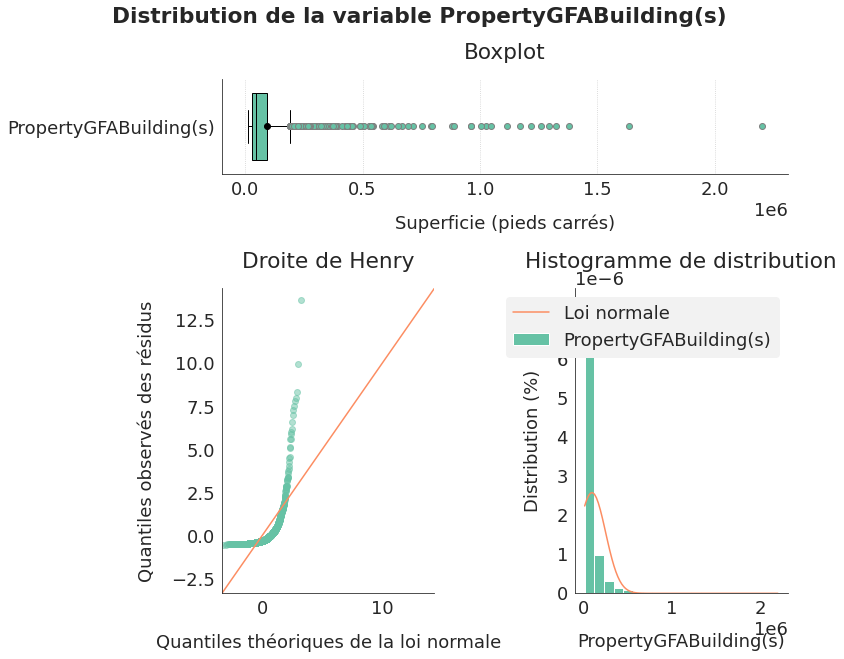

In [198]:
variable = "PropertyGFABuilding(s)"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Superficie (pieds carrés)")
save_fig("ml03_1_12_variables_a_transformer4")
plt.show()

In [199]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable PropertyGFABuilding(s) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


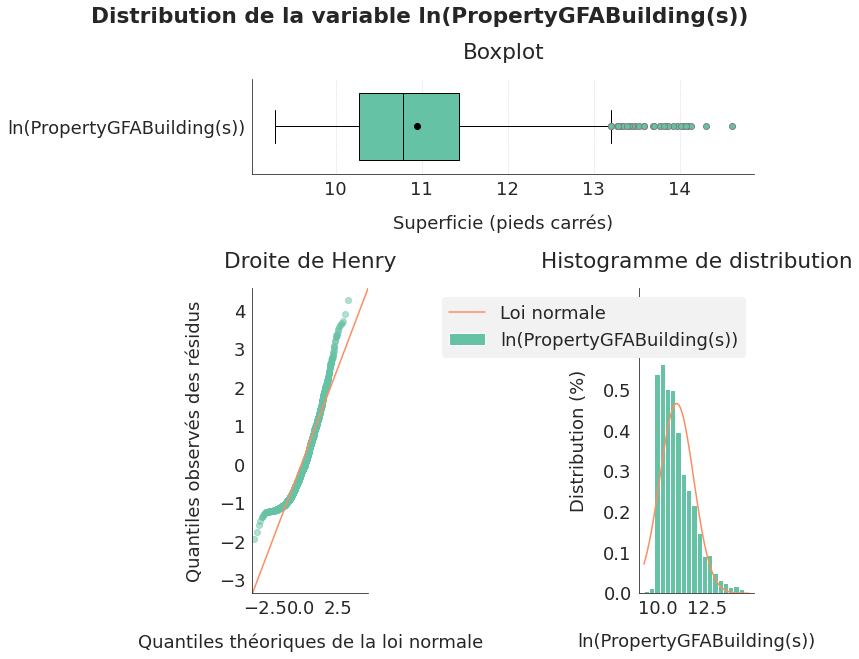

In [200]:
transfo_variable = "ln({})".format(variable)
transfo_data = np.log(data_train[variable].dropna())
fig, ax = sfg.graph_analyse_variable_quant(transfo_data, transfo_variable, "Superficie (pieds carrés)")
ax[2].set_ylim([0,0.75])
save_fig("ml03_1_13_variables_transformees_4")
plt.show()

In [201]:
sftd.test_normalite(transfo_data, title="Test de normalité pour la variable {}".format(transfo_variable), return_print=True)

Test de normalité pour la variable ln(PropertyGFABuilding(s)) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



Je conserve les log de ces variables de superficie, dont la distribution se rapproche le plus de la normalité.

In [0]:
data_train[transfo_variable] = np.where(data_train[variable].isna(), np.nan, np.log(data_train[variable]))

**Variables sur la superficie selon l'usage**

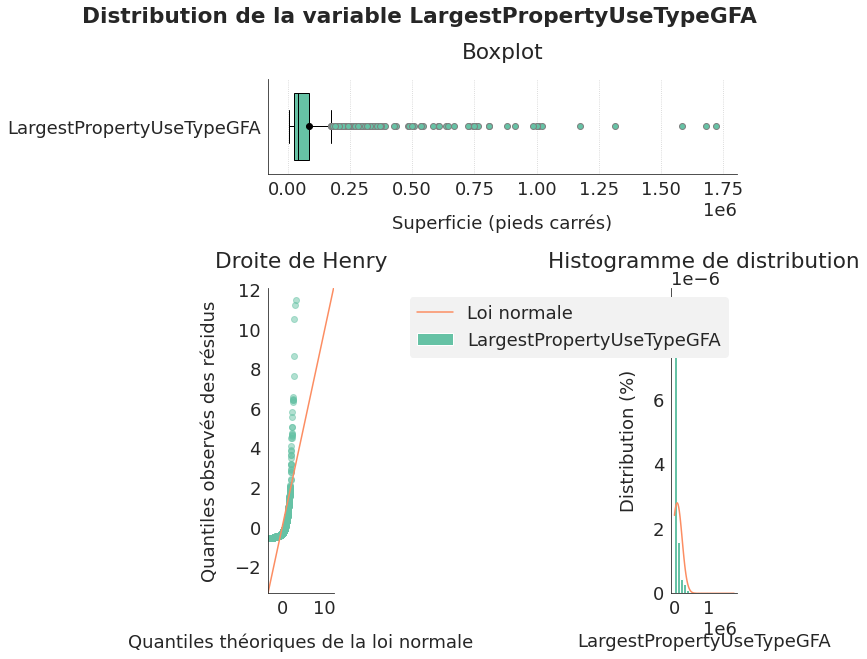

In [203]:
variable = "LargestPropertyUseTypeGFA"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Superficie (pieds carrés)")
save_fig("ml03_1_12_variables_a_transformer5")
plt.show()

In [204]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable LargestPropertyUseTypeGFA (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  import sys


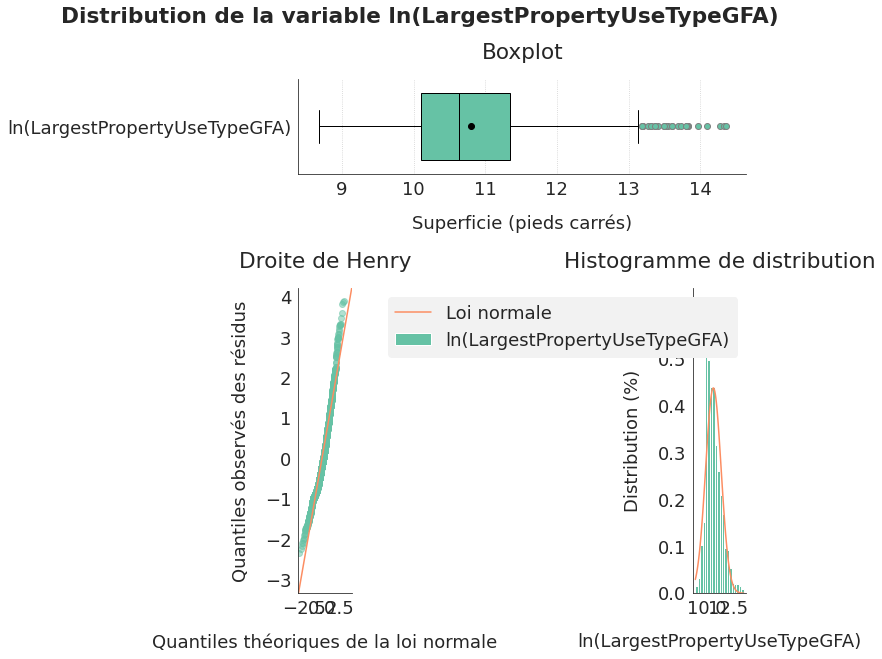

In [205]:
transfo_variable = "ln({})".format(variable)
transfo_data = np.log(data_train[variable].dropna())
fig, ax = sfg.graph_analyse_variable_quant(transfo_data, transfo_variable, "Superficie (pieds carrés)")
ax[2].set_ylim([0,0.65])
save_fig("ml03_1_13_variables_transformees_5")
plt.show()

In [206]:
sftd.test_normalite(transfo_data, title="Test de normalité pour la variable {}".format(transfo_variable), return_print=True)

Test de normalité pour la variable ln(LargestPropertyUseTypeGFA) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



In [0]:
data_train[transfo_variable] = np.where(data_train[variable].isna(), np.nan, np.log(data_train[variable]))

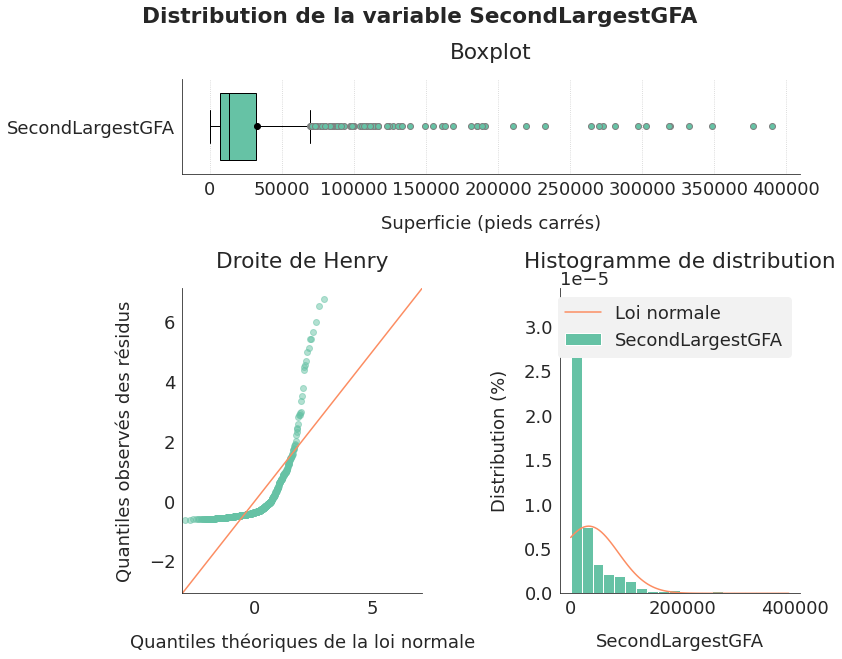

In [208]:
variable = "SecondLargestPropertyUseTypeGFA"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), "SecondLargestGFA", "Superficie (pieds carrés)")
save_fig("ml03_1_12_variables_a_transformer6")
plt.show()

In [209]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable SecondLargestPropertyUseTypeGFA (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



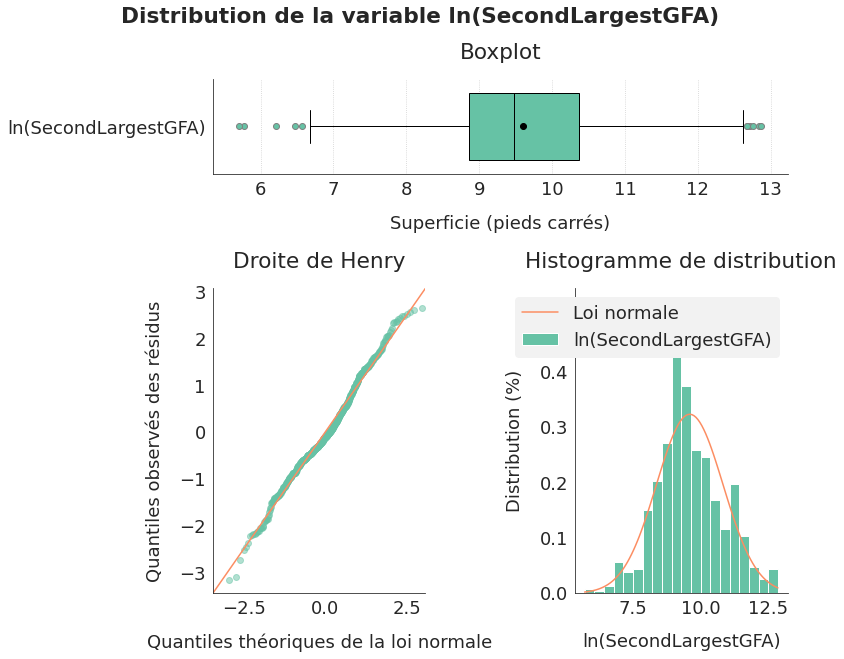

In [210]:
transfo_variable = "ln({})".format(variable)
transfo_data = np.log(data_train[variable].dropna())
fig, ax = sfg.graph_analyse_variable_quant(transfo_data, "ln(SecondLargestGFA)", "Superficie (pieds carrés)")
ax[2].set_ylim([0,0.55])
save_fig("ml03_1_13_variables_transformees_6")
plt.show()

In [211]:
sftd.test_normalite(transfo_data, title="Test de normalité pour la variable {}".format(transfo_variable), return_print=True)

Test de normalité pour la variable ln(SecondLargestPropertyUseTypeGFA) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value       0.0005         0.3203               0      
Accept H0      False           True           False      



In [0]:
data_train[transfo_variable] = np.where(data_train[variable].isna(), np.nan, np.log(data_train[variable]))

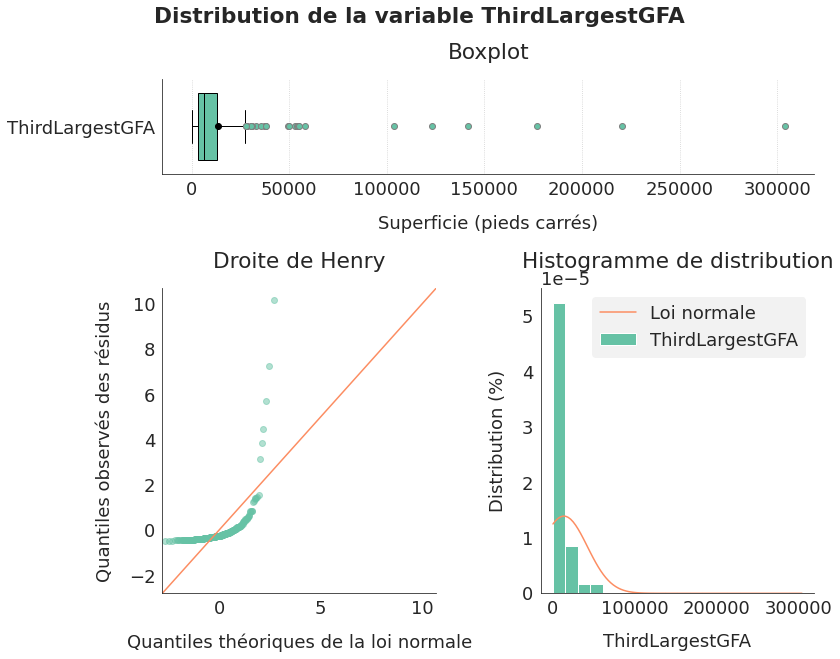

In [213]:
variable = "ThirdLargestPropertyUseTypeGFA"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), "ThirdLargestGFA", "Superficie (pieds carrés)")
save_fig("ml03_1_12_variables_a_transformer7")
plt.show()

In [214]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable ThirdLargestPropertyUseTypeGFA (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


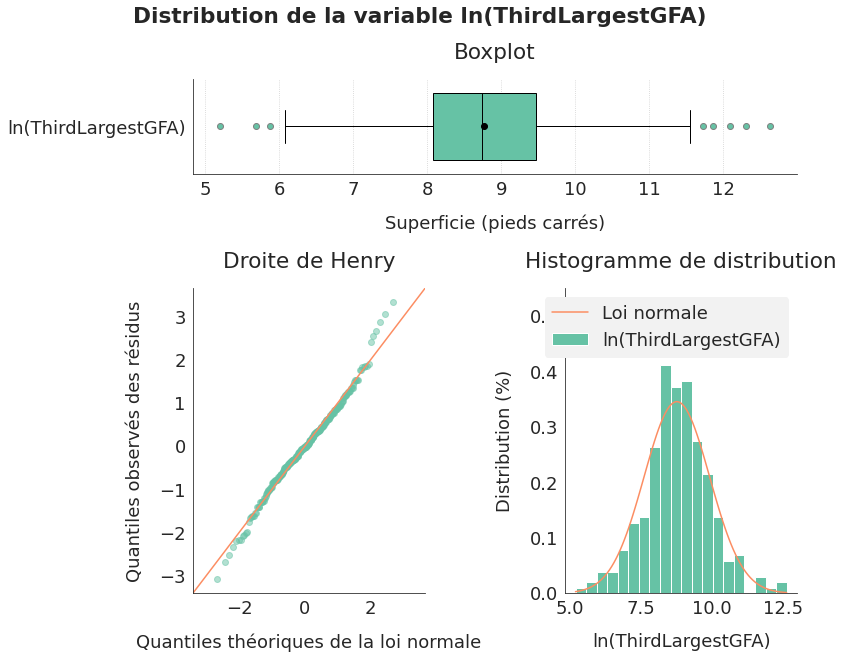

In [215]:
transfo_variable = "ln({})".format(variable)
transfo_data = np.log(data_train[variable].dropna())
fig, ax = sfg.graph_analyse_variable_quant(transfo_data, "ln(ThirdLargestGFA)", "Superficie (pieds carrés)")
ax[2].set_ylim([0,0.55])
save_fig("ml03_1_13_variables_transformees_7")
plt.show()

In [216]:
sftd.test_normalite(transfo_data, title="Test de normalité pour la variable {}".format(transfo_variable), return_print=True)

Test de normalité pour la variable ln(ThirdLargestPropertyUseTypeGFA) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value       0.0719         0.0228          0.0732      
Accept H0       True          False            True      



In [0]:
data_train[transfo_variable] = np.where(data_train[variable].isna(), np.nan, np.log(data_train[variable]))

<font color=red>Je conserve le log de ces 3 variables.</font>  
La passage au log permet de se rapprocher, voire d'atteindre selon certains tests, une distribution normale.  
J'imputerai les superficies pour les Second et Third Largest Property Use Type non renseignées par des zéros, car elles correspondent à des bâtiments avec un seul type d'usage.

**Variable du score EnergyStar**

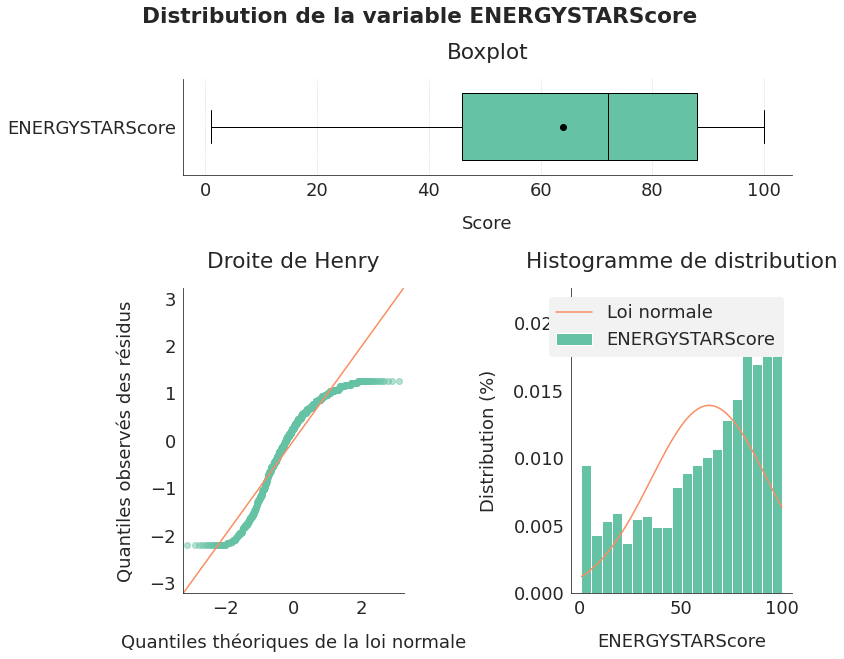

In [218]:
variable = "ENERGYSTARScore"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Score")
save_fig("ml03_1_14_variable_energystar")
plt.show()

In [219]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable ENERGYSTARScore (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



In [0]:
from sklearn.preprocessing import power_transform

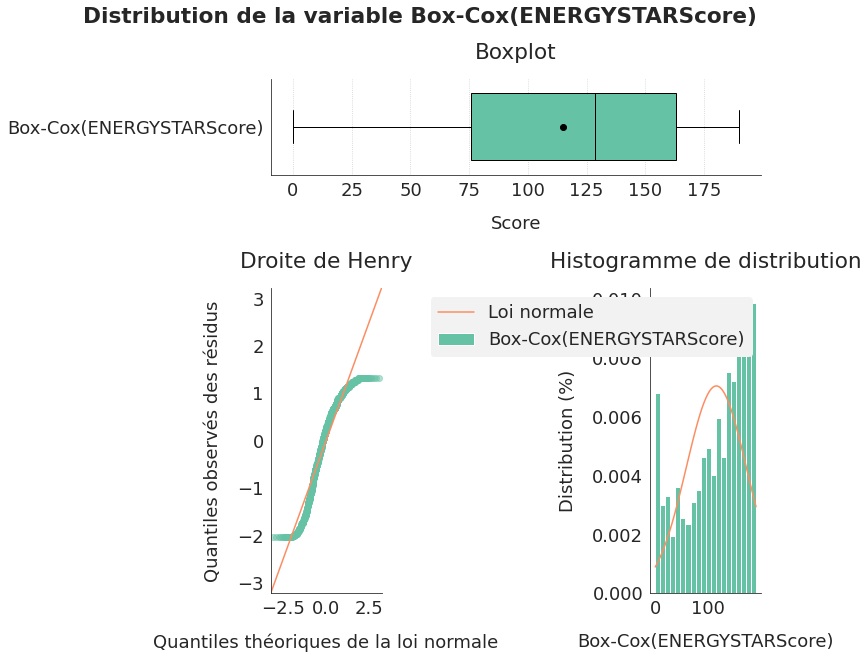

In [221]:
transfo_variable = "Box-Cox({})".format(variable)
transfo_data = power_transform(data_train[[variable]].dropna(), method='box-cox', standardize=False).ravel()
fig, ax = sfg.graph_analyse_variable_quant(transfo_data, transfo_variable, "Score")
plt.show()

In [222]:
sftd.test_normalite(transfo_data, title="Test de normalité pour la variable {}".format(transfo_variable), return_print=True)

Test de normalité pour la variable Box-Cox(ENERGYSTARScore) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



La forme de sa distribution rend difficile de la rendre plus normale. Je conserve cette variable telle quelle.

**Variable target : consommation énergétique**

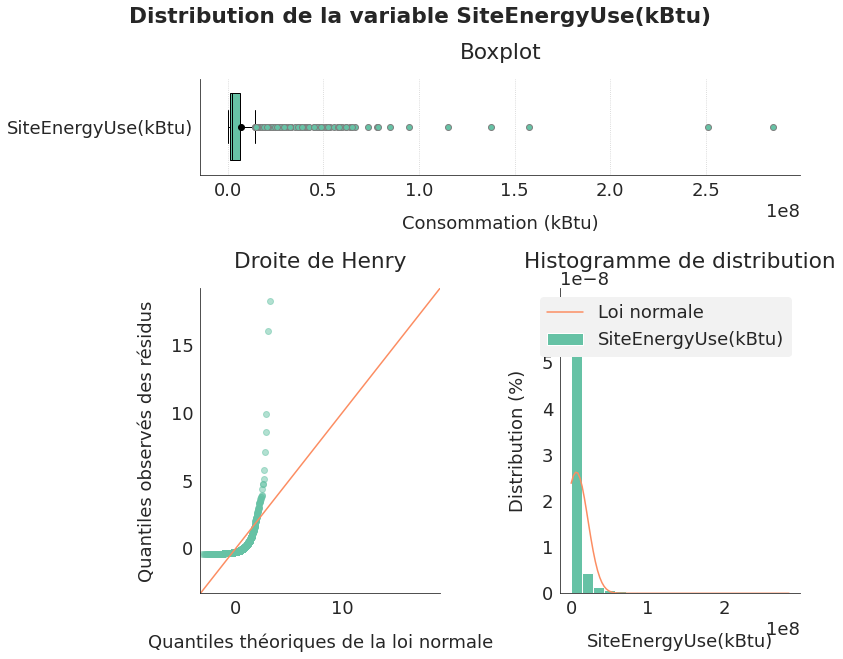

In [223]:
variable = "SiteEnergyUse(kBtu)"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Consommation (kBtu)")
save_fig("ml03_1_12_variables_a_transformer8")
plt.show()

In [224]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable SiteEnergyUse(kBtu) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


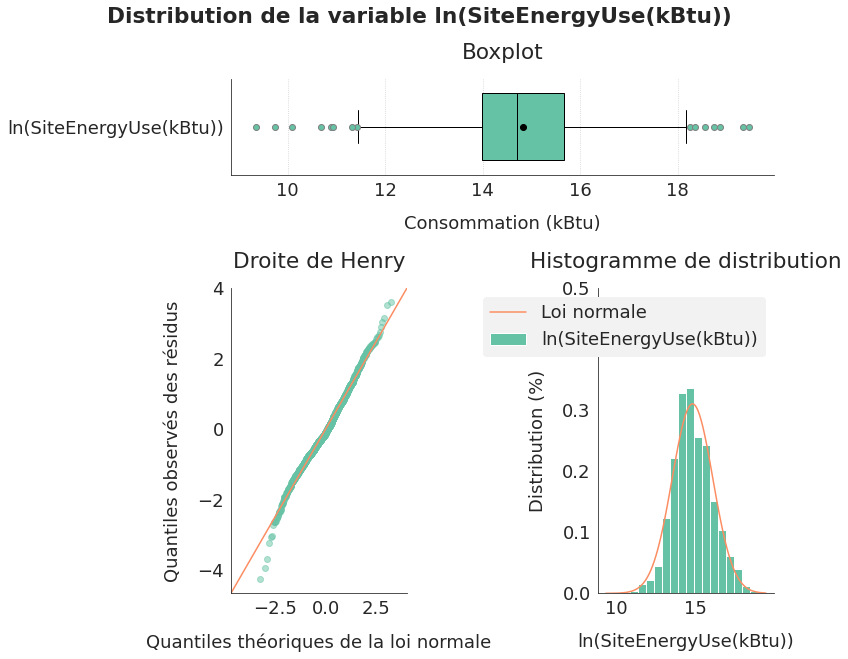

In [225]:
transfo_variable = "ln({})".format(variable)
transfo_data = np.log(data_train[variable].dropna())
fig, ax = sfg.graph_analyse_variable_quant(transfo_data, transfo_variable, "Consommation (kBtu)")
ax[2].set_ylim([0,0.5])
save_fig("ml03_1_13_variables_transformees_8")
plt.show()

In [226]:
sftd.test_normalite(transfo_data, title="Test de normalité pour la variable {}".format(transfo_variable), return_print=True)

Test de normalité pour la variable ln(SiteEnergyUse(kBtu)) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



Le passage au logarithme népérien permet de se rapprocher sensiblement d'une distribution normale, même si les tests ne confirment pas la constatation visuelle. <font color='red'>Je conserve donc le logarithme de la consommation.</font>

In [0]:
data_train[transfo_variable] = np.where(data_train[variable].isna(), np.nan, np.log(data_train[variable]))

Je crée deux variables : "conso_by_buildings_gfa" et "conso_by_largestuse_gfa" qui divisent la valeur de SiteEnergyUse par PropertyGFABuilding(s) et LargestPropertyUseTypeGFA.

In [0]:
interdata = data_train[["SiteEnergyUse(kBtu)","PropertyGFABuilding(s)"]].dropna()
conso_by_buildings_gfa = interdata["SiteEnergyUse(kBtu)"] / interdata["PropertyGFABuilding(s)"]
interdata = data_train[["SiteEnergyUse(kBtu)","LargestPropertyUseTypeGFA"]].dropna()
conso_by_largestuse_gfa = interdata["SiteEnergyUse(kBtu)"] / interdata["LargestPropertyUseTypeGFA"]

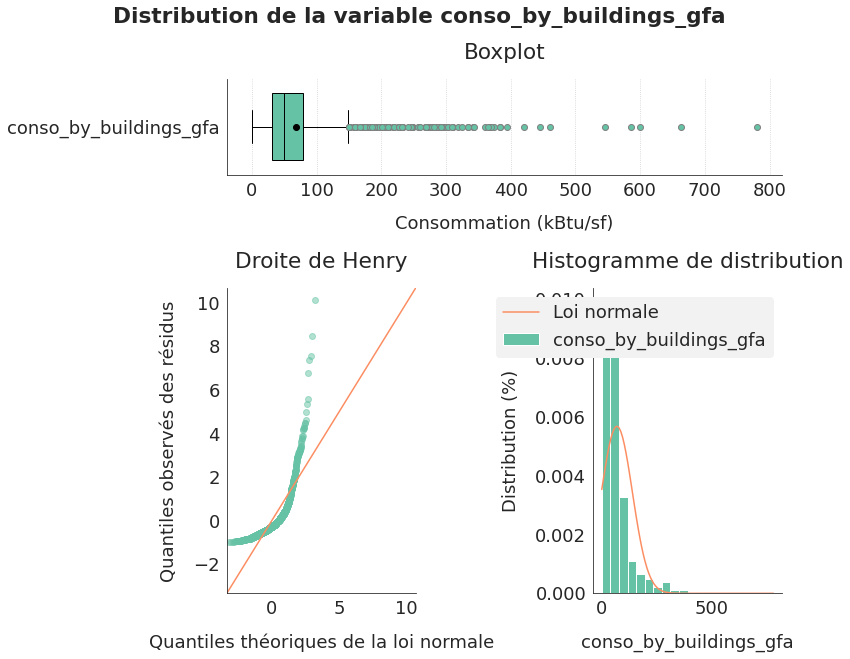

In [229]:
fig, ax = sfg.graph_analyse_variable_quant(conso_by_buildings_gfa, "conso_by_buildings_gfa", "Consommation (kBtu/sf)")
plt.show()

In [230]:
sftd.test_normalite(conso_by_buildings_gfa, title="Test de normalité pour {}".format("conso_by_buildings_gfa"), return_print=True)

Test de normalité pour conso_by_buildings_gfa (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


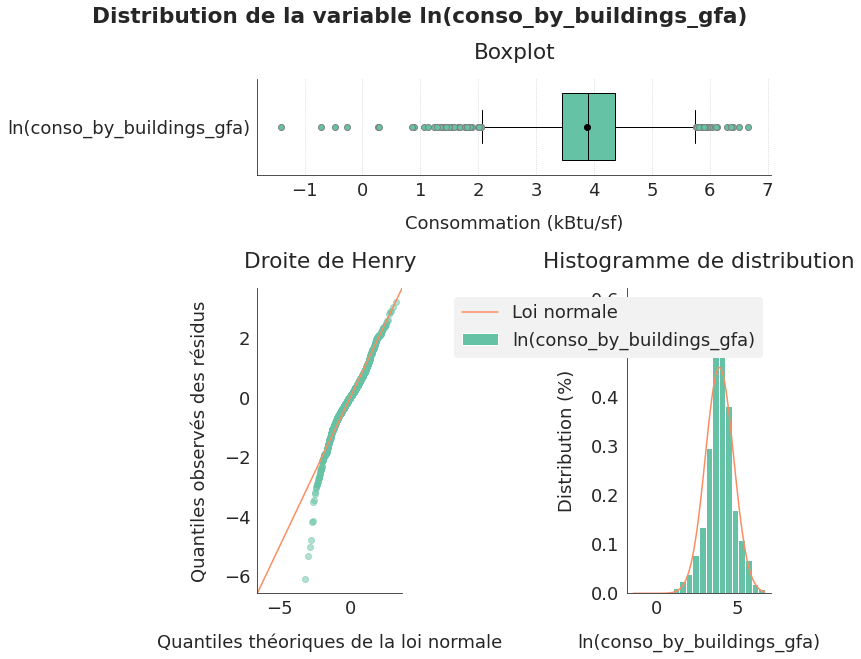

In [231]:
ln_conso_by_buildings_gfa = np.log(conso_by_buildings_gfa)
fig, ax = sfg.graph_analyse_variable_quant(ln_conso_by_buildings_gfa, "ln(conso_by_buildings_gfa)", "Consommation (kBtu/sf)")
plt.show()

In [232]:
sftd.test_normalite(ln_conso_by_buildings_gfa, title="Test de normalité pour {}".format("ln(conso_by_buildings_gfa)"), return_print=True)

Test de normalité pour ln(conso_by_buildings_gfa) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



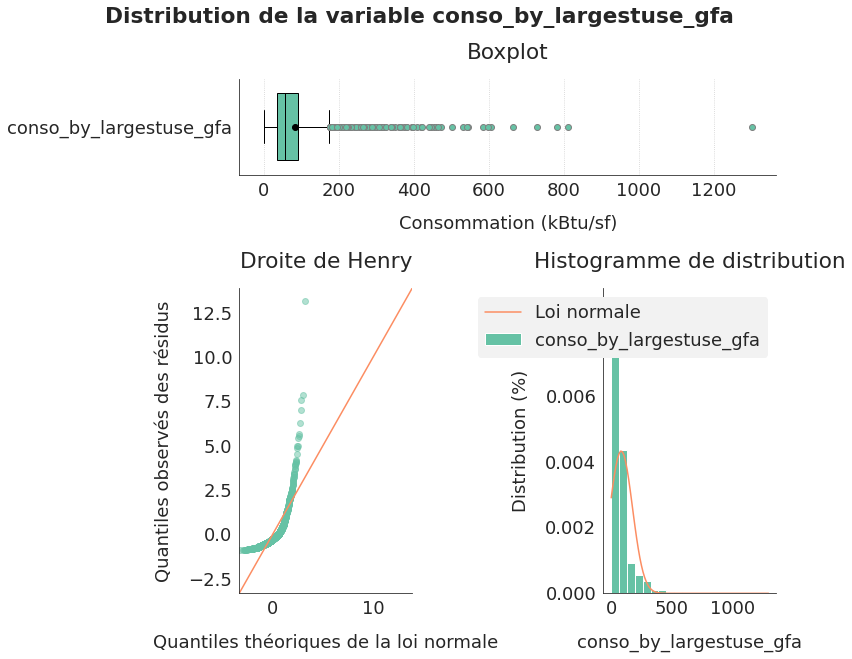

In [233]:
fig, ax = sfg.graph_analyse_variable_quant(conso_by_largestuse_gfa, "conso_by_largestuse_gfa", "Consommation (kBtu/sf)")
plt.show()

In [234]:
sftd.test_normalite(conso_by_largestuse_gfa, title="Test de normalité pour {}".format("conso_by_largestuse_gfa"), return_print=True)

Test de normalité pour conso_by_largestuse_gfa (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


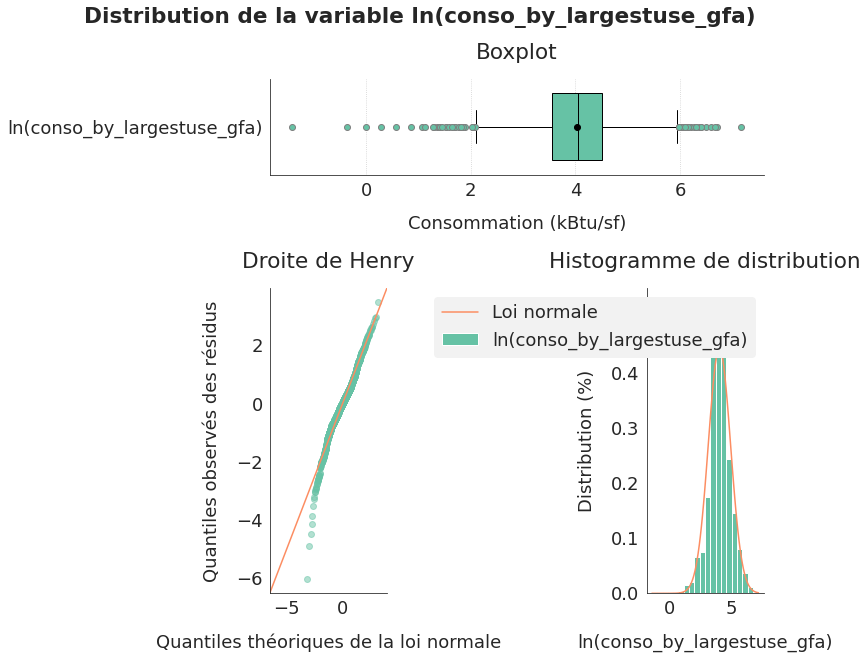

In [235]:
ln_conso_by_largestuse_gfa = np.log(conso_by_largestuse_gfa)
fig, ax = sfg.graph_analyse_variable_quant(ln_conso_by_largestuse_gfa, "ln(conso_by_largestuse_gfa)", "Consommation (kBtu/sf)")
plt.show()

In [236]:
sftd.test_normalite(ln_conso_by_largestuse_gfa, title="Test de normalité pour {}".format("ln(conso_by_largestuse_gfa)"), return_print=True)

Test de normalité pour ln(conso_by_largestuse_gfa) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



Ici aussi, le passage au log rapproche d'une distribution normale. <font color=red>Je crée donc deux variables avec le log de la consommation par superficie.</font>

In [0]:
data_train["ln_conso_by_largestuse_gfa"] = np.where(data_train[["SiteEnergyUse(kBtu)","LargestPropertyUseTypeGFA"]].isna().sum(axis=1) > 0, np.nan, np.log(data_train["SiteEnergyUse(kBtu)"]/data_train["LargestPropertyUseTypeGFA"]))
data_train["ln_conso_by_buildings_gfa"] = np.where(data_train[["SiteEnergyUse(kBtu)","PropertyGFABuilding(s)"]].isna().sum(axis=1) > 0, np.nan, np.log(data_train["SiteEnergyUse(kBtu)"]/data_train["PropertyGFABuilding(s)"]))

**Variable d'émissions de gaz à effet de serre**

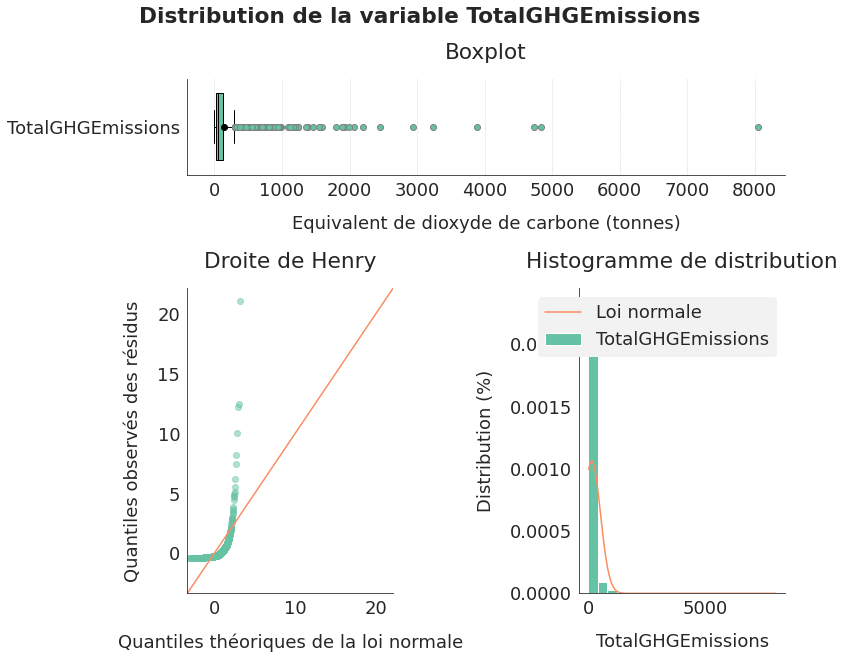

In [238]:
variable = "TotalGHGEmissions"
fig, ax = sfg.graph_analyse_variable_quant(data_train[variable].dropna(), variable, "Equivalent de dioxyde de carbone (tonnes)")
save_fig("ml03_1_12_variables_a_transformer9")
plt.show()

In [239]:
sftd.test_normalite(data_train[variable].dropna(), title="Test de normalité pour la variable {}".format(variable), return_print=True)

Test de normalité pour la variable TotalGHGEmissions (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


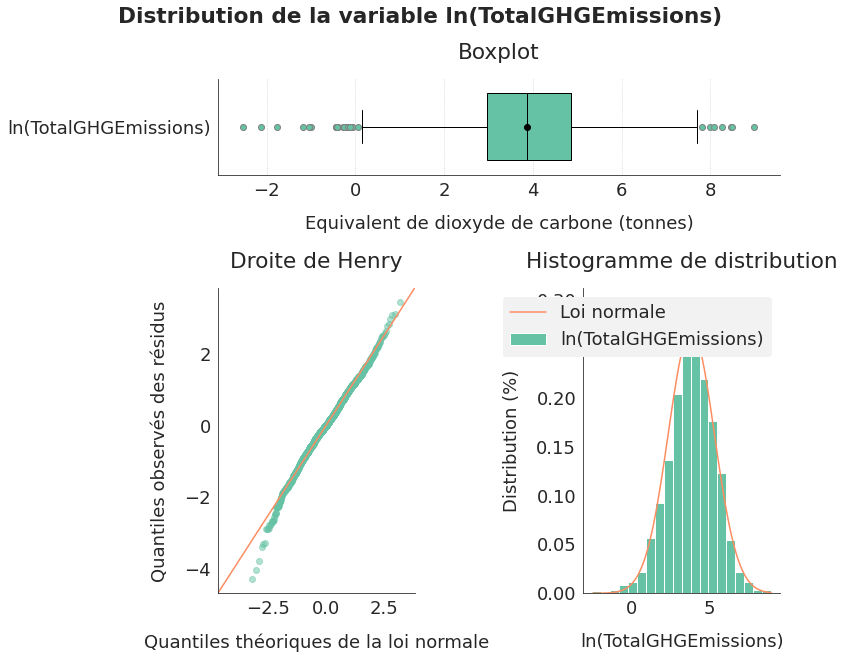

In [240]:
transfo_variable = "ln({})".format(variable)
transfo_data = np.log(data_train[variable].dropna())
fig, ax = sfg.graph_analyse_variable_quant(transfo_data, transfo_variable, "Equivalent de dioxyde de carbone (tonnes)")
save_fig("ml03_1_13_variables_transformees_9")
plt.show()

In [241]:
sftd.test_normalite(transfo_data, title="Test de normalité pour la variable {}".format(transfo_variable), return_print=True)

Test de normalité pour la variable ln(TotalGHGEmissions) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0          0.0005      
Accept H0      False          False           False      



<font color=red>Encore une fois, le passage au log nous rapproche de la normalité.</font>

In [0]:
data_train[transfo_variable] = np.where(data_train[variable].isna(), np.nan, np.log(data_train[variable]))

Je crée deux variables : "emissions_by_buildings_gfa" et "emissions_by_largestuse_gfa" qui divisent la valeur de TotalGHGEmissions par PropertyGFABuilding(s) et LargestPropertyUseTypeGFA.  
Elles pourront servir de référence pour des encodages par target-encoding, pour essayer d'éviter la sur-optimisation due au data-leakage.

In [0]:
interdata = data_train[["TotalGHGEmissions","PropertyGFABuilding(s)"]].dropna()
emissions_by_buildings_gfa = interdata["TotalGHGEmissions"] / interdata["PropertyGFABuilding(s)"]
interdata = data_train[["TotalGHGEmissions","LargestPropertyUseTypeGFA"]].dropna()
emissions_by_largestuse_gfa = interdata["TotalGHGEmissions"] / interdata["LargestPropertyUseTypeGFA"]

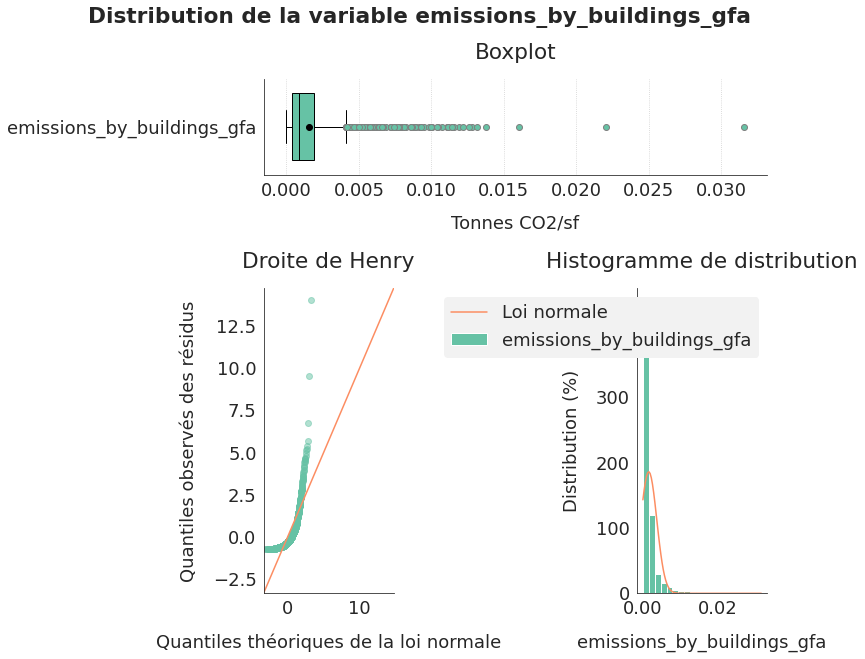

In [244]:
fig, ax = sfg.graph_analyse_variable_quant(emissions_by_buildings_gfa, "emissions_by_buildings_gfa", "Tonnes CO2/sf")
plt.show()

In [245]:
sftd.test_normalite(emissions_by_buildings_gfa, title="Test de normalité pour {}".format("emissions_by_buildings_gfa"), return_print=True)

Test de normalité pour emissions_by_buildings_gfa (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


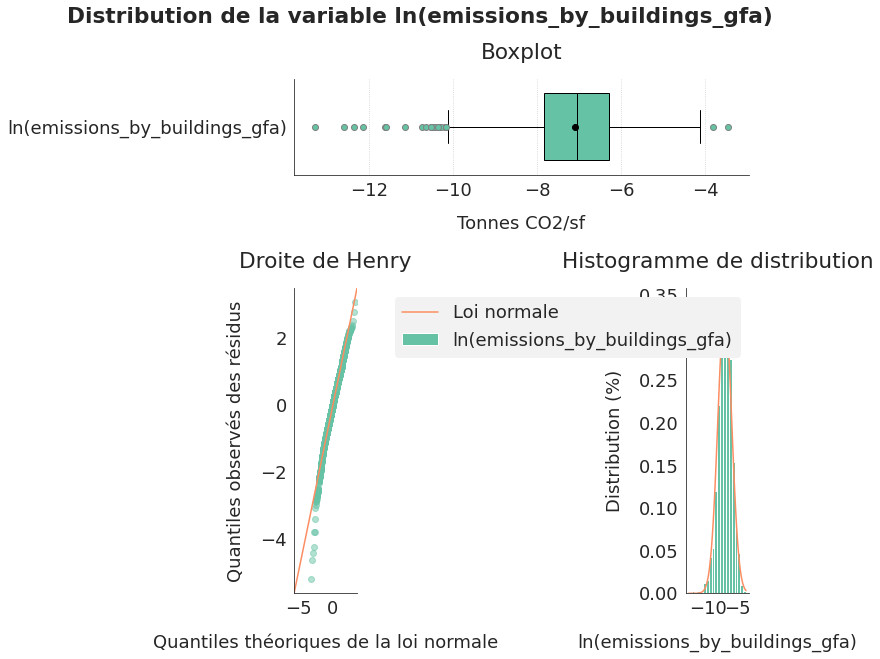

In [246]:
ln_emissions_by_buildings_gfa = np.log(emissions_by_buildings_gfa)
fig, ax = sfg.graph_analyse_variable_quant(ln_emissions_by_buildings_gfa, "ln(emissions_by_buildings_gfa)", "Tonnes CO2/sf")
plt.show()

In [247]:
sftd.test_normalite(ln_emissions_by_buildings_gfa, title="Test de normalité pour {}".format("ln(emissions_by_buildings_gfa)"), return_print=True)

Test de normalité pour ln(emissions_by_buildings_gfa) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



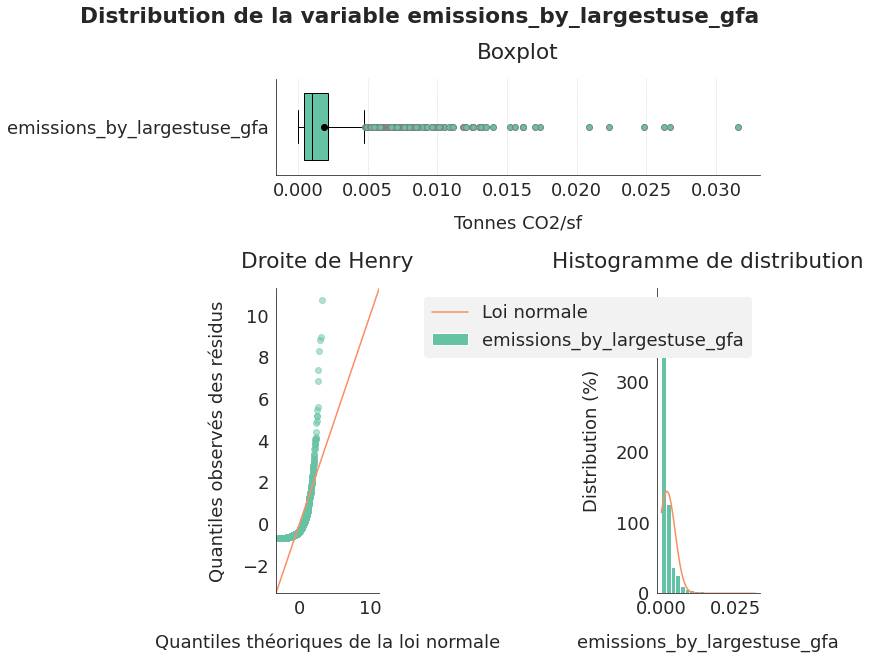

In [248]:
fig, ax = sfg.graph_analyse_variable_quant(emissions_by_largestuse_gfa, "emissions_by_largestuse_gfa", "Tonnes CO2/sf")
plt.show()

In [249]:
sftd.test_normalite(emissions_by_largestuse_gfa, title="Test de normalité pour {}".format("emissions_by_largestuse_gfa"), return_print=True)

Test de normalité pour emissions_by_largestuse_gfa (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0               0      
Accept H0      False          False           False      



/usr/local/lib/python3.6/dist-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log
  S = np.sum((2*i[sl1]-1.0)/N*(np.log(z)+np.log(1-z[sl2])), axis=axis)


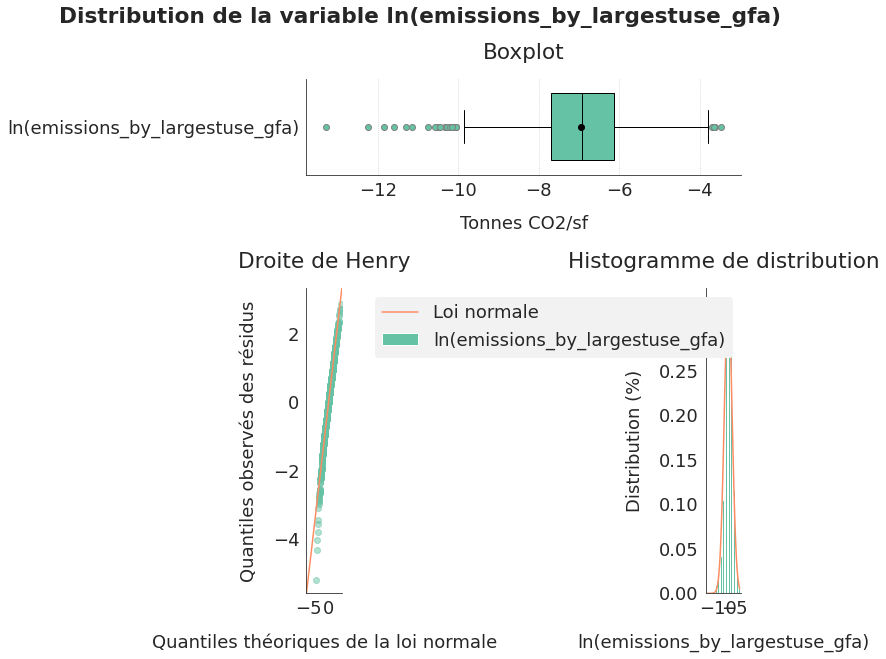

In [250]:
ln_emissions_by_largestuse_gfa = np.log(emissions_by_largestuse_gfa)
fig, ax = sfg.graph_analyse_variable_quant(ln_emissions_by_largestuse_gfa, "ln(emissions_by_largestuse_gfa)", "Tonnes CO2/sf")
plt.show()

In [251]:
sftd.test_normalite(ln_emissions_by_largestuse_gfa, title="Test de normalité pour {}".format("ln(emissions_by_largestuse_gfa)"), return_print=True)

Test de normalité pour ln(emissions_by_largestuse_gfa) (niveau de risque = 5%)
   H0: La distribution suit une loi normale
   H1: La distribution ne suit pas une loi normale

           Shapiro-Wilk   Jarque-Bera   Anderson-Darling 
p_value            0              0          0.0001      
Accept H0      False          False           False      



Comme pour la consommation énergétique par superficie, je garde le log des émissions par superficie.

In [0]:
data_train["ln_emissions_by_largestuse_gfa"] = np.where(data_train[["TotalGHGEmissions","LargestPropertyUseTypeGFA"]].isna().sum(axis=1) > 0, np.nan, np.log(data_train["TotalGHGEmissions"]/data_train["LargestPropertyUseTypeGFA"]))
data_train["ln_emissions_by_buildings_gfa"] = np.where(data_train[["TotalGHGEmissions","PropertyGFABuilding(s)"]].isna().sum(axis=1) > 0, np.nan, np.log(data_train["TotalGHGEmissions"]/data_train["PropertyGFABuilding(s)"]))

#### 6.1.2. Variables catégorielles

**Building Type**

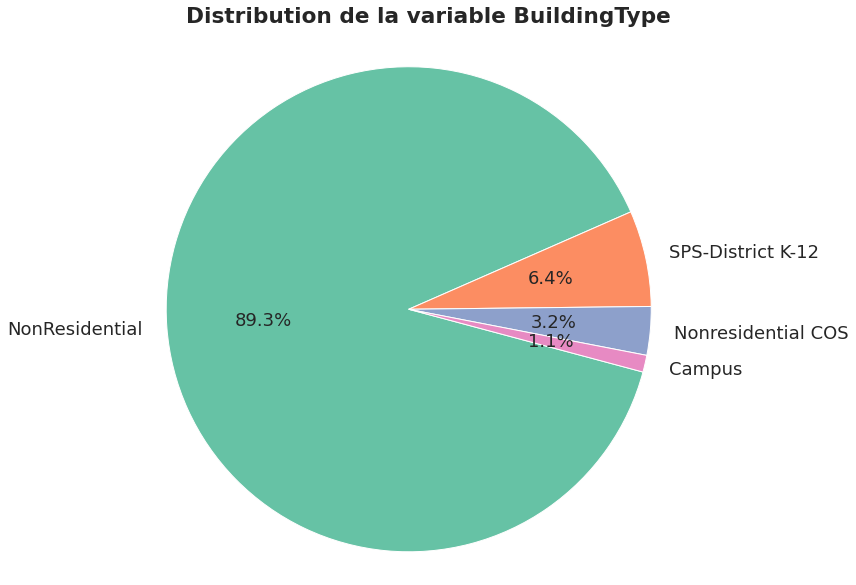

In [253]:
variable = "BuildingType"
fig, ax = sfg.graph_analyse_variable_categ(data_train[variable].dropna(), variable, force_startangle=-15)
save_fig("ml03_1_16_variables_categorielles1")
plt.show()

La colonne BuildingType n'est pas très diversifiée : elle ne comporte que 4 valeurs et surtout sa distribution est très déséquilibrée.

**Primary Property Type**

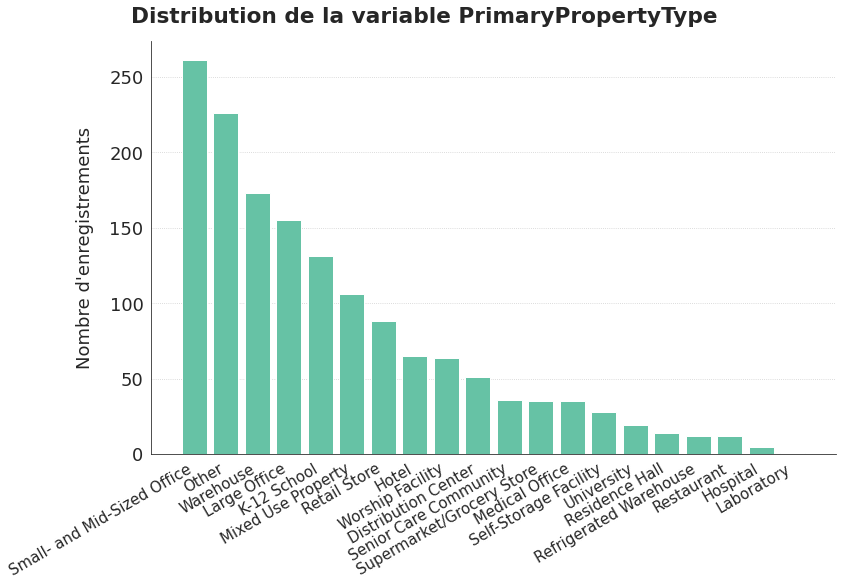

In [254]:
variable = "PrimaryPropertyType"
fig, ax = sfg.graph_analyse_variable_categ(data_train[variable].dropna(), variable, ticklabels_fontsize=15)
save_fig("ml03_1_16_variables_categorielles2")
plt.show()

In [255]:
data_train[variable].nunique()

20

La colonne PrimaryPropertyType contient 20 types différents. Elle peut être rapprochée de la colonne PropertyGFABuilding(s), ou plutôt de son log.

**Variables de localisation géographique**

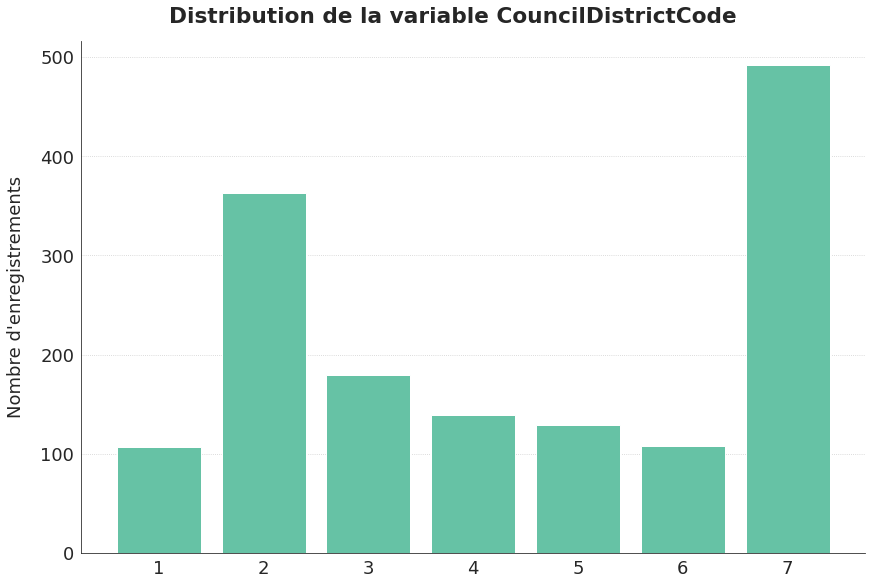

In [256]:
variable = "CouncilDistrictCode"
fig, ax = sfg.graph_analyse_variable_categ(data_train[variable].dropna(), variable, ticklabels_rotation=0)
plt.show()

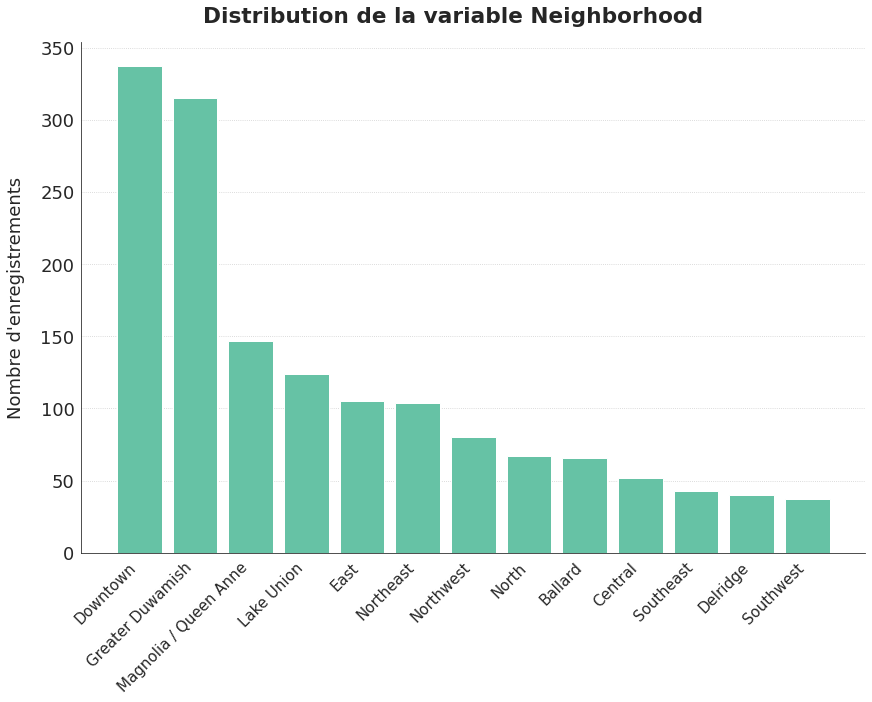

In [257]:
variable = "Neighborhood"
fig, ax = sfg.graph_analyse_variable_categ(data_train[variable].dropna(), variable, ticklabels_rotation=45, ticklabels_fontsize=15)
plt.show()

In [258]:
data_train[variable].nunique()

13

Je préfère la colonne Neighborhood à celle des districts car elle permet une distinction plus précise des secteurs géographiques.

**Variables de type d'usage des bâtiments**

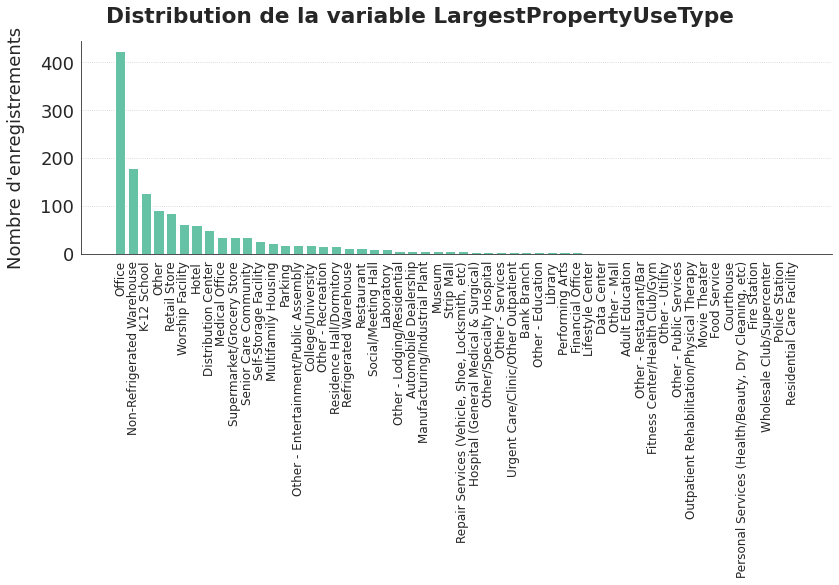

In [259]:
variable = "LargestPropertyUseType"
fig, ax = sfg.graph_analyse_variable_categ(data_train[variable].dropna(), variable, ticklabels_rotation=90, ticklabels_fontsize=12)
save_fig("ml03_1_16_variables_categorielles3")
plt.show()

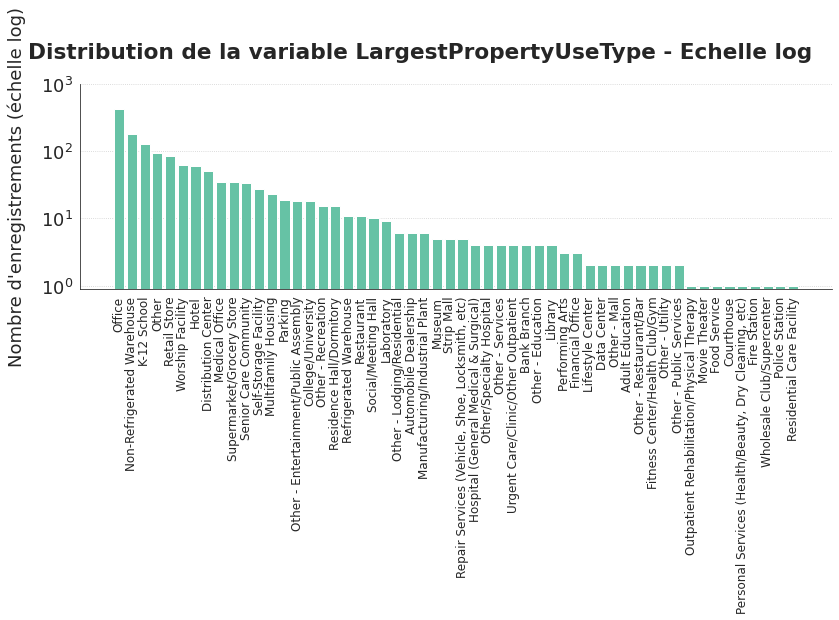

In [260]:
variable = "LargestPropertyUseType"
fig, ax = sfg.graph_analyse_variable_categ(data_train[variable].dropna(), "{} - Echelle log".format(variable), ticklabels_rotation=90, ticklabels_fontsize=12)
ax[0].set_yscale('log')
ax[0].set_ylim([0.9, 1000])
ax[0].set_ylabel("Nombre d'enregistrements (échelle log)")
save_fig("ml03_1_17_variables_categorielles_zoom1")
plt.show()

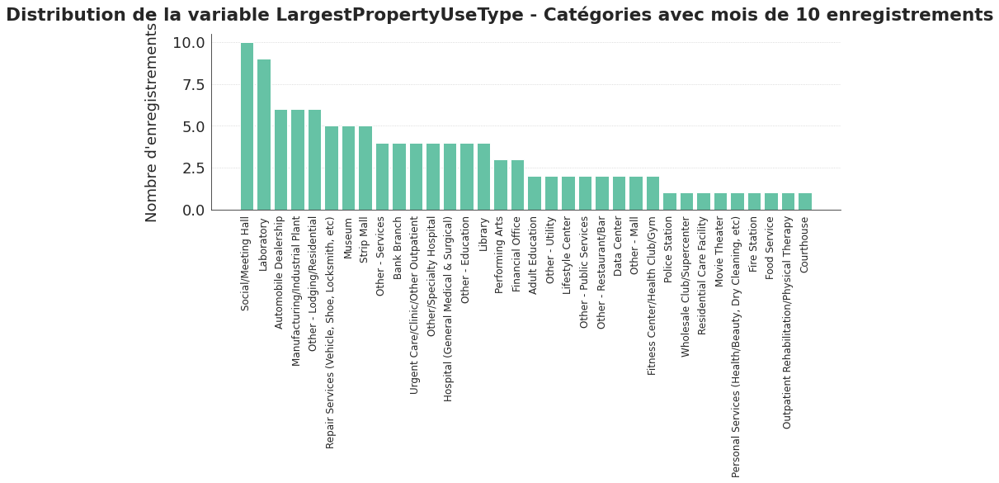

In [261]:
variable = "LargestPropertyUseType"
inter_values = data_train[variable].value_counts()
list_categ = list(inter_values[inter_values.values <= 10].index)
fig, ax = sfg.graph_analyse_variable_categ(data_train[data_train[variable].isin(list_categ)][variable].dropna(), "{} - Catégories avec mois de 10 enregistrements".format(variable), ticklabels_rotation=90, ticklabels_fontsize=12)
save_fig("ml03_1_17_variables_categorielles_zoom2")
plt.show()

In [262]:
data_train[variable].nunique()

54

Attention : il y a beaucoup de valeurs différentes, dont un grand nombre avec peu d'occurences. Il faudra supprimer ce problème potentiel de sur-optimisation lors de la modélisation.

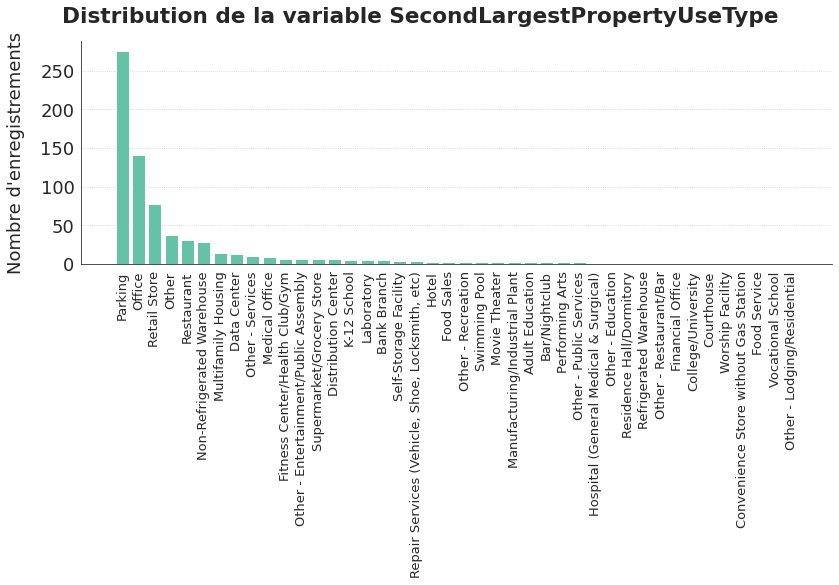

In [263]:
variable = "SecondLargestPropertyUseType"
fig, ax = sfg.graph_analyse_variable_categ(data_train[variable].dropna(), variable, ticklabels_rotation=90, ticklabels_fontsize=13)
save_fig("ml03_1_16_variables_categorielles4")
plt.show()

In [264]:
data_train[variable].nunique()

42

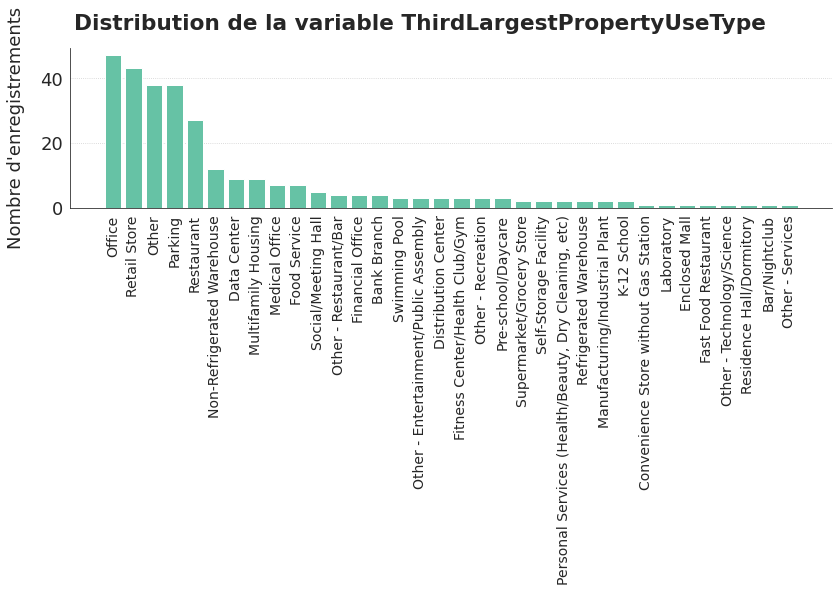

In [265]:
variable = "ThirdLargestPropertyUseType"
fig, ax = sfg.graph_analyse_variable_categ(data_train[variable].dropna(), variable, ticklabels_rotation=90, ticklabels_fontsize=14)
save_fig("ml03_1_16_variables_categorielles5")
plt.show()

In [266]:
data_train[variable].nunique()

34

<font color=red>Les conclusions sont les mêmes pour les 3 variables de type d'usage : beaucoup de valeurs différentes, donc beaucoup ont peu d'enregistrements. Risque d'overfitting ?</font>

Je vérifie que toutes les valeurs de SecondLargestPropertyUseType et ThirdLargestPropertyUseType sont toutes comprises dans LargestPropertyUseType.

In [267]:
list_ref = data_train.LargestPropertyUseType.unique()
print("Second Largest")
for item in data_train.SecondLargestPropertyUseType.unique():
    if item not in list_ref:
        print("   {}".format(item))
print("Third Largest")
for item in data_train.ThirdLargestPropertyUseType.unique():
    if item not in list_ref:
        print("   {}".format(item))

Second Largest
   nan
   Vocational School
   Swimming Pool
   Convenience Store without Gas Station
   Bar/Nightclub
   Food Sales
Third Largest
   nan
   Swimming Pool
   Pre-school/Daycare
   Other - Technology/Science
   Fast Food Restaurant
   Enclosed Mall
   Convenience Store without Gas Station
   Bar/Nightclub


**Variable Outlier**

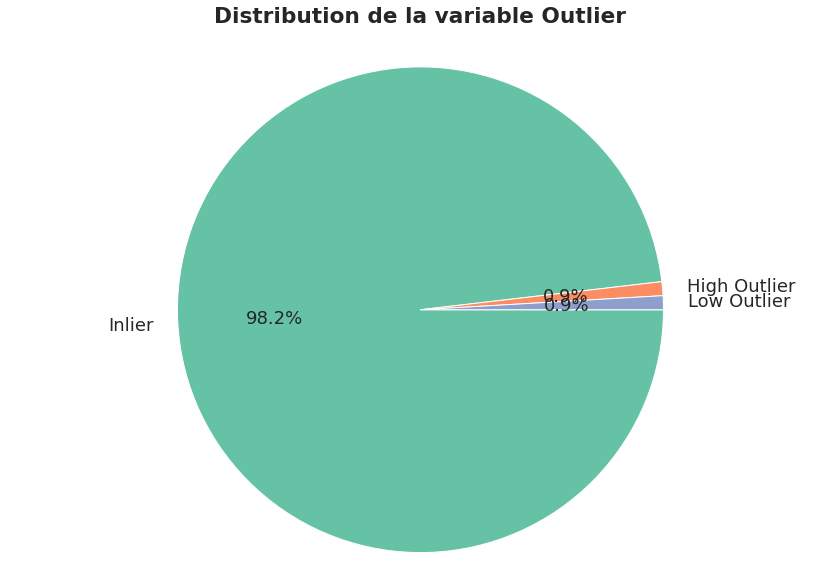

In [268]:
variable = "Outlier"
data_graph = data_train["Outlier"].fillna('Inlier')
fig, ax = sfg.graph_analyse_variable_categ(data_graph, variable, force_startangle=0)
plt.show()

Sur quelle base, un bâtiment est-il défini comme outlier ?
A tester : faut inclure les outliers dans la modélisation ? Ne risquent-ils pas de fausser le modèle ? Pour prendre en compte si un bâtiment est un outlier, il faut imputer les NA par des strings 'Inlier'.

**Variable more_than_one_building**

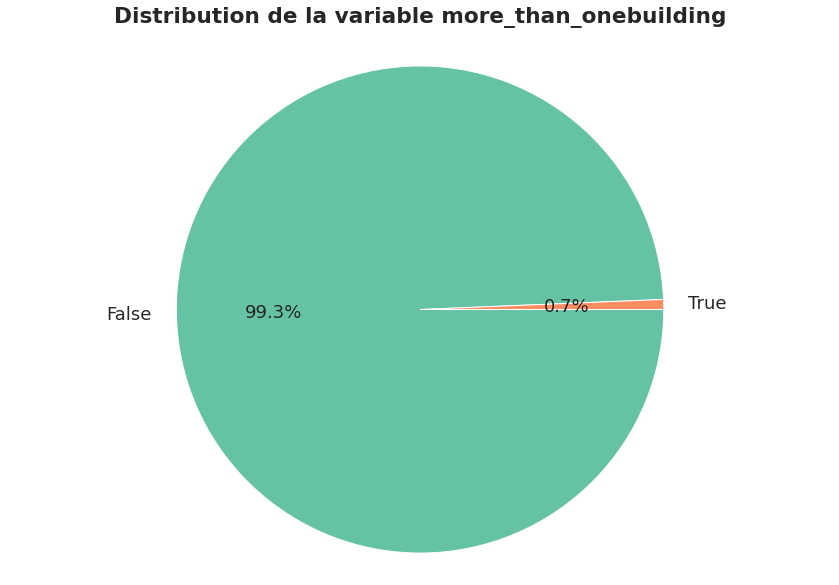

In [269]:
variable = "more_than_onebuilding"
fig, ax = sfg.graph_analyse_variable_categ(data_train[variable].dropna(), variable, force_startangle=0)
save_fig("ml03_1_15_variable_creee2")
plt.show()

Il y a très peu de propriétés avec plusieurs bâtiments en 2015. Les valeurs de cette variable sont-elles correctes ?

<a id='6_2'></a>

### 6.2. Analyses multivariées

#### 6.2.1. Entre variables numériques

In [0]:
col_num = ['ln(SiteEnergyUse(kBtu))','ln(TotalGHGEmissions)',
           'insulation_age', 'ln(NumberofFloors)', 'Latitude', 'Longitude',
           'ln(PropertyGFATotal)', 'ln(PropertyGFABuilding(s))', 'ln(PropertyGFAParking)',
           'ln(LargestPropertyUseTypeGFA)', 'ln(SecondLargestPropertyUseTypeGFA)',
           'ln(ThirdLargestPropertyUseTypeGFA)', 'ENERGYSTARScore']

J'utilise les log lorsque ceux-ci nous rapprochent de la normalité.

**Matrice de corrélation**

In [0]:
valeurs = data_train[col_num].corr()
for lin in np.arange(0, valeurs.shape[0]):
    for col in np.arange(0, lin, 1):
        valeurs.iloc[lin, col] = np.nan
annotations = np.round(valeurs, 2)

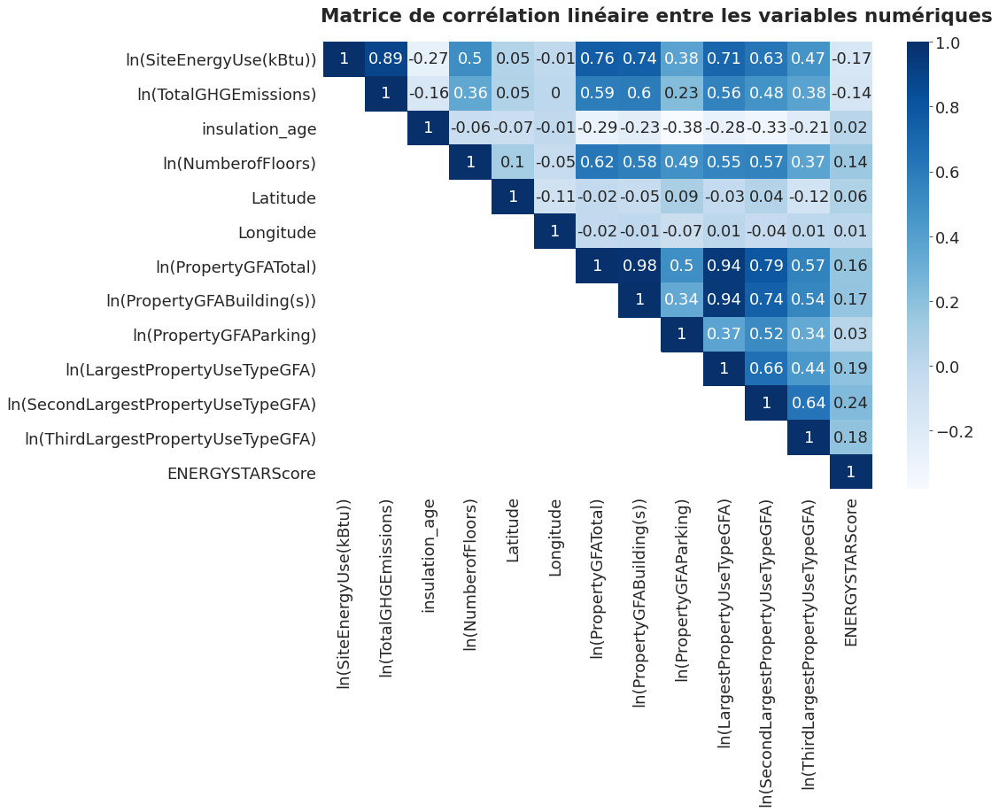

In [272]:
graph = sfg.MyGraph("Matrice de corrélation linéaire entre les variables numériques", figsize=(12,8))
graph.add_sns_heatmap(valeurs, annotations=annotations)
fig, ax  = graph.fig, graph.ax
save_fig("ml03_1_18_matrice_correlation", tight_layout=False)
plt.show()

La consommation énergétique et les émissions sont très liées linéairement.  
Elles semblent surtout corrélées linéairement à la superficie des bâtiments, et dans une moindre mesure au nombre d'étages.

**Pairplots**

Je regroupe les variables en deux groupes selon leur corrélation linéaire avec la consommation énergétique et les émissions.

In [0]:
col_pairplot = ['ln(NumberofFloors)', 'ln(PropertyGFABuilding(s))',
                'ln(LargestPropertyUseTypeGFA)', 'ln(SecondLargestPropertyUseTypeGFA)', 
                'ln(ThirdLargestPropertyUseTypeGFA)',
                'ln(SiteEnergyUse(kBtu))','ln(TotalGHGEmissions)']
pairplot_data = data_train[col_pairplot].dropna()

/usr/local/lib/python3.6/dist-packages/seaborn/axisgrid.py:1342: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout(pad=layout_pad)


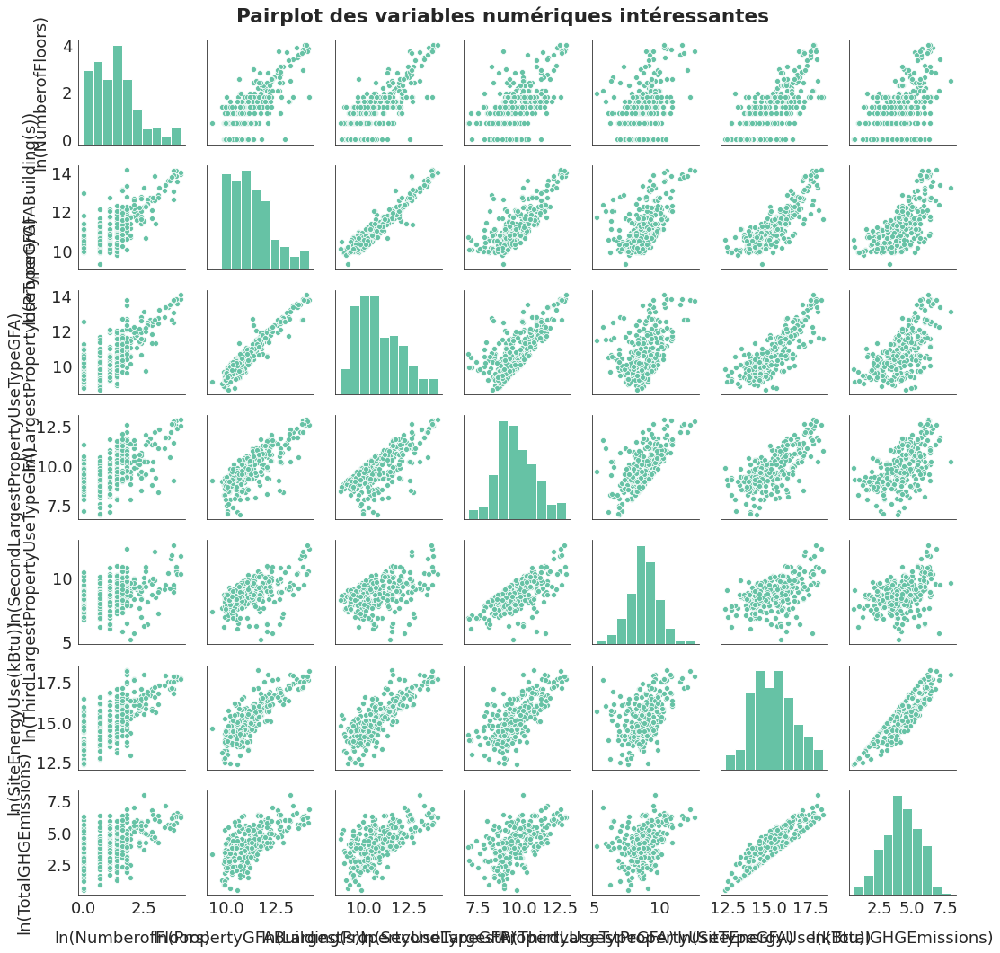

In [274]:
fig, g = sfg.sns_pairplot(pairplot_data, title="Pairplot des variables numériques intéressantes", y_title=0.91)
plt.show()

Les émissions et la consommation énergétique sont très liées linéairement. Ces deux variables que nous cherchons à estimer semblent liées linéairement au nombre d'étages et aux différentes superficies.  
Il faut faire attention aux problèmes de colinéarité entre les surfaces GFA. Plusieurs possibilités : prendre en considération la superficie PropertyGFABuilding(s) ou la superficie LargestPropertyUseTypeGFA ou le triptyque LargestPropertyUseTypeGFA, SecondLargestPropertyUseTypeGFA et ThirdLargestPropertyUseTypeGFA.

In [0]:
col_pairplot2 = ['insulation_age','ENERGYSTARScore', 'Latitude', 'Longitude', 
                 'ln(SiteEnergyUse(kBtu))', 'ln(TotalGHGEmissions)']
pairplot_data2 = data_train[col_pairplot2].dropna()

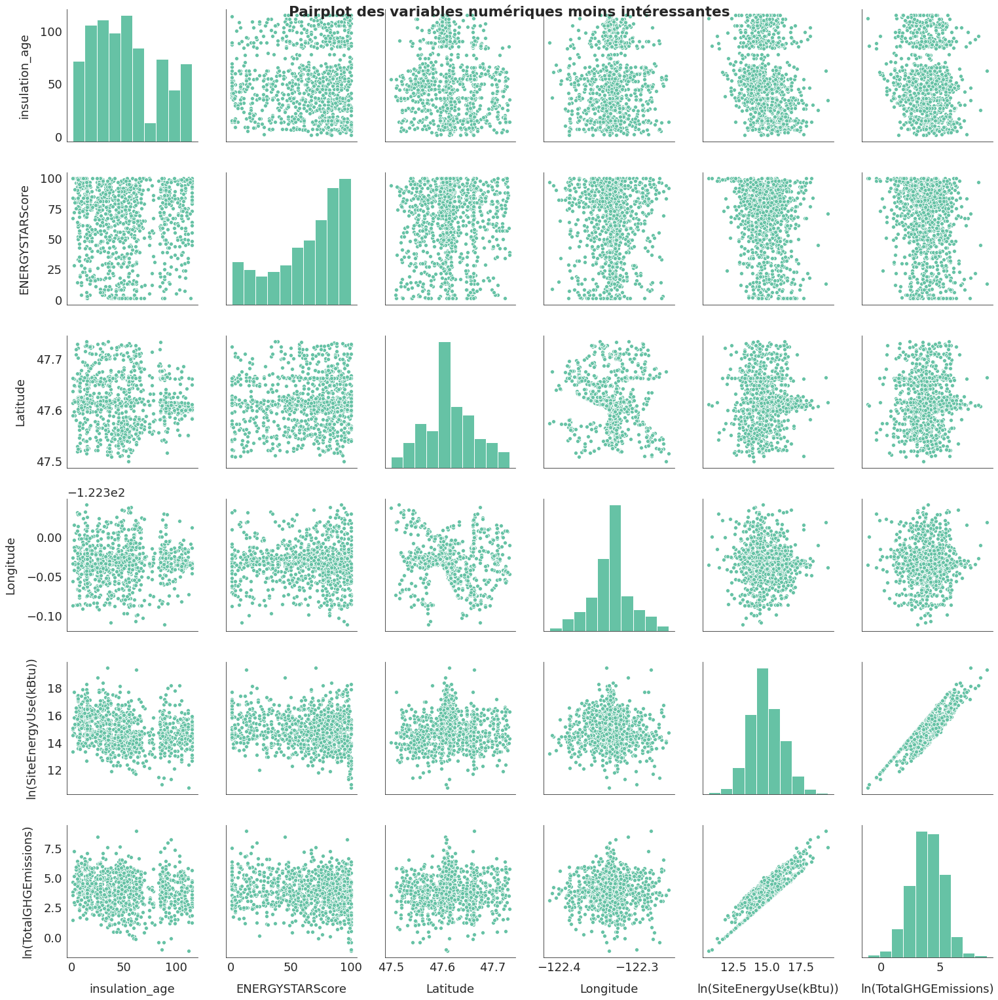

In [276]:
fig, g = sfg.sns_pairplot(pairplot_data2, title="Pairplot des variables numériques moins intéressantes", y_title=1.0, indiv_height=3.5)
plt.show()

Les variables explicatives analysées ici ne sont pas liées linéairement avec la consommation énergétique ou les émissions.

**Tests de corrélation linéaire**

J'étudie les tests de corrélation linéaire et de rang pour les variables qui semblent les plus liées à la consommation et aux émissions, en ajoutant la variable 'insulation_age' dont on peut penser a priori qu'elle devrait peser sur la consommation et les émissions.  
Attention, la plupart des variables ne suivent pas une loi normale : la p-value est à prendre avec précaution.  
J'enlève les colonnes SecondLargestPropertyUseTypeGFA et ThirdLargestPropertyUseTypeGFA qui ont beaucoup de valeurs manquantes.

In [0]:
col_correl = ['insulation_age', 'ln(NumberofFloors)', 'ln(PropertyGFABuilding(s))', 'ln(LargestPropertyUseTypeGFA)',
           'ln(SiteEnergyUse(kBtu))', 'ln(TotalGHGEmissions)', 'CouncilDistrictCode']
data_correl = data_train[col_correl].dropna()

In [0]:
current_idx = 0
col_autres = col_correl[:current_idx]
col_autres.extend(col_correl[current_idx+1:-1])

In [279]:
sftd.test_correlations_linear(data_correl, col_correl[current_idx], col_autres, return_print=True)

Test de corrélation linéaire (niveau de risque = 5%)
   H0: Le coefficient de corrélation linéaire de la variable insulation_age avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation linéaire n'est pas nul (r!=0)

                              Pearson Correlation   p_value     Accept H0         Conclusion       
ln(NumberofFloors)                 -0.055799          0.034053    False    Coefficient significatif
ln(PropertyGFABuilding(s))         -0.232435       3.73315e-19    False    Coefficient significatif
ln(LargestPropertyUseTypeGFA)      -0.281937       8.95559e-28    False    Coefficient significatif
ln(SiteEnergyUse(kBtu))            -0.269803       1.73089e-25    False    Coefficient significatif
ln(TotalGHGEmissions)              -0.167157       1.66681e-10    False    Coefficient significatif



In [280]:
sftd.test_correlations_rank(data_correl, col_correl[current_idx], col_autres, return_print=True)

Test de corrélation de rang (niveau de risque = 5%)
   H0: Le coefficient de corrélation de rang de la variable insulation_age avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation de rang n'est pas nul (r!=0)

                              Spearman Correlation   p_value     Accept H0         Conclusion       
ln(NumberofFloors)                 -0.0876454       0.000859457    False    Coefficient significatif
ln(PropertyGFABuilding(s))          -0.246214       2.28208e-21    False    Coefficient significatif
ln(LargestPropertyUseTypeGFA)       -0.296713        1.0239e-30    False    Coefficient significatif
ln(SiteEnergyUse(kBtu))             -0.277697       5.80871e-27    False    Coefficient significatif
ln(TotalGHGEmissions)                -0.16255         5.273e-10    False    Coefficient significatif



In [0]:
current_idx = 1
col_autres = col_correl[:current_idx]
col_autres.extend(col_correl[current_idx+1:-1])

In [282]:
sftd.test_correlations_linear(data_correl, col_correl[current_idx], col_autres, return_print=True)

Test de corrélation linéaire (niveau de risque = 5%)
   H0: Le coefficient de corrélation linéaire de la variable ln(NumberofFloors) avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation linéaire n'est pas nul (r!=0)

                              Pearson Correlation    p_value     Accept H0         Conclusion       
insulation_age                     -0.055799           0.034053    False    Coefficient significatif
ln(PropertyGFABuilding(s))          0.583984       1.10897e-132    False    Coefficient significatif
ln(LargestPropertyUseTypeGFA)       0.553706       1.02753e-116    False    Coefficient significatif
ln(SiteEnergyUse(kBtu))             0.498301        2.05313e-91    False    Coefficient significatif
ln(TotalGHGEmissions)               0.346758        4.94845e-42    False    Coefficient significatif



In [283]:
sftd.test_correlations_rank(data_correl, col_correl[current_idx], col_autres, return_print=True)

Test de corrélation de rang (niveau de risque = 5%)
   H0: Le coefficient de corrélation de rang de la variable ln(NumberofFloors) avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation de rang n'est pas nul (r!=0)

                              Spearman Correlation   p_value     Accept H0         Conclusion       
insulation_age                     -0.0876454       0.000859457    False    Coefficient significatif
ln(PropertyGFABuilding(s))           0.473213       2.08787e-81    False    Coefficient significatif
ln(LargestPropertyUseTypeGFA)        0.447295       6.58748e-72    False    Coefficient significatif
ln(SiteEnergyUse(kBtu))              0.441083        9.4648e-70    False    Coefficient significatif
ln(TotalGHGEmissions)                0.290452       1.89744e-29    False    Coefficient significatif



In [0]:
current_idx = 2
col_autres = col_correl[:current_idx]
col_autres.extend(col_correl[current_idx+1:-1])

In [285]:
sftd.test_correlations_linear(data_correl, col_correl[current_idx], col_autres, return_print=True)

Test de corrélation linéaire (niveau de risque = 5%)
   H0: Le coefficient de corrélation linéaire de la variable ln(PropertyGFABuilding(s)) avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation linéaire n'est pas nul (r!=0)

                              Pearson Correlation    p_value     Accept H0         Conclusion       
insulation_age                     -0.232435        3.73315e-19    False    Coefficient significatif
ln(NumberofFloors)                  0.583984       1.10897e-132    False    Coefficient significatif
ln(LargestPropertyUseTypeGFA)       0.942945                  0    False    Coefficient significatif
ln(SiteEnergyUse(kBtu))             0.738766       3.28889e-249    False    Coefficient significatif
ln(TotalGHGEmissions)               0.591449       6.99147e-137    False    Coefficient significatif



In [286]:
sftd.test_correlations_rank(data_correl, col_correl[current_idx], col_autres, return_print=True)

Test de corrélation de rang (niveau de risque = 5%)
   H0: Le coefficient de corrélation de rang de la variable ln(PropertyGFABuilding(s)) avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation de rang n'est pas nul (r!=0)

                              Spearman Correlation    p_value     Accept H0         Conclusion       
insulation_age                     -0.246214         2.28208e-21    False    Coefficient significatif
ln(NumberofFloors)                  0.473213         2.08787e-81    False    Coefficient significatif
ln(LargestPropertyUseTypeGFA)       0.926221                   0    False    Coefficient significatif
ln(SiteEnergyUse(kBtu))             0.716809        6.41583e-228    False    Coefficient significatif
ln(TotalGHGEmissions)               0.571659        5.56532e-126    False    Coefficient significatif



In [0]:
current_idx = 3
col_autres = col_correl[:current_idx]
col_autres.extend(col_correl[current_idx+1:-1])

In [288]:
sftd.test_correlations_linear(data_correl, col_correl[current_idx], col_autres, return_print=True)

Test de corrélation linéaire (niveau de risque = 5%)
   H0: Le coefficient de corrélation linéaire de la variable ln(LargestPropertyUseTypeGFA) avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation linéaire n'est pas nul (r!=0)

                           Pearson Correlation    p_value     Accept H0         Conclusion       
insulation_age                  -0.281937        8.95559e-28    False    Coefficient significatif
ln(NumberofFloors)               0.553706       1.02753e-116    False    Coefficient significatif
ln(PropertyGFABuilding(s))       0.942945                  0    False    Coefficient significatif
ln(SiteEnergyUse(kBtu))          0.709385       3.57667e-221    False    Coefficient significatif
ln(TotalGHGEmissions)            0.564536       3.09115e-122    False    Coefficient significatif



In [289]:
sftd.test_correlations_rank(data_correl, col_correl[current_idx], col_autres, return_print=True)

Test de corrélation de rang (niveau de risque = 5%)
   H0: Le coefficient de corrélation de rang de la variable ln(LargestPropertyUseTypeGFA) avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation de rang n'est pas nul (r!=0)

                           Spearman Correlation    p_value     Accept H0         Conclusion       
insulation_age                  -0.296713          1.0239e-30    False    Coefficient significatif
ln(NumberofFloors)               0.447295         6.58748e-72    False    Coefficient significatif
ln(PropertyGFABuilding(s))       0.926221                   0    False    Coefficient significatif
ln(SiteEnergyUse(kBtu))          0.685858        3.88602e-201    False    Coefficient significatif
ln(TotalGHGEmissions)            0.544818        2.47894e-112    False    Coefficient significatif



In [0]:
current_idx = 4
col_autres = col_correl[:current_idx]
col_autres.extend(col_correl[current_idx+1:-1])

In [291]:
sftd.test_correlations_linear(data_correl, col_correl[current_idx], col_autres, return_print=True)

Test de corrélation linéaire (niveau de risque = 5%)
   H0: Le coefficient de corrélation linéaire de la variable ln(SiteEnergyUse(kBtu)) avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation linéaire n'est pas nul (r!=0)

                              Pearson Correlation    p_value     Accept H0         Conclusion       
insulation_age                     -0.269803        1.73089e-25    False    Coefficient significatif
ln(NumberofFloors)                  0.498301        2.05313e-91    False    Coefficient significatif
ln(PropertyGFABuilding(s))          0.738766       3.28889e-249    False    Coefficient significatif
ln(LargestPropertyUseTypeGFA)       0.709385       3.57667e-221    False    Coefficient significatif
ln(TotalGHGEmissions)               0.889653                  0    False    Coefficient significatif



In [292]:
sftd.test_correlations_rank(data_correl, col_correl[current_idx], col_autres, return_print=True)

Test de corrélation de rang (niveau de risque = 5%)
   H0: Le coefficient de corrélation de rang de la variable ln(SiteEnergyUse(kBtu)) avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation de rang n'est pas nul (r!=0)

                              Spearman Correlation    p_value     Accept H0         Conclusion       
insulation_age                     -0.277697         5.80871e-27    False    Coefficient significatif
ln(NumberofFloors)                  0.441083          9.4648e-70    False    Coefficient significatif
ln(PropertyGFABuilding(s))          0.716809        6.41583e-228    False    Coefficient significatif
ln(LargestPropertyUseTypeGFA)       0.685858        3.88602e-201    False    Coefficient significatif
ln(TotalGHGEmissions)               0.863384                   0    False    Coefficient significatif



In [0]:
current_idx = 5
col_autres = col_correl[:current_idx]
col_autres.extend(col_correl[current_idx+1:-1])

In [294]:
sftd.test_correlations_linear(data_correl, col_correl[current_idx], col_autres, return_print=True)

Test de corrélation linéaire (niveau de risque = 5%)
   H0: Le coefficient de corrélation linéaire de la variable ln(TotalGHGEmissions) avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation linéaire n'est pas nul (r!=0)

                              Pearson Correlation    p_value     Accept H0         Conclusion       
insulation_age                     -0.167157        1.66681e-10    False    Coefficient significatif
ln(NumberofFloors)                  0.346758        4.94845e-42    False    Coefficient significatif
ln(PropertyGFABuilding(s))          0.591449       6.99147e-137    False    Coefficient significatif
ln(LargestPropertyUseTypeGFA)       0.564536       3.09115e-122    False    Coefficient significatif
ln(SiteEnergyUse(kBtu))             0.889653                  0    False    Coefficient significatif



In [295]:
sftd.test_correlations_rank(data_correl, col_correl[current_idx], col_autres, return_print=True)

Test de corrélation de rang (niveau de risque = 5%)
   H0: Le coefficient de corrélation de rang de la variable ln(TotalGHGEmissions) avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation de rang n'est pas nul (r!=0)

                              Spearman Correlation    p_value     Accept H0         Conclusion       
insulation_age                      -0.16255           5.273e-10    False    Coefficient significatif
ln(NumberofFloors)                  0.290452         1.89744e-29    False    Coefficient significatif
ln(PropertyGFABuilding(s))          0.571659        5.56532e-126    False    Coefficient significatif
ln(LargestPropertyUseTypeGFA)       0.544818        2.47894e-112    False    Coefficient significatif
ln(SiteEnergyUse(kBtu))             0.863384                   0    False    Coefficient significatif



Les tests de corrélation confirment que les émissions et la consommation énergétique sont liées entre elles. Elles sont principalement liées avec la superficie et dans une moindre mesure avec le nombre d'étages. La variable basée sur la superficie des bâtiments est légèrement plus liée à la consommation et aux émissions que la variable basée sur la superficie de l'usage principal.  
L'âge de l'isolation est anti-corrélé avec les autres variables.

**Quelques graphiques de corrélation linéaire, pour les coefficients de corrélation les plus notables**

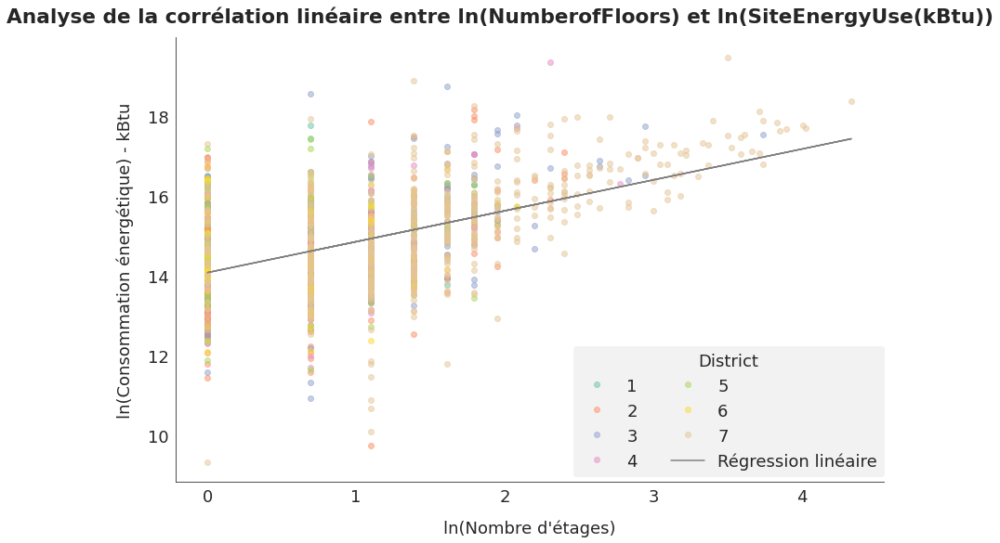

In [296]:
graph = sfg.MyGraph("Analyse de la corrélation linéaire entre {} et {}".format(col_correl[1], col_correl[4]))
graph.graph_custom_regplot(data_correl, col_correl[1], col_correl[4], hue=col_correl[-1], reg_color='grey')
graph.set_axe_x(label="ln(Nombre d'étages)")
graph.set_axe_y(label="ln(Consommation énergétique) - kBtu")
graph.set_legend(loc='upper left', title="District", ncol=2, bbox_to_anchor=(0.55,0.325))
fig, ax  = graph.fig, graph.ax
plt.show()

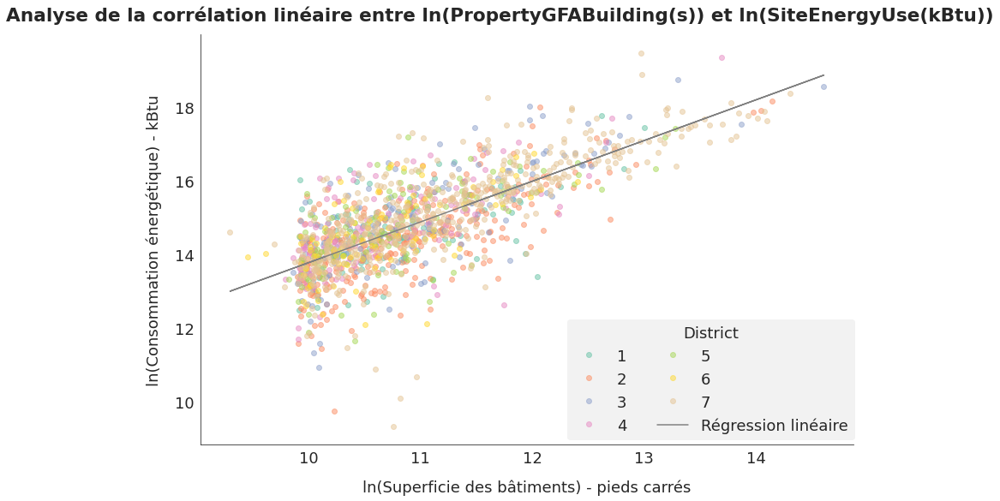

In [297]:
graph = sfg.MyGraph("Analyse de la corrélation linéaire entre {} et {}".format(col_correl[2], col_correl[4]))
graph.graph_custom_regplot(data_correl, col_correl[2], col_correl[4], hue=col_correl[-1], reg_color='grey')
graph.set_axe_x(label="ln(Superficie des bâtiments) - pieds carrés")
graph.set_axe_y(label="ln(Consommation énergétique) - kBtu")
graph.set_legend(loc='upper left', title="District", ncol=2, bbox_to_anchor=(0.55,0.325))
fig, ax  = graph.fig, graph.ax
save_fig("ml03_1_24_relations_lineaires", tight_layout=False)
plt.show()

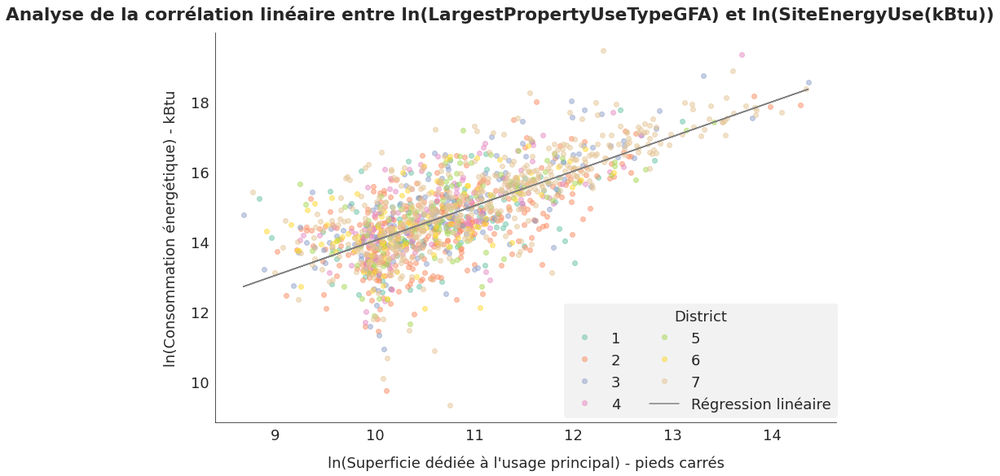

In [298]:
graph = sfg.MyGraph("Analyse de la corrélation linéaire entre {} et {}".format(col_correl[3], col_correl[4]))
graph.graph_custom_regplot(data_correl, col_correl[3], col_correl[4], hue=col_correl[-1], reg_color='grey')
graph.set_axe_x(label="ln(Superficie dédiée à l'usage principal) - pieds carrés")
graph.set_axe_y(label="ln(Consommation énergétique) - kBtu")
graph.set_legend(loc='upper left', title="District", ncol=2, bbox_to_anchor=(0.55,0.325))
fig, ax  = graph.fig, graph.ax
save_fig("ml03_1_25_relations_lineaires", tight_layout=False)
plt.show()

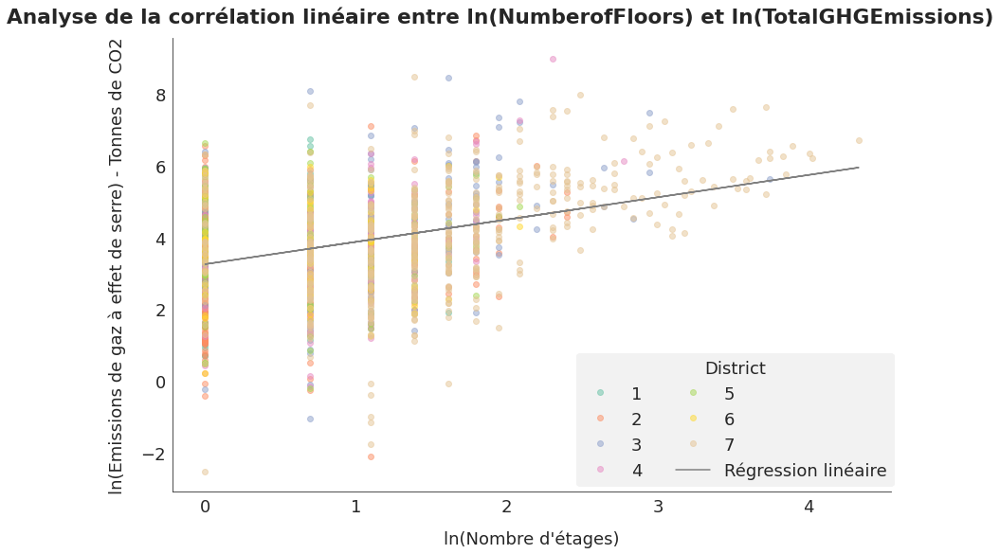

In [299]:
graph = sfg.MyGraph("Analyse de la corrélation linéaire entre {} et {}".format(col_correl[1], col_correl[5]))
graph.graph_custom_regplot(data_correl, col_correl[1], col_correl[5], hue=col_correl[-1], reg_color='grey')
graph.set_axe_x(label="ln(Nombre d'étages)")
graph.set_axe_y(label="ln(Emissions de gaz à effet de serre) - Tonnes de CO2")
graph.set_legend(loc='upper left', title="District", ncol=2, bbox_to_anchor=(0.55,0.325))
fig, ax  = graph.fig, graph.ax
plt.show()

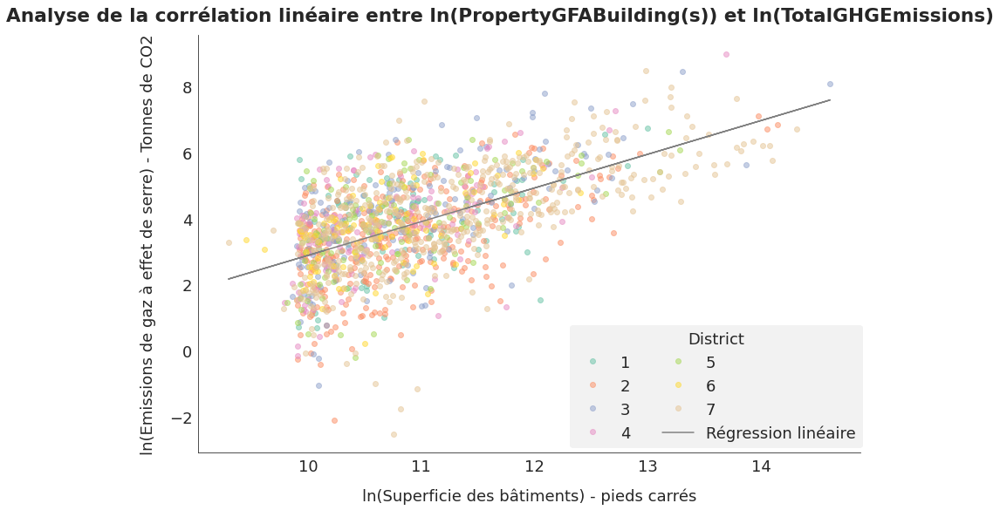

In [300]:
graph = sfg.MyGraph("Analyse de la corrélation linéaire entre {} et {}".format(col_correl[2], col_correl[5]))
graph.graph_custom_regplot(data_correl, col_correl[2], col_correl[5], hue=col_correl[-1], reg_color='grey')
graph.set_axe_x(label="ln(Superficie des bâtiments) - pieds carrés")
graph.set_axe_y(label="ln(Emissions de gaz à effet de serre) - Tonnes de CO2")
graph.set_legend(loc='upper left', title="District", ncol=2, bbox_to_anchor=(0.55,0.325))
fig, ax  = graph.fig, graph.ax
plt.show()

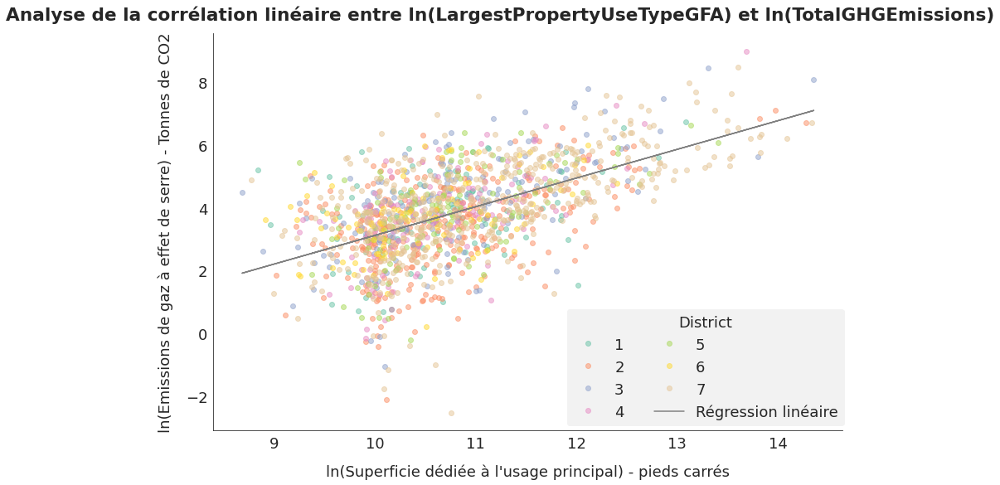

In [301]:
graph = sfg.MyGraph("Analyse de la corrélation linéaire entre {} et {}".format(col_correl[3], col_correl[5]))
graph.graph_custom_regplot(data_correl, col_correl[3], col_correl[5], hue=col_correl[-1], reg_color='grey')
graph.set_axe_x(label="ln(Superficie dédiée à l'usage principal) - pieds carrés")
graph.set_axe_y(label="ln(Emissions de gaz à effet de serre) - Tonnes de CO2")
graph.set_legend(loc='upper left', title="District", ncol=2, bbox_to_anchor=(0.55,0.325))
fig, ax  = graph.fig, graph.ax
plt.show()

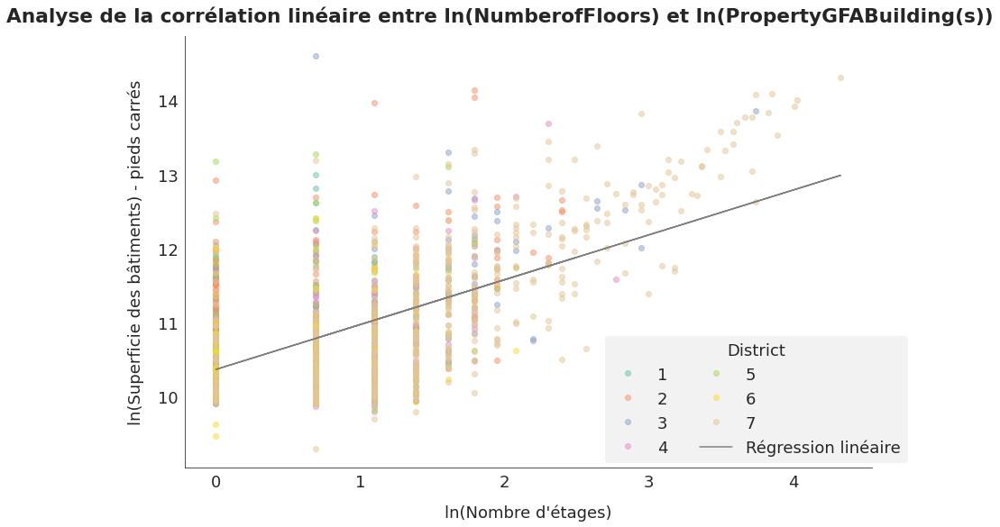

In [302]:
graph = sfg.MyGraph("Analyse de la corrélation linéaire entre {} et {}".format(col_correl[1], col_correl[2]))
graph.graph_custom_regplot(data_correl, col_correl[1], col_correl[2], hue=col_correl[-1], reg_color='grey')
graph.set_axe_x(label="ln(Nombre d'étages)")
graph.set_axe_y(label="ln(Superficie des bâtiments) - pieds carrés")
graph.set_legend(loc='upper left', title="District", ncol=2, bbox_to_anchor=(0.6,0.325))
fig, ax  = graph.fig, graph.ax
plt.show()

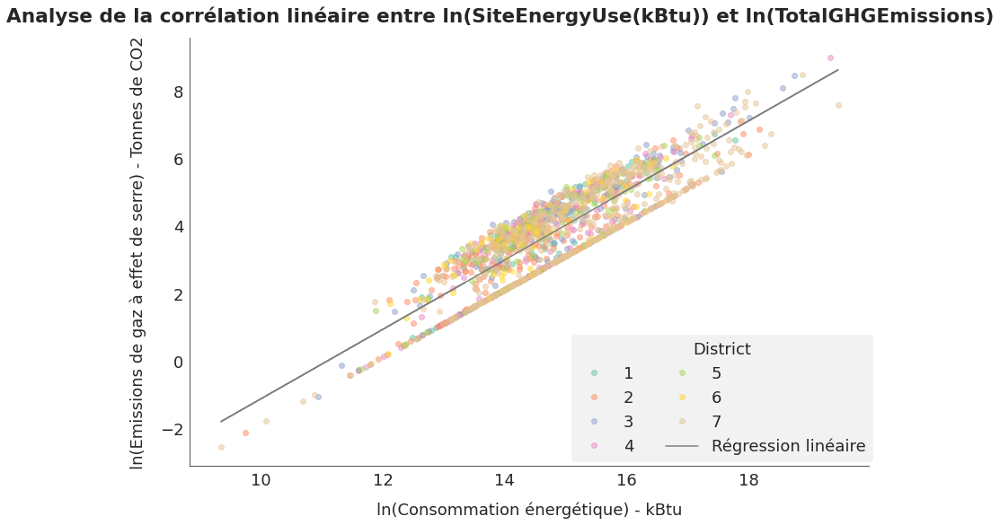

In [303]:
graph = sfg.MyGraph("Analyse de la corrélation linéaire entre {} et {}".format(col_correl[4], col_correl[5]))
graph.graph_custom_regplot(data_correl, col_correl[4], col_correl[5], hue=col_correl[-1], reg_color='grey')
graph.set_axe_x(label="ln(Consommation énergétique) - kBtu")
graph.set_axe_y(label="ln(Emissions de gaz à effet de serre) - Tonnes de CO2")
graph.set_legend(loc='upper left', title="District", ncol=2, bbox_to_anchor=(0.55,0.325))
fig, ax  = graph.fig, graph.ax
save_fig("ml03_1_19_relation_consommation_emissions")
plt.show()

**Relation entre le score EnergyStar et les émissions de gaz à effet de serre**

In [0]:
score_correl = data_train[['ENERGYSTARScore','ln(TotalGHGEmissions)','CouncilDistrictCode']].dropna()

In [305]:
sftd.test_correlations_linear(score_correl, 'ENERGYSTARScore', ['ln(TotalGHGEmissions)'], return_print=True)

Test de corrélation linéaire (niveau de risque = 5%)
   H0: Le coefficient de corrélation linéaire de la variable ENERGYSTARScore avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation linéaire n'est pas nul (r!=0)

                      Pearson Correlation   p_value     Accept H0         Conclusion       
ln(TotalGHGEmissions)      -0.142198       4.92381e-06    False    Coefficient significatif



In [306]:
sftd.test_correlations_rank(score_correl, 'ENERGYSTARScore', ['ln(TotalGHGEmissions)'], return_print=True)

Test de corrélation de rang (niveau de risque = 5%)
   H0: Le coefficient de corrélation de rang de la variable ENERGYSTARScore avec les variables suivantes est nul (r=0)
   H1: Le coefficient de corrélation de rang n'est pas nul (r!=0)

                      Spearman Correlation   p_value     Accept H0         Conclusion       
ln(TotalGHGEmissions)      -0.117133        0.000172215    False    Coefficient significatif



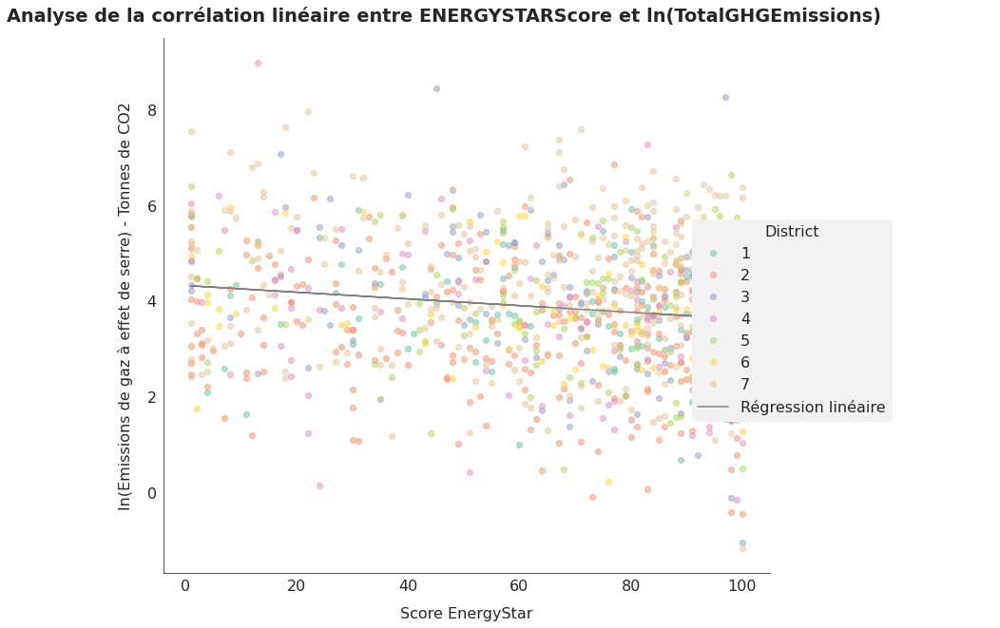

In [307]:
graph = sfg.MyGraph("Analyse de la corrélation linéaire entre {} et {}".format('ENERGYSTARScore', 'ln(TotalGHGEmissions)'), figsize=(10,9))
graph.graph_custom_regplot(score_correl, 'ENERGYSTARScore', 'ln(TotalGHGEmissions)', hue=col_correl[-1], reg_color='grey', legend=False)
graph.set_axe_x(label="Score EnergyStar")
graph.set_axe_y(label="ln(Emissions de gaz à effet de serre) - Tonnes de CO2")
graph.set_legend(loc='center left', bbox_to_anchor=(1,0.5), title="District", multi_index=0)
fig, ax  = graph.fig, graph.ax
save_fig("ml03_1_20_relation_energystar_emissions")
plt.show()

Le lien linéaire entre le score EnergyStar et les émissions de gaz à effet de serre est très faible. Toutefois, je conserve cette variable car elle peut ajouter de la valeur à un modèle non linéaire.

#### 6.2.2. Analyses Anova

**Recherche de facteurs explicatifs de la consommation énergétique et des émissions**

J'étudie les émissions et la consommation énergétique en fonction des valeurs de PrimaryPropertyType, CouncilDistrictCode, Neighborhood, LargestPropertyUseType, SecondLargestPropertyUseType, ThirdLargestPropertyUseType et more_than_onebuilding.

In [0]:
col_anova = ["ln(SiteEnergyUse(kBtu))", "ln(TotalGHGEmissions)",
             "more_than_onebuilding", "ln(NumberofFloors)","CouncilDistrictCode", "Neighborhood", "BuildingType",
             "PrimaryPropertyType", "LargestPropertyUseType","Outlier",
             "ln(PropertyGFATotal)","ln(PropertyGFAParking)",
             "ln(PropertyGFABuilding(s))","ln(LargestPropertyUseTypeGFA)"]
data_anova = data_train[col_anova].copy()
data_anova["Outlier"] = data_anova.Outlier.fillna('Inlier')
data_anova.dropna(inplace=True)

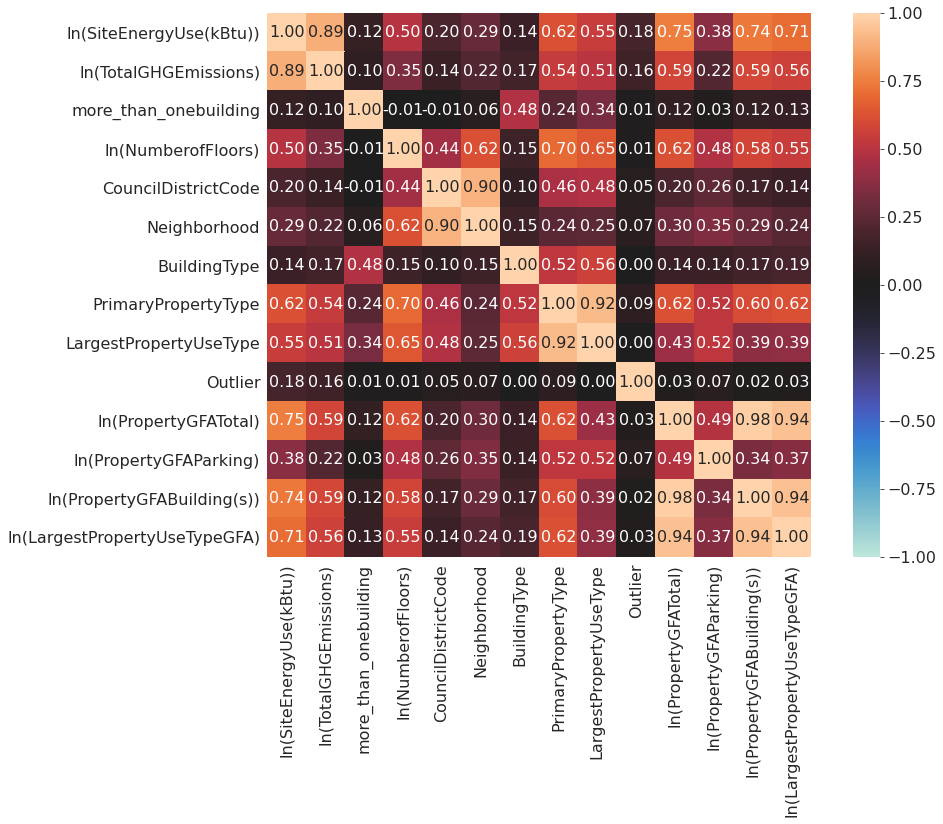

In [309]:
cor, ax = associations(data_anova, figsize=(15,10))
plt.show()

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


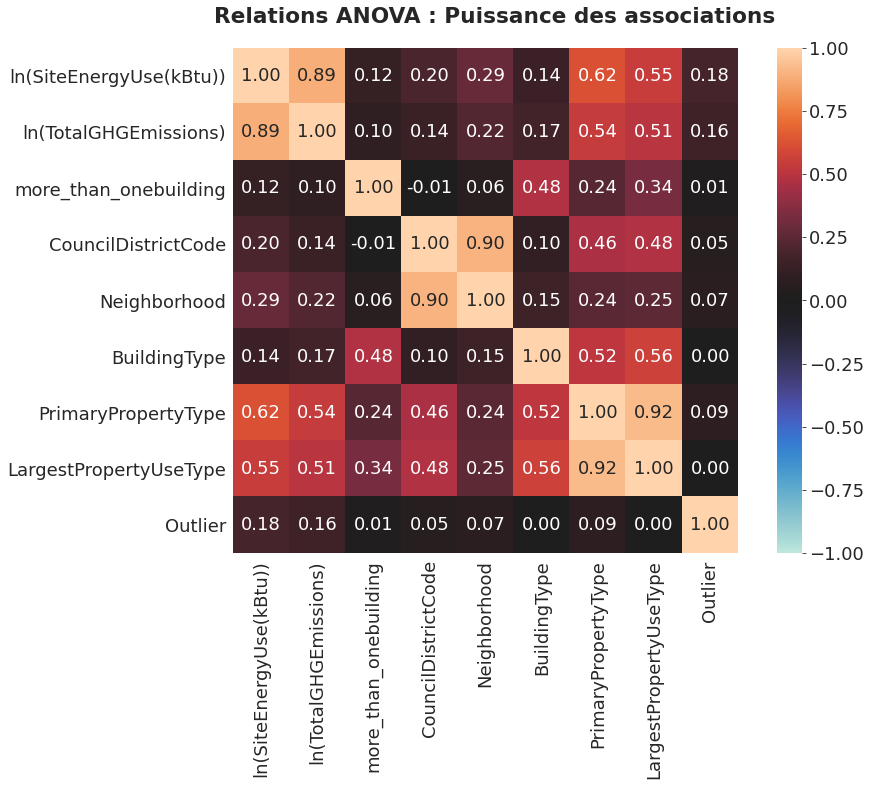

In [310]:
graph = sfg.MyGraph("Relations ANOVA : Puissance des associations")
cor, graph.ax[0] = associations(data_anova[["ln(SiteEnergyUse(kBtu))", "ln(TotalGHGEmissions)",
                                   "more_than_onebuilding", "CouncilDistrictCode", "Neighborhood", "BuildingType",
                                   "PrimaryPropertyType", "LargestPropertyUseType", "Outlier"]],
                                ax = graph.ax[0], plot=False, figsize=(15,10))
fig, ax = graph.fig, graph.ax
save_fig("ml03_1_21_relations_anova", tight_layout=False)
plt.show()

In [0]:
col_anova = ["ln(SiteEnergyUse(kBtu))", "ln(TotalGHGEmissions)",
             "more_than_onebuilding", "CouncilDistrictCode", "Neighborhood",
             "PrimaryPropertyType", "LargestPropertyUseType"]
data_anova = data_train[col_anova].dropna()

In [0]:
catplot_data = pd.DataFrame(columns=["mesure","valeur","categories"])
for col in [0,1]:
    df = pd.DataFrame({"mesure": np.full(len(data_anova), col_anova[col]), "valeur": data_anova[col_anova[col]], \
                       "categories": data_anova["more_than_onebuilding"]})
    catplot_data = pd.concat([catplot_data, df], ignore_index=True)

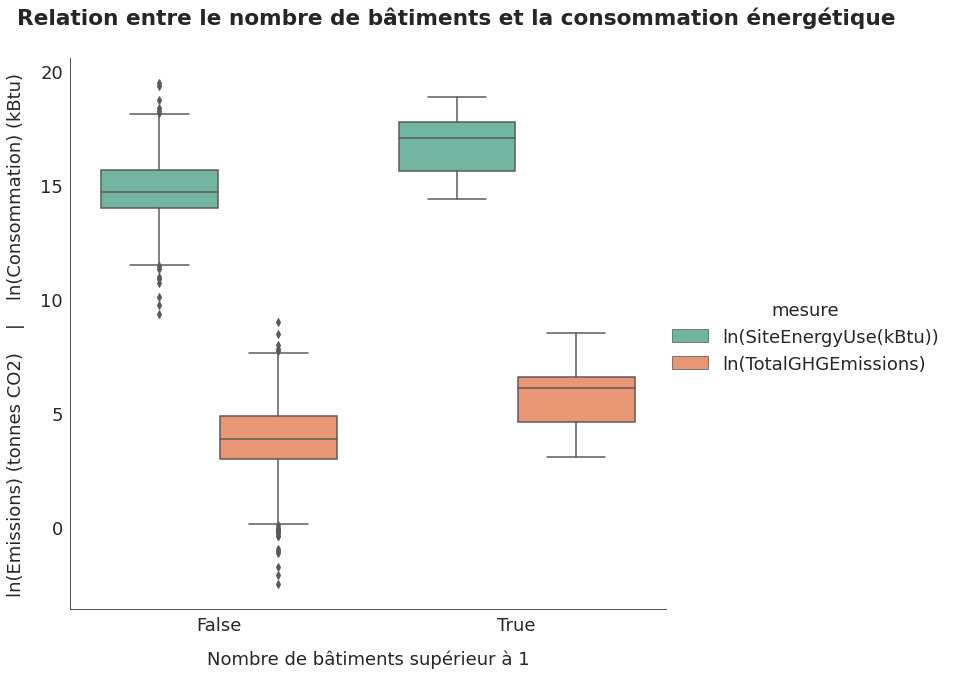

In [313]:
fig, ax = sfg.sns_catplot(x="categories", y="valeur", hue="mesure", data=catplot_data, \
                          kind='box', figsize=(10,9), legend=True, \
                          title="Relation entre le nombre de bâtiments et la consommation énergétique")
ax[0].set_xlabel("Nombre de bâtiments supérieur à 1")
ax[0].set_ylabel("ln(Emissions) (tonnes CO2)    |    ln(Consommation) (kBtu)")
plt.show()

In [314]:
sftd.test_egalite_moyennes(data_anova[~data_anova.more_than_onebuilding]["ln(SiteEnergyUse(kBtu))"], \
                           data_anova[data_anova.more_than_onebuilding]["ln(SiteEnergyUse(kBtu))"], \
                           equal_var=False, return_print=True)

T-test de Welch d'égalité des moyennes de deux échantillons (niveau de risque = 5%)
   H0: Les moyennes des 2 échantillons sont égales
   H1: Les moyennes des 2 échantillons sont différentes
Statistique étudiée : t de Student à 8.1 degrés de liberté = -3.561
p-value = 0.007
Accept H0 : False



In [315]:
sftd.test_egalite_medianes(data_anova[~data_anova.more_than_onebuilding]["ln(SiteEnergyUse(kBtu))"], \
                           data_anova[data_anova.more_than_onebuilding]["ln(SiteEnergyUse(kBtu))"], \
                           alternative='less', return_print=True)

Test U de Mann-Whitney d'égalité des médianes de deux échantillons (non paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 2 échantillons sont égales
   H1: La médiane du premier groupe est inférieure à la médiane du deuxième groupe
Statistique étudiée : loi normale (asymptotiquement) = 2315.000
p-value = 0.000
Accept H0 : False



In [316]:
sftd.test_egalite_moyennes(data_anova[~data_anova.more_than_onebuilding]["ln(TotalGHGEmissions)"], \
                           data_anova[data_anova.more_than_onebuilding]["ln(TotalGHGEmissions)"], \
                           equal_var=False, return_print=True)

T-test de Welch d'égalité des moyennes de deux échantillons (niveau de risque = 5%)
   H0: Les moyennes des 2 échantillons sont égales
   H1: Les moyennes des 2 échantillons sont différentes
Statistique étudiée : t de Student à 8.1 degrés de liberté = -2.883
p-value = 0.020
Accept H0 : False



In [317]:
sftd.test_egalite_medianes(data_anova[~data_anova.more_than_onebuilding]["ln(TotalGHGEmissions)"], \
                           data_anova[data_anova.more_than_onebuilding]["ln(TotalGHGEmissions)"], \
                           alternative='less', return_print=True)

Test U de Mann-Whitney d'égalité des médianes de deux échantillons (non paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 2 échantillons sont égales
   H1: La médiane du premier groupe est inférieure à la médiane du deuxième groupe
Statistique étudiée : loi normale (asymptotiquement) = 2941.000
p-value = 0.002
Accept H0 : False



La consommation énergétique et les émissions sont plus importantes lorsqu'il y a plusieurs bâtiments.

In [0]:
catplot_data = pd.DataFrame(columns=["mesure","valeur","categories"])
for col in [0,1]:
    df = pd.DataFrame({"mesure": np.full(len(data_anova), col_anova[col]), "valeur": data_anova[col_anova[col]], \
                       "categories": data_anova["CouncilDistrictCode"]})
    catplot_data = pd.concat([catplot_data, df], ignore_index=True)

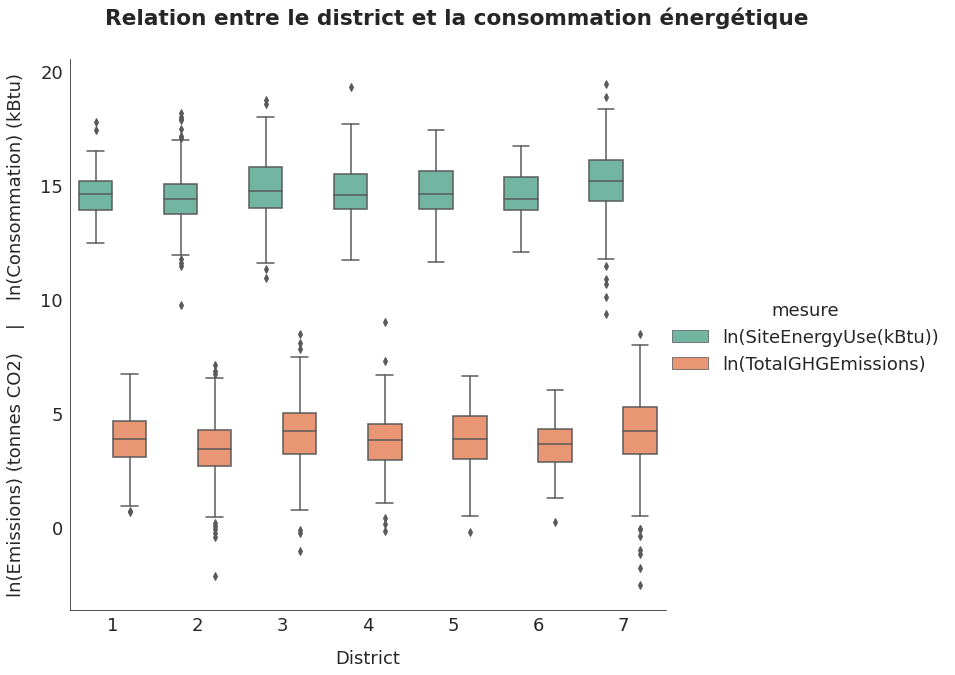

In [319]:
fig, ax = sfg.sns_catplot(x="categories", y="valeur", hue="mesure", data=catplot_data, \
                          kind='box', figsize=(10,9), legend=True, \
                          title="Relation entre le district et la consommation énergétique")
ax[0].set_xlabel("District")
ax[0].set_ylabel("ln(Emissions) (tonnes CO2)    |    ln(Consommation) (kBtu)")
plt.show()

In [320]:
sftd.test_anova_fisher(data_anova, ["ln(SiteEnergyUse(kBtu))","ln(TotalGHGEmissions)"], "CouncilDistrictCode", return_print=True)

Test ANOVA de Fisher (niveau de risque = 5%)
   H0: Les moyennes des 7 groupes sont égales
   H1: Au moins une moyenne n'est pas égale aux autres

                         F Stat    p_value     Accept H0                Conclusion               
ln(SiteEnergyUse(kBtu))  15.5447  2.39735e-17    False    Au moins une moyenne diffère des autres
ln(TotalGHGEmissions)    9.99289  7.81057e-11    False    Au moins une moyenne diffère des autres



In [321]:
sftd.test_anova_kruskal(data_anova, ["ln(SiteEnergyUse(kBtu))","ln(TotalGHGEmissions)"], "CouncilDistrictCode", return_print=True)

Test ANOVA de Kruskal-Wallis (non-paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 7 groupes sont égales
   H1: Au moins une médiane n'est pas égale aux autres

                         H Stat    p_value     Accept H0                Conclusion               
ln(SiteEnergyUse(kBtu))  90.9772  1.89855e-17    False    Au moins une médiane diffère des autres
ln(TotalGHGEmissions)    64.6182   5.1621e-12    False    Au moins une médiane diffère des autres



In [0]:
catplot_data = pd.DataFrame(columns=["mesure","valeur","categories"])
for col in [0,1]:
    df = pd.DataFrame({"mesure": np.full(len(data_anova), col_anova[col]), "valeur": data_anova[col_anova[col]], \
                       "categories": data_anova["Neighborhood"]})
    catplot_data = pd.concat([catplot_data, df], ignore_index=True)

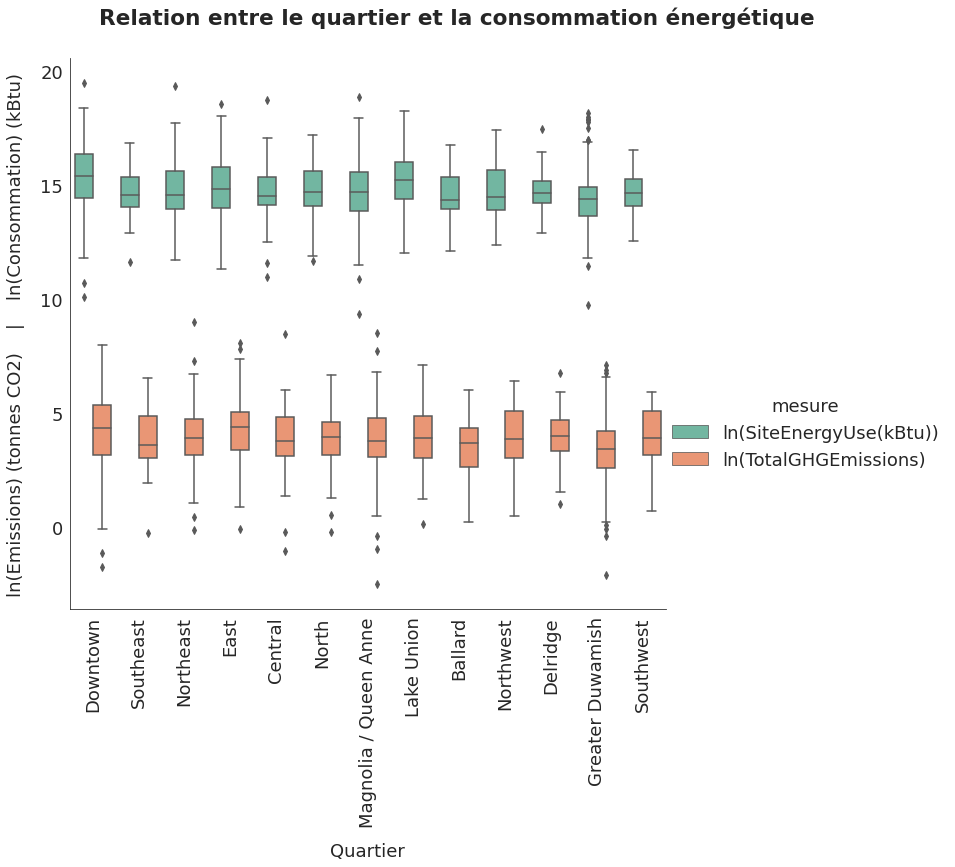

In [323]:
fig, ax = sfg.sns_catplot(x="categories", y="valeur", hue="mesure", data=catplot_data, \
                          kind='box', figsize=(10,9), legend=True, \
                          title="Relation entre le quartier et la consommation énergétique")
ax[0].set_xlabel("Quartier")
ax[0].set_ylabel("ln(Emissions) (tonnes CO2)    |    ln(Consommation) (kBtu)")
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, ha='center')
plt.show()

In [324]:
sftd.test_anova_fisher(data_anova, ["ln(SiteEnergyUse(kBtu))","ln(TotalGHGEmissions)"], "Neighborhood", return_print=True)

Test ANOVA de Fisher (niveau de risque = 5%)
   H0: Les moyennes des 13 groupes sont égales
   H1: Au moins une moyenne n'est pas égale aux autres

                         F Stat    p_value     Accept H0                Conclusion               
ln(SiteEnergyUse(kBtu))  10.6765  1.46945e-20    False    Au moins une moyenne diffère des autres
ln(TotalGHGEmissions)    6.33169  5.00775e-11    False    Au moins une moyenne diffère des autres



In [325]:
sftd.test_anova_kruskal(data_anova, ["ln(SiteEnergyUse(kBtu))","ln(TotalGHGEmissions)"], "Neighborhood", return_print=True)

Test ANOVA de Kruskal-Wallis (non-paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 13 groupes sont égales
   H1: Au moins une médiane n'est pas égale aux autres

                         H Stat    p_value     Accept H0                Conclusion               
ln(SiteEnergyUse(kBtu))  123.589  1.18753e-20    False    Au moins une médiane diffère des autres
ln(TotalGHGEmissions)    77.1608  1.43178e-11    False    Au moins une médiane diffère des autres



Les tests indiquent que la localisation (par district ou par quartier) influence la consommation énergétique et les émissions.

In [0]:
catplot_data = pd.DataFrame(columns=["mesure","valeur","categories"])
for col in [0,1]:
    df = pd.DataFrame({"mesure": np.full(len(data_anova), col_anova[col]), "valeur": data_anova[col_anova[col]], \
                       "categories": data_anova["PrimaryPropertyType"]})
    catplot_data = pd.concat([catplot_data, df], ignore_index=True)

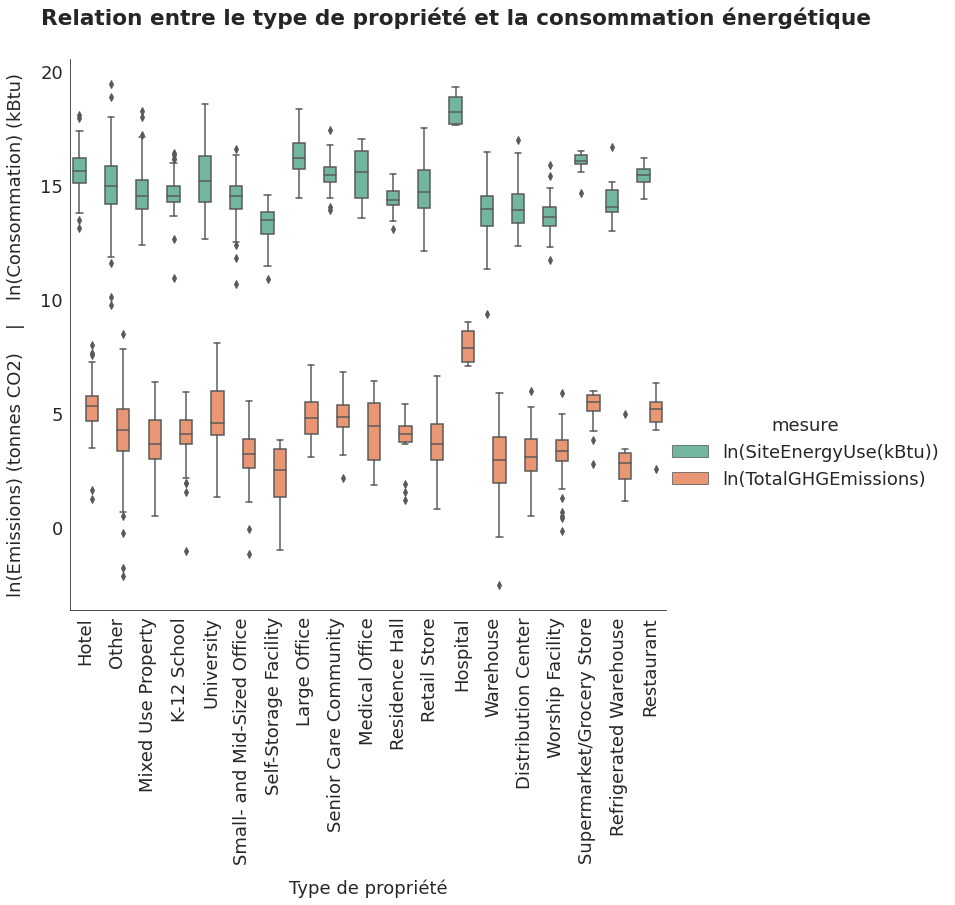

In [327]:
fig, ax = sfg.sns_catplot(x="categories", y="valeur", hue="mesure", data=catplot_data, \
                          kind='box', figsize=(10,9), legend=True, \
                          title="Relation entre le type de propriété et la consommation énergétique")
ax[0].set_xlabel("Type de propriété")
ax[0].set_ylabel("ln(Emissions) (tonnes CO2)    |    ln(Consommation) (kBtu)")
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, ha='center')
save_fig("ml03_1_22_relations_anova", tight_layout=False)
plt.show()

In [328]:
sftd.test_anova_fisher(data_anova, ["ln(SiteEnergyUse(kBtu))","ln(TotalGHGEmissions)"], "PrimaryPropertyType", return_print=True)

Test ANOVA de Fisher (niveau de risque = 5%)
   H0: Les moyennes des 19 groupes sont égales
   H1: Au moins une moyenne n'est pas égale aux autres

                         F Stat    p_value     Accept H0                Conclusion               
ln(SiteEnergyUse(kBtu))  50.0058  2.9744e-137    False    Au moins une moyenne diffère des autres
ln(TotalGHGEmissions)    32.6053  1.80053e-93    False    Au moins une moyenne diffère des autres



In [329]:
sftd.test_anova_kruskal(data_anova, ["ln(SiteEnergyUse(kBtu))","ln(TotalGHGEmissions)"], "PrimaryPropertyType", return_print=True)

Test ANOVA de Kruskal-Wallis (non-paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 19 groupes sont égales
   H1: Au moins une médiane n'est pas égale aux autres

                         H Stat     p_value     Accept H0                Conclusion               
ln(SiteEnergyUse(kBtu))  587.502  3.76552e-113    False    Au moins une médiane diffère des autres
ln(TotalGHGEmissions)    454.207   4.26455e-85    False    Au moins une médiane diffère des autres



In [0]:
catplot_data = pd.DataFrame(columns=["mesure","valeur","categories"])
for col in [0,1]:
    df = pd.DataFrame({"mesure": np.full(len(data_anova), col_anova[col]), "valeur": data_anova[col_anova[col]], \
                       "categories": data_anova["LargestPropertyUseType"]})
    catplot_data = pd.concat([catplot_data, df], ignore_index=True)

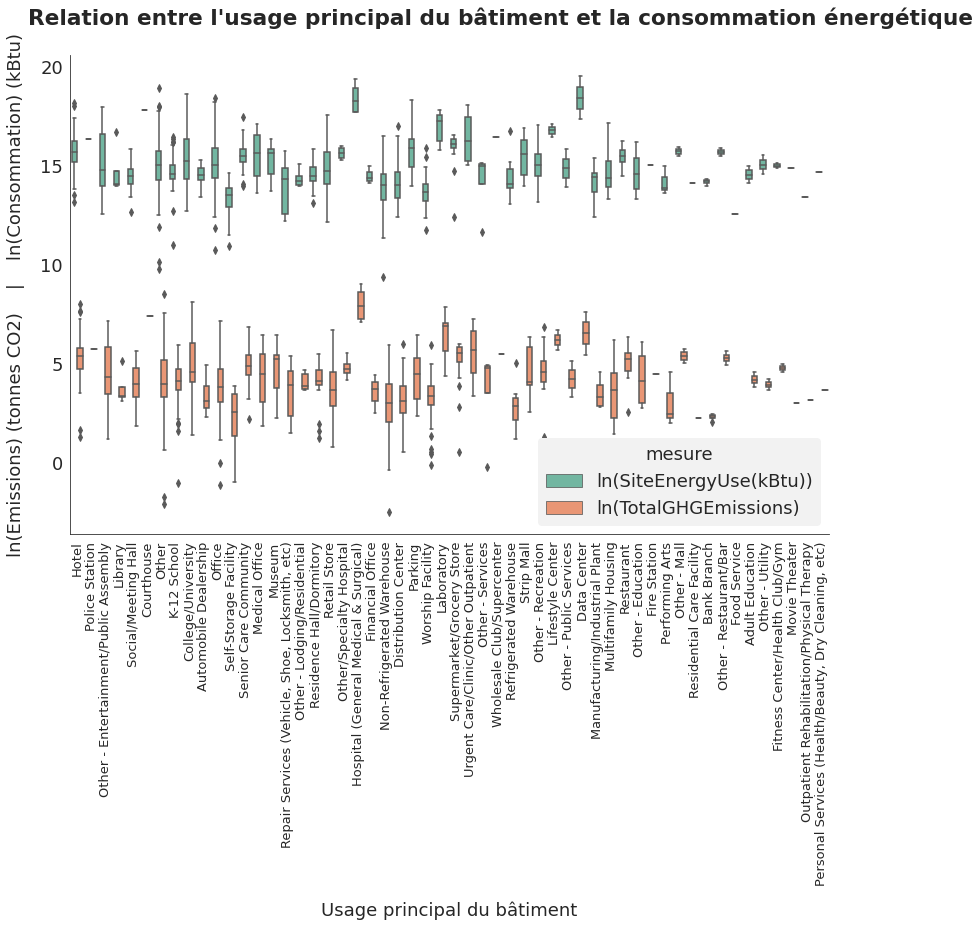

In [331]:
fig, ax = sfg.sns_catplot(x="categories", y="valeur", hue="mesure", data=catplot_data, \
                          kind='box', figsize=(16,8), legend=True, legend_out=False, \
                          title="Relation entre l'usage principal du bâtiment et la consommation énergétique")
ax[0].set_xlabel("Usage principal du bâtiment")
ax[0].set_ylabel("ln(Emissions) (tonnes CO2)    |    ln(Consommation) (kBtu)")
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, ha='center', fontsize=13)
save_fig("ml03_1_23_relations_anova", tight_layout=False)
plt.show()

In [332]:
sftd.test_anova_fisher(data_anova, ["ln(SiteEnergyUse(kBtu))","ln(TotalGHGEmissions)"], "LargestPropertyUseType", return_print=True)

Test ANOVA de Fisher (niveau de risque = 5%)
   H0: Les moyennes des 54 groupes sont égales
   H1: Au moins une moyenne n'est pas égale aux autres

                         F Stat    p_value     Accept H0                Conclusion               
ln(SiteEnergyUse(kBtu))  11.5276  5.34036e-77    False    Au moins une moyenne diffère des autres
ln(TotalGHGEmissions)    9.05752  1.72353e-58    False    Au moins une moyenne diffère des autres



In [333]:
sftd.test_anova_kruskal(data_anova, ["ln(SiteEnergyUse(kBtu))","ln(TotalGHGEmissions)"], "LargestPropertyUseType", return_print=True)

Test ANOVA de Kruskal-Wallis (non-paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 54 groupes sont égales
   H1: Au moins une médiane n'est pas égale aux autres

                         H Stat    p_value     Accept H0                Conclusion               
ln(SiteEnergyUse(kBtu))  450.445  2.16046e-64    False    Au moins une médiane diffère des autres
ln(TotalGHGEmissions)    365.097  3.58315e-48    False    Au moins une médiane diffère des autres



Les tests indiquent que la consommation et les émissions varient en fonction du type de propriété et de l'usage principal du bâtiment. Les graphiques montrent que ces variations sont sensibles pour certaines valeurs de ces variables.

In [334]:
data_anova[data_anova.LargestPropertyUseType=="Data Center"].PrimaryPropertyType

560     Other
3243    Other
Name: PrimaryPropertyType, dtype: object

Les data-centers, qui consomment beaucoup, sont regroupés dans la catégorie Other.

**Etudes ANOVA supplémentaires : recherche de variables de référence pour l'encodage des variables catégorielles**

Je souhaite trouver la meilleure variable pour encoder avec du target encoding mes variables catégorielles, tout en évitant la sur-optimisation liée à un encoding sur la target.  
De mes analyses précédentes, je pense que je peux choisir entre le nombre d'étages, la superficie des bâtiments ou de l'usage principal ou encore les consommations ou émissions par pied carré.

In [0]:
col_encoder = ["BuildingType","PrimaryPropertyType", "LargestPropertyUseType",
             "ln(NumberofFloors)","ln(PropertyGFABuilding(s))","ln(LargestPropertyUseTypeGFA)",
             "ln_conso_by_buildings_gfa","ln_emissions_by_buildings_gfa",
             "ln_conso_by_largestuse_gfa","ln_emissions_by_largestuse_gfa"]
data_encoder = data_train[col_encoder].dropna()

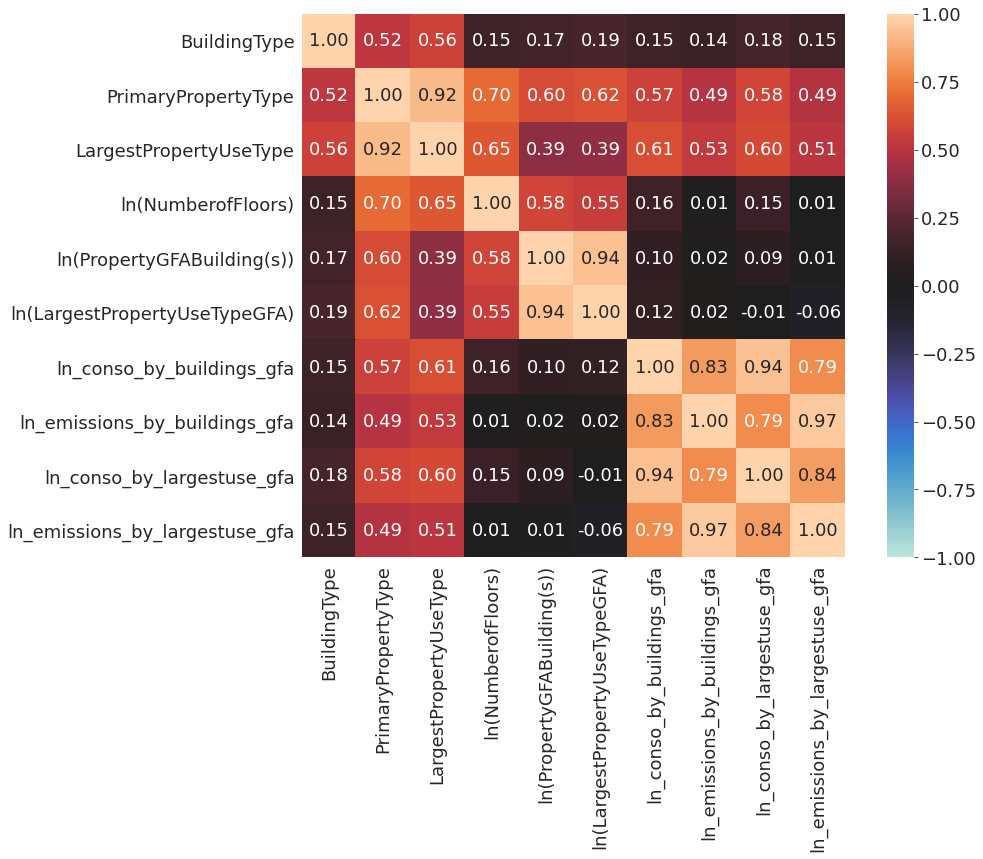

In [336]:
cor, graph.ax[0] = associations(data_encoder, figsize=(15,10))

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


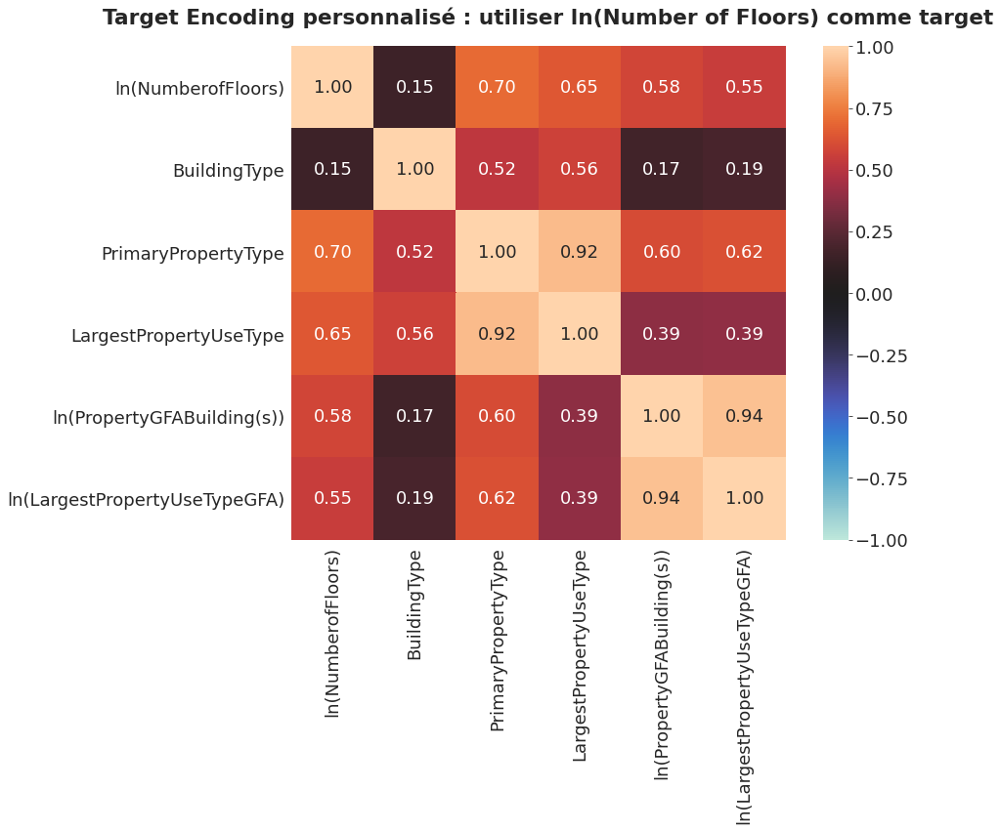

In [337]:
graph = sfg.MyGraph("Target Encoding personnalisé : utiliser ln(Number of Floors) comme target")
cor, graph.ax[0] = associations(data_encoder[["ln(NumberofFloors)", "BuildingType", "PrimaryPropertyType", 
                                              "LargestPropertyUseType", "ln(PropertyGFABuilding(s))",
                                              "ln(LargestPropertyUseTypeGFA)"]],
                                ax = graph.ax[0], plot=False, figsize=(15,10))
fig, ax = graph.fig, graph.ax
save_fig("ml03_1_31_target_encoding", tight_layout=False)
plt.show()

Aucune variable d'encodage évidente n'apparaît pour BuildingType. Etant donné son caractère très déséquilibré, la stratégie most_frequent apparaît la plus adaptée. 

Pour les variables "PrimaryPropertyType" et "LargestPropertyUseType", la variable Nombre d'étages apparaît la plus appropriée. C'est elle qui est la plus liée aux deux variables à encoder. Et elle évite tout problème de sur-optimisation lié à l'utilisation de la consommation ou des émissions.

In [0]:
col_anova_plus = ["PrimaryPropertyType", "LargestPropertyUseType","ln(NumberofFloors)",
                  'ln(PropertyGFABuilding(s))', 'ln(LargestPropertyUseTypeGFA)',
                  'ln_conso_by_buildings_gfa', 'ln_conso_by_largestuse_gfa',
                  'ln_emissions_by_buildings_gfa', 'ln_emissions_by_largestuse_gfa']
data_anova_plus = data_train[col_anova_plus].dropna()

*Lien entre nombre d'étages et type/usage du bâtiment*

In [0]:
catplot_data = pd.DataFrame(columns=["mesure","valeur","categories"])
for col in [2]:
    df = pd.DataFrame({"mesure": np.full(len(data_anova_plus), col_anova_plus[col]), \
                       "valeur": data_anova_plus[col_anova_plus[col]], \
                       "categories": data_anova_plus["PrimaryPropertyType"]})
    catplot_data = pd.concat([catplot_data, df], ignore_index=True)

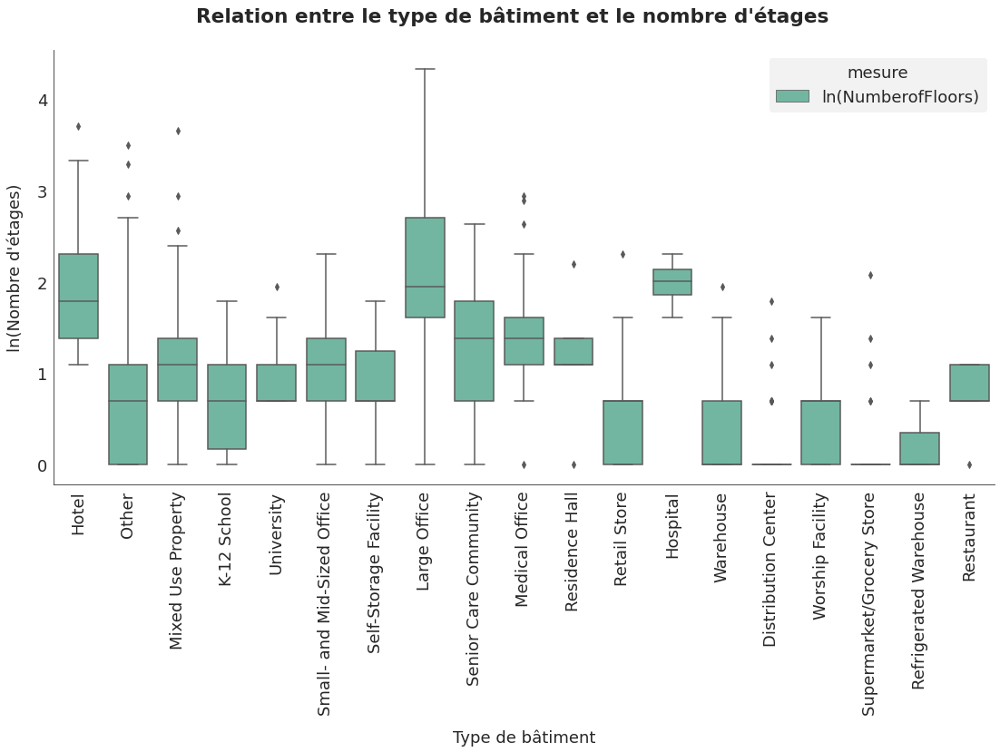

In [340]:
fig, ax = sfg.sns_catplot(x="categories", y="valeur", hue="mesure", data=catplot_data, \
                          kind='box', figsize=(16,8), legend=True, legend_out=False, \
                          title="Relation entre le type de bâtiment et le nombre d'étages")
ax[0].set_xlabel("Type de bâtiment")
ax[0].set_ylabel("ln(Nombre d'étages)")
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, ha='center')
plt.show()

In [341]:
sftd.test_anova_fisher(data_anova_plus, ["ln(NumberofFloors)"], "PrimaryPropertyType", return_print=True)

Test ANOVA de Fisher (niveau de risque = 5%)
   H0: Les moyennes des 19 groupes sont égales
   H1: Au moins une moyenne n'est pas égale aux autres

                    F Stat     p_value     Accept H0                Conclusion               
ln(NumberofFloors)  74.4534  4.28637e-190    False    Au moins une moyenne diffère des autres



In [342]:
sftd.test_anova_kruskal(data_anova_plus, ["ln(NumberofFloors)"], "PrimaryPropertyType", return_print=True)

Test ANOVA de Kruskal-Wallis (non-paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 19 groupes sont égales
   H1: Au moins une médiane n'est pas égale aux autres

                    H Stat    p_value     Accept H0                Conclusion               
ln(NumberofFloors)  673.96  1.89326e-131    False    Au moins une médiane diffère des autres



In [0]:
catplot_data = pd.DataFrame(columns=["mesure","valeur","categories"])
for col in [2]:
    df = pd.DataFrame({"mesure": np.full(len(data_anova_plus), col_anova_plus[col]), \
                       "valeur": data_anova_plus[col_anova_plus[col]], \
                       "categories": data_anova_plus["LargestPropertyUseType"]})
    catplot_data = pd.concat([catplot_data, df], ignore_index=True)

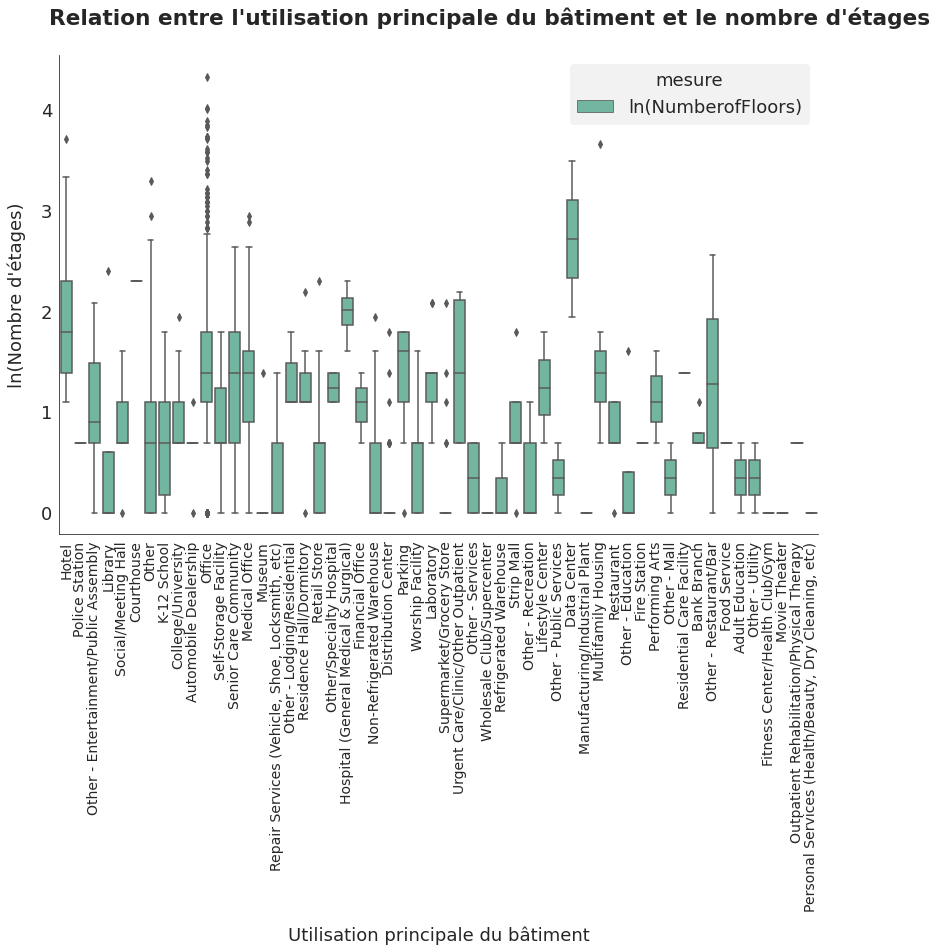

In [344]:
fig, ax = sfg.sns_catplot(x="categories", y="valeur", hue="mesure", data=catplot_data, \
                          kind='box', figsize=(16,8), legend=True, legend_out=False, \
                          title="Relation entre l'utilisation principale du bâtiment et le nombre d'étages")
ax[0].set_xlabel("Utilisation principale du bâtiment")
ax[0].set_ylabel("ln(Nombre d'étages)")
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, ha='center', fontsize=14)
plt.show()

In [345]:
sftd.test_anova_fisher(data_anova_plus, ["ln(NumberofFloors)"], "LargestPropertyUseType", return_print=True)

Test ANOVA de Fisher (niveau de risque = 5%)
   H0: Les moyennes des 54 groupes sont égales
   H1: Au moins une moyenne n'est pas égale aux autres

                    F Stat     p_value     Accept H0                Conclusion               
ln(NumberofFloors)  18.7081  4.03485e-126    False    Au moins une moyenne diffère des autres



In [346]:
sftd.test_anova_kruskal(data_anova_plus, ["ln(NumberofFloors)"], "LargestPropertyUseType", return_print=True)

Test ANOVA de Kruskal-Wallis (non-paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 54 groupes sont égales
   H1: Au moins une médiane n'est pas égale aux autres

                    H Stat     p_value     Accept H0                Conclusion               
ln(NumberofFloors)  667.428  3.58355e-107    False    Au moins une médiane diffère des autres



*Lien entre consommation/émissions par pied carré et type/usage du bâtiment*

In [0]:
catplot_data = pd.DataFrame(columns=["mesure","valeur","categories"])
for col in [5,7]:
    df = pd.DataFrame({"mesure": np.full(len(data_anova_plus), col_anova_plus[col]), \
                       "valeur": data_anova_plus[col_anova_plus[col]], \
                       "categories": data_anova_plus["PrimaryPropertyType"]})
    catplot_data = pd.concat([catplot_data, df], ignore_index=True)

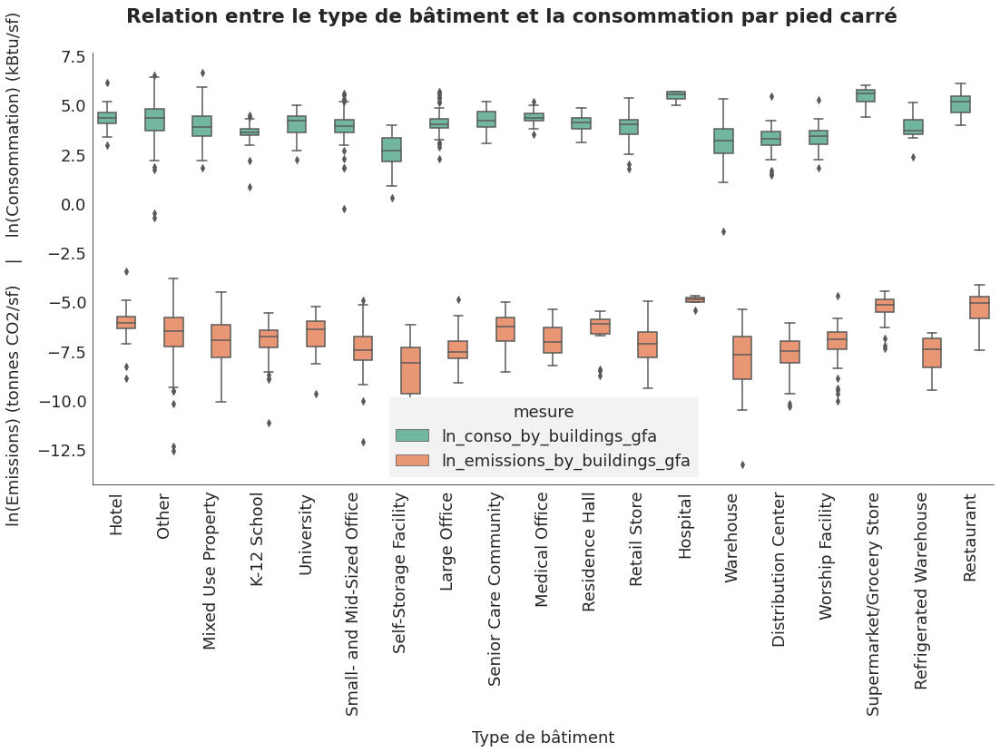

In [348]:
fig, ax = sfg.sns_catplot(x="categories", y="valeur", hue="mesure", data=catplot_data, \
                          kind='box', figsize=(16,8), legend=True, legend_out=False, \
                          title="Relation entre le type de bâtiment et la consommation par pied carré")
ax[0].set_xlabel("Type de bâtiment")
ax[0].set_ylabel("ln(Emissions) (tonnes CO2/sf)    |    ln(Consommation) (kBtu/sf)")
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, ha='center')
plt.show()

In [349]:
sftd.test_anova_fisher(data_anova_plus, ["ln_conso_by_buildings_gfa","ln_emissions_by_buildings_gfa"], "PrimaryPropertyType", return_print=True)

Test ANOVA de Fisher (niveau de risque = 5%)
   H0: Les moyennes des 19 groupes sont égales
   H1: Au moins une moyenne n'est pas égale aux autres

                               F Stat     p_value     Accept H0                Conclusion               
ln_conso_by_buildings_gfa      37.9017  1.96266e-107    False    Au moins une moyenne diffère des autres
ln_emissions_by_buildings_gfa  25.5157   8.09353e-74    False    Au moins une moyenne diffère des autres



In [350]:
sftd.test_anova_kruskal(data_anova_plus, ["ln_conso_by_buildings_gfa","ln_emissions_by_buildings_gfa"], "PrimaryPropertyType", return_print=True)

Test ANOVA de Kruskal-Wallis (non-paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 19 groupes sont égales
   H1: Au moins une médiane n'est pas égale aux autres

                               H Stat    p_value     Accept H0                Conclusion               
ln_conso_by_buildings_gfa       478.12  4.11852e-90    False    Au moins une médiane diffère des autres
ln_emissions_by_buildings_gfa  348.794  4.05027e-63    False    Au moins une médiane diffère des autres



In [0]:
catplot_data = pd.DataFrame(columns=["mesure","valeur","categories"])
for col in [5,7]:
    df = pd.DataFrame({"mesure": np.full(len(data_anova_plus), col_anova_plus[col]), \
                       "valeur": data_anova_plus[col_anova_plus[col]], \
                       "categories": data_anova_plus["LargestPropertyUseType"]})
    catplot_data = pd.concat([catplot_data, df], ignore_index=True)

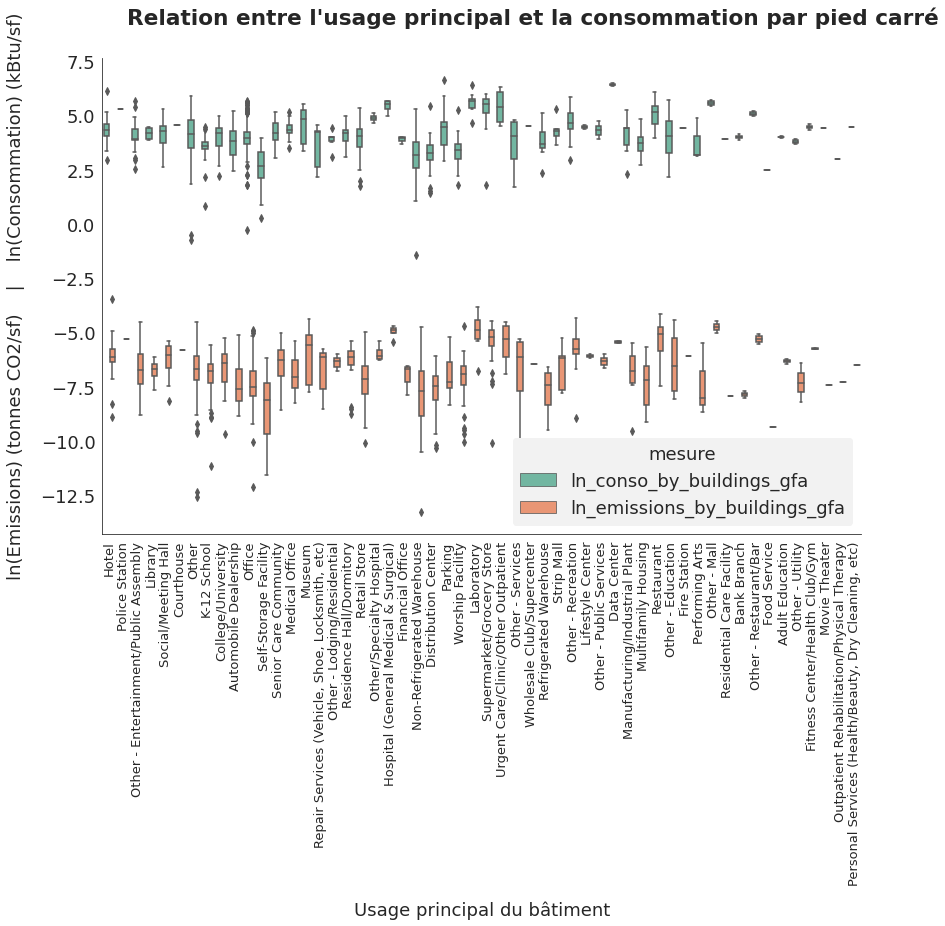

In [352]:
fig, ax = sfg.sns_catplot(x="categories", y="valeur", hue="mesure", data=catplot_data, \
                          kind='box', figsize=(16,8), legend=True, legend_out=False, \
                          title="Relation entre l'usage principal et la consommation par pied carré")
ax[0].set_xlabel("Usage principal du bâtiment")
ax[0].set_ylabel("ln(Emissions) (tonnes CO2/sf)    |    ln(Consommation) (kBtu/sf)")
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90, ha='center', fontsize=13)
plt.show()

In [353]:
sftd.test_anova_fisher(data_anova_plus, ["ln_conso_by_largestuse_gfa","ln_emissions_by_largestuse_gfa"], "LargestPropertyUseType", return_print=True)

Test ANOVA de Fisher (niveau de risque = 5%)
   H0: Les moyennes des 54 groupes sont égales
   H1: Au moins une moyenne n'est pas égale aux autres

                                F Stat    p_value     Accept H0                Conclusion               
ln_conso_by_largestuse_gfa      14.6729  2.27362e-99    False    Au moins une moyenne diffère des autres
ln_emissions_by_largestuse_gfa  9.21273  1.12337e-59    False    Au moins une moyenne diffère des autres



In [354]:
sftd.test_anova_kruskal(data_anova_plus, ["ln_conso_by_largestuse_gfa","ln_emissions_by_largestuse_gfa"], "LargestPropertyUseType", return_print=True)

Test ANOVA de Kruskal-Wallis (non-paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 54 groupes sont égales
   H1: Au moins une médiane n'est pas égale aux autres

                                H Stat    p_value     Accept H0                Conclusion               
ln_conso_by_largestuse_gfa      510.344  5.05772e-76    False    Au moins une médiane diffère des autres
ln_emissions_by_largestuse_gfa  361.771  1.49898e-47    False    Au moins une médiane diffère des autres



On retrouve des différences de consommation et d'émissions semblables, que la consommation ou les émissions soient exprimées en valeur ou en valeur par pied carré.  
Nous pouvons donc encoder nos variables catégorielles avec la mesure des consommation et émissions ou avec leur équivalent par pied carré.

*Lien entre superficie et usage du bâtiment*

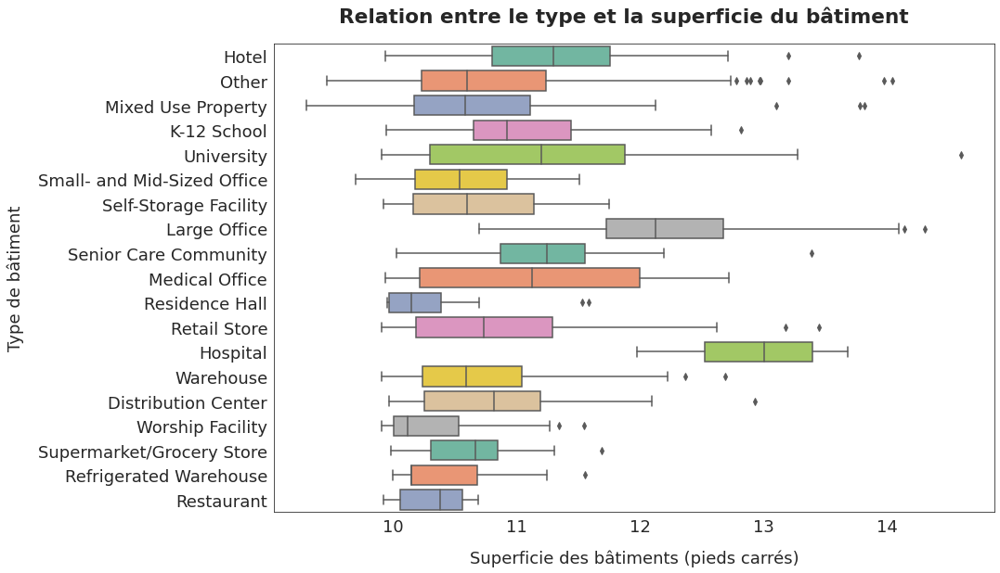

In [355]:
graph = sfg.MyGraph("Relation entre le type et la superficie du bâtiment")
graph.add_sns_boxplot("ln(PropertyGFABuilding(s))","PrimaryPropertyType", data_anova_plus)
graph.set_axe_x(label="Superficie des bâtiments (pieds carrés)")
graph.set_axe_y(label="Type de bâtiment")
plt.show()

In [356]:
sftd.test_anova_fisher(data_anova_plus, ["ln(PropertyGFABuilding(s))"], "PrimaryPropertyType", return_print=True)

Test ANOVA de Fisher (niveau de risque = 5%)
   H0: Les moyennes des 19 groupes sont égales
   H1: Au moins une moyenne n'est pas égale aux autres

                            F Stat    p_value     Accept H0                Conclusion               
ln(PropertyGFABuilding(s))  44.9104  4.9076e-125    False    Au moins une moyenne diffère des autres



In [357]:
sftd.test_anova_kruskal(data_anova_plus, ["ln(PropertyGFABuilding(s))"], "PrimaryPropertyType", return_print=True)

Test ANOVA de Kruskal-Wallis (non-paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 19 groupes sont égales
   H1: Au moins une médiane n'est pas égale aux autres

                            H Stat    p_value     Accept H0                Conclusion               
ln(PropertyGFABuilding(s))  434.367  6.07825e-81    False    Au moins une médiane diffère des autres



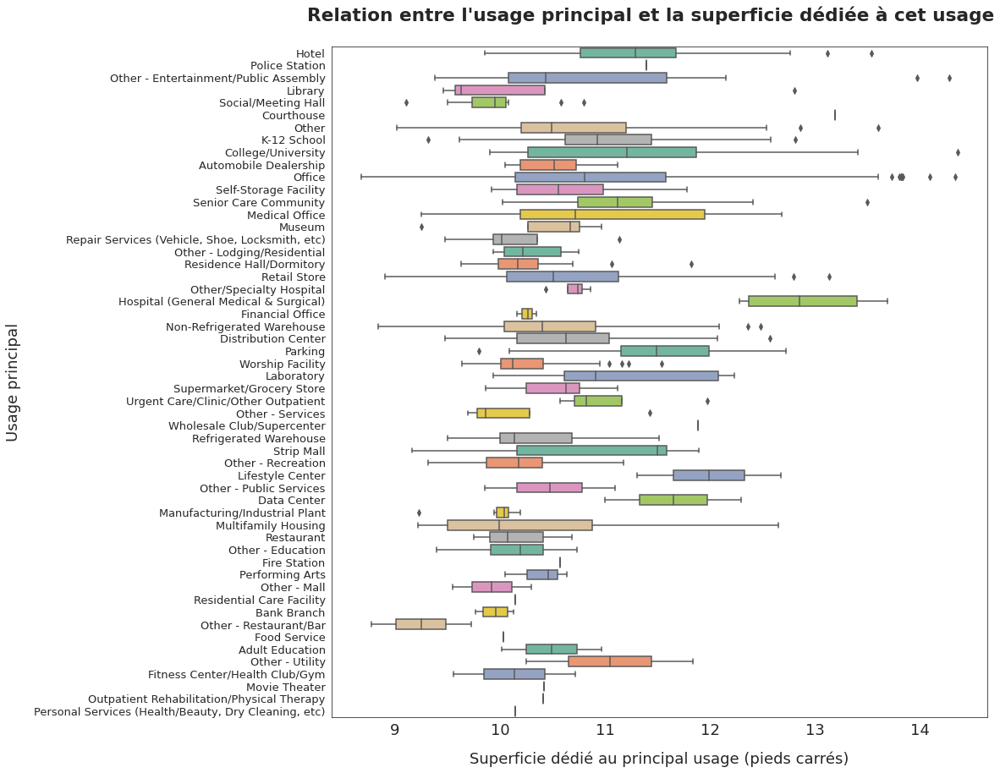

In [358]:
graph = sfg.MyGraph("Relation entre l'usage principal et la superficie dédiée à cet usage", figsize=(12,12))
graph.add_sns_boxplot("ln(LargestPropertyUseTypeGFA)","LargestPropertyUseType", data_anova_plus)
graph.set_axe_x(label="Superficie dédié au principal usage (pieds carrés)")
graph.set_axe_y(label="Usage principal")
fig, ax = graph.fig, graph.ax
ax[0].set_yticklabels(ax[0].get_yticklabels(), fontsize=13)
plt.show()

In [359]:
sftd.test_anova_fisher(data_anova_plus, ["ln(LargestPropertyUseTypeGFA)"], "LargestPropertyUseType", return_print=True)

Test ANOVA de Fisher (niveau de risque = 5%)
   H0: Les moyennes des 54 groupes sont égales
   H1: Au moins une moyenne n'est pas égale aux autres

                               F Stat    p_value     Accept H0                Conclusion               
ln(LargestPropertyUseTypeGFA)  4.77885  4.45042e-25    False    Au moins une moyenne diffère des autres



In [360]:
sftd.test_anova_kruskal(data_anova_plus, ["ln(LargestPropertyUseTypeGFA)"], "LargestPropertyUseType", return_print=True)

Test ANOVA de Kruskal-Wallis (non-paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 54 groupes sont égales
   H1: Au moins une médiane n'est pas égale aux autres

                               H Stat    p_value    Accept H0                Conclusion               
ln(LargestPropertyUseTypeGFA)  233.016  2.0101e-24    False    Au moins une médiane diffère des autres



La superficie varie en fonction des utilisations du bâtiment, de façon très marquée pour certaines activités.

**Etudes ANOVA supplémentaires : lien entre le nombre d'étages et la présence de plusieurs bâtiments**

In [0]:
col_anova_mtob = ["more_than_onebuilding", "ln(NumberofFloors)",
                  'ln(PropertyGFABuilding(s))', 'ln(LargestPropertyUseTypeGFA)']
data_anova_mtob = data_train[col_anova_mtob].dropna()

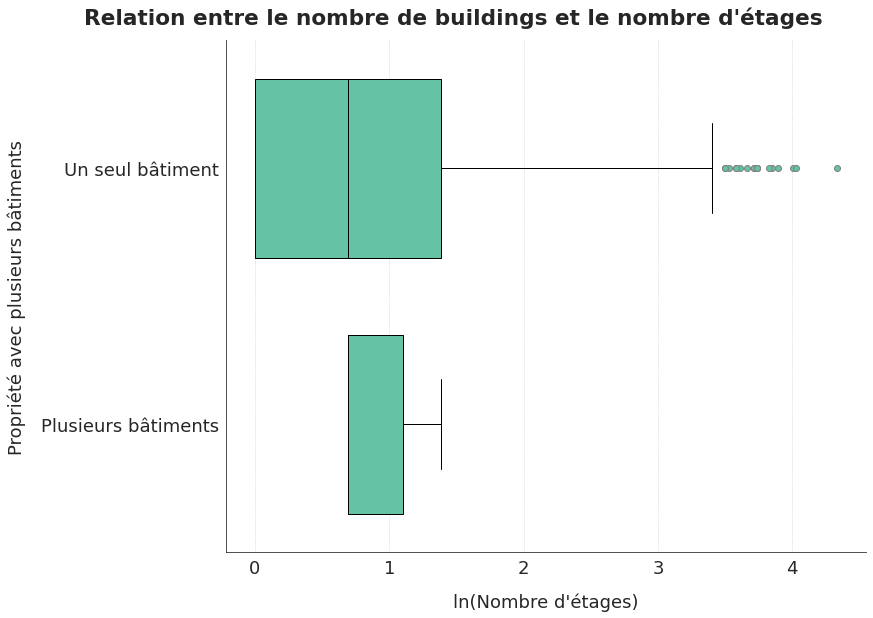

In [362]:
values = [data_anova_mtob[data_anova_mtob.more_than_onebuilding]["ln(NumberofFloors)"],
          data_anova_mtob[~data_anova_mtob.more_than_onebuilding]["ln(NumberofFloors)"]]
cat_labels = ["Plusieurs bâtiments","Un seul bâtiment"]
graph = sfg.MyGraph("Relation entre le nombre de buildings et le nombre d'étages", figsize=(12,8))
graph.add_boxplot(values, cat_labels, vertical=False)
graph.set_axe_x(label="ln(Nombre d'étages)")
graph.set_axe_y(label="Propriété avec plusieurs bâtiments")
fig, ax = graph.fig, graph.ax
plt.show()

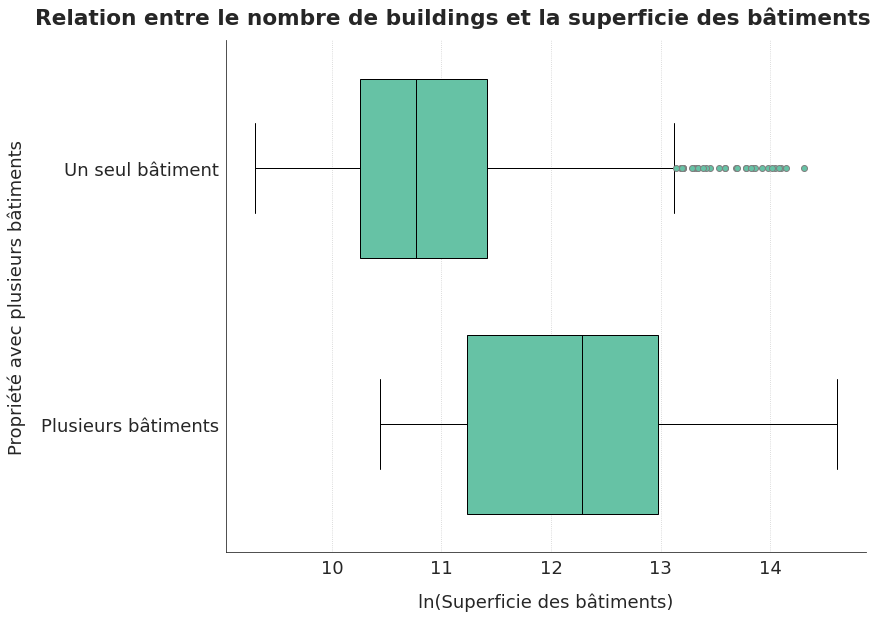

In [363]:
values = [data_anova_mtob[data_anova_mtob.more_than_onebuilding]["ln(PropertyGFABuilding(s))"],
          data_anova_mtob[~data_anova_mtob.more_than_onebuilding]["ln(PropertyGFABuilding(s))"]]
cat_labels = ["Plusieurs bâtiments","Un seul bâtiment"]
graph = sfg.MyGraph("Relation entre le nombre de buildings et la superficie des bâtiments", figsize=(12,8))
graph.add_boxplot(values, cat_labels, vertical=False)
graph.set_axe_x(label="ln(Superficie des bâtiments)")
graph.set_axe_y(label="Propriété avec plusieurs bâtiments")
fig, ax = graph.fig, graph.ax
plt.show()

In [364]:
sftd.test_anova_fisher(data_anova_mtob, ["ln(NumberofFloors)","ln(PropertyGFABuilding(s))"], "more_than_onebuilding", return_print=True)

Test ANOVA de Fisher (niveau de risque = 5%)
   H0: Les moyennes des 2 groupes sont égales
   H1: Au moins une moyenne n'est pas égale aux autres

                             F Stat    p_value    Accept H0                Conclusion               
ln(NumberofFloors)          0.126893    0.721727     True                   Les moyennes sont égales
ln(PropertyGFABuilding(s))   22.0868  2.8535e-06    False    Au moins une moyenne diffère des autres



In [365]:
sftd.test_anova_kruskal(data_anova_mtob, ["ln(NumberofFloors)","ln(PropertyGFABuilding(s))"], "more_than_onebuilding", return_print=True)

Test ANOVA de Kruskal-Wallis (non-paramétrique) (niveau de risque = 5%)
   H0: Les médianes des 2 groupes sont égales
   H1: Au moins une médiane n'est pas égale aux autres

                             H Stat     p_value     Accept H0                Conclusion               
ln(NumberofFloors)          0.0704936     0.790619     True                   Les médianes sont égales
ln(PropertyGFABuilding(s))     10.941  0.000940606    False    Au moins une médiane diffère des autres



Le nombre d'étages ne dépend pas du nombre de bâtiments.  
Par contre la superficie des bâtiments dépend du nombre de bâtiments.

**Etudes ANOVA supplémentaires : lien entre la consommation ou les émissions et la catégorisation en Outlier**

In [0]:
col_anova_outlier = ["Outlier", "ln(SiteEnergyUse(kBtu))", "ln(TotalGHGEmissions)","PropertyGFATotal"]
data_anova_outlier = data_train[col_anova_outlier].copy()
data_anova_outlier["Outlier"] = data_anova_outlier.Outlier.fillna("Inlier")
data_anova_outlier.dropna(inplace=True)

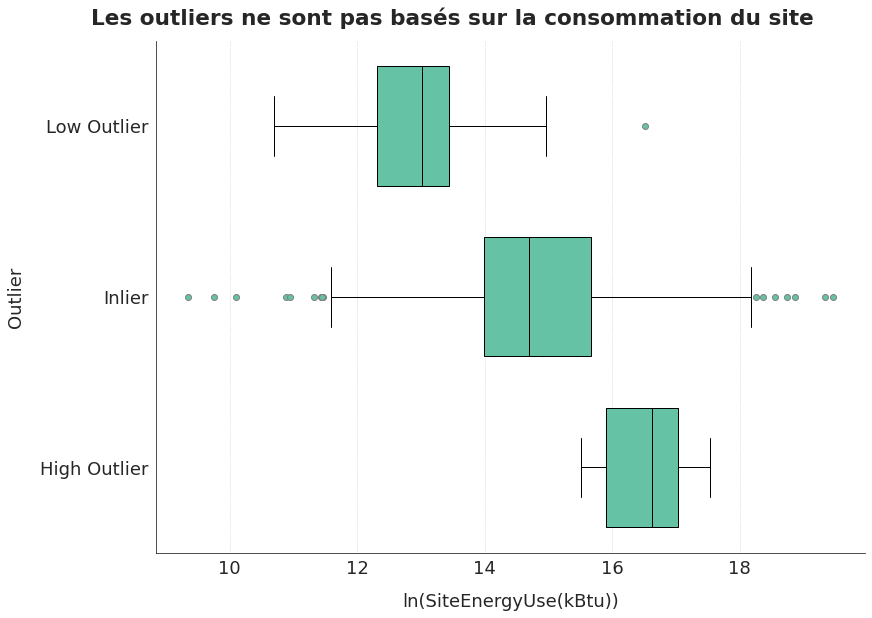

In [367]:
values = [data_anova_outlier[data_anova_outlier.Outlier=="High Outlier"]["ln(SiteEnergyUse(kBtu))"],
          data_anova_outlier[data_anova_outlier.Outlier=="Inlier"]["ln(SiteEnergyUse(kBtu))"],
          data_anova_outlier[data_anova_outlier.Outlier=="Low Outlier"]["ln(SiteEnergyUse(kBtu))"]]
cat_labels = ["High Outlier","Inlier","Low Outlier"]
graph = sfg.MyGraph("Les outliers ne sont pas basés sur la consommation du site", figsize=(12,8))
graph.add_boxplot(values, cat_labels, vertical=False)
graph.set_axe_x(label="ln(SiteEnergyUse(kBtu))")
graph.set_axe_y(label="Outlier")
fig, ax = graph.fig, graph.ax
plt.show()

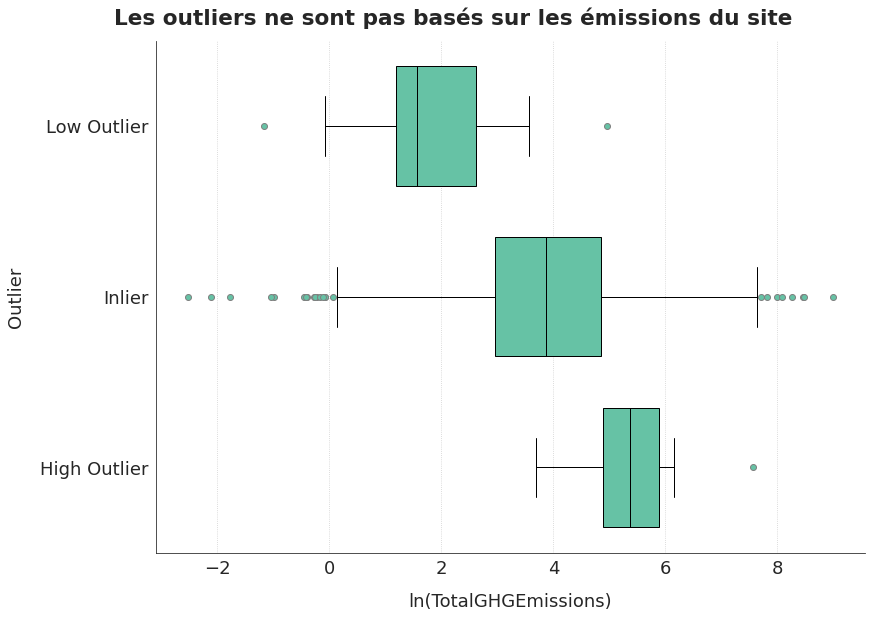

In [368]:
values = [data_anova_outlier[data_anova_outlier.Outlier=="High Outlier"]["ln(TotalGHGEmissions)"],
          data_anova_outlier[data_anova_outlier.Outlier=="Inlier"]["ln(TotalGHGEmissions)"],
          data_anova_outlier[data_anova_outlier.Outlier=="Low Outlier"]["ln(TotalGHGEmissions)"]]
cat_labels = ["High Outlier","Inlier","Low Outlier"]
graph = sfg.MyGraph("Les outliers ne sont pas basés sur les émissions du site", figsize=(12,8))
graph.add_boxplot(values, cat_labels, vertical=False)
graph.set_axe_x(label="ln(TotalGHGEmissions)")
graph.set_axe_y(label="Outlier")
fig, ax = graph.fig, graph.ax
plt.show()

#### 6.2.3. Tableaux de contingence

**Correspondance entre les districts et les quartiers**

In [0]:
data_contingence = sfco.Contingency(data_anova, "CouncilDistrictCode", "Neighborhood")

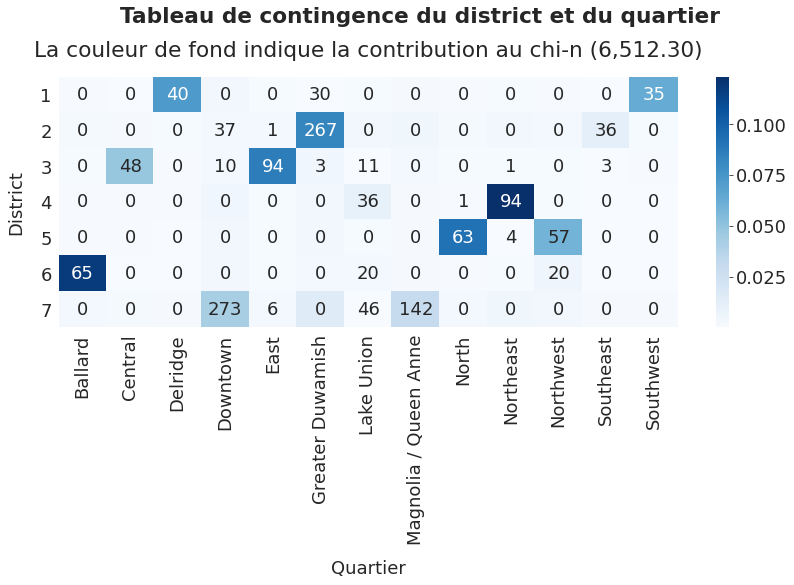

In [370]:
fig, ax = data_contingence.graph_contingency(x_label="Quartier",
                              y_label="District",
                              title="Tableau de contingence du district et du quartier",
                              x_tick_labels=data_contingence.contingency_table.columns,
                              y_tick_labels=data_contingence.contingency_table.index)
plt.show()

Un quartier peut être présent dans plusieurs districts. Les quartiers ne sont pas des sous-divisions strictes de districts.

**Correspondance entre les Types de propriété et les Principaux usages du bâtiment**

In [0]:
data_contingence = sfco.Contingency(data_anova, "LargestPropertyUseType", "PrimaryPropertyType")

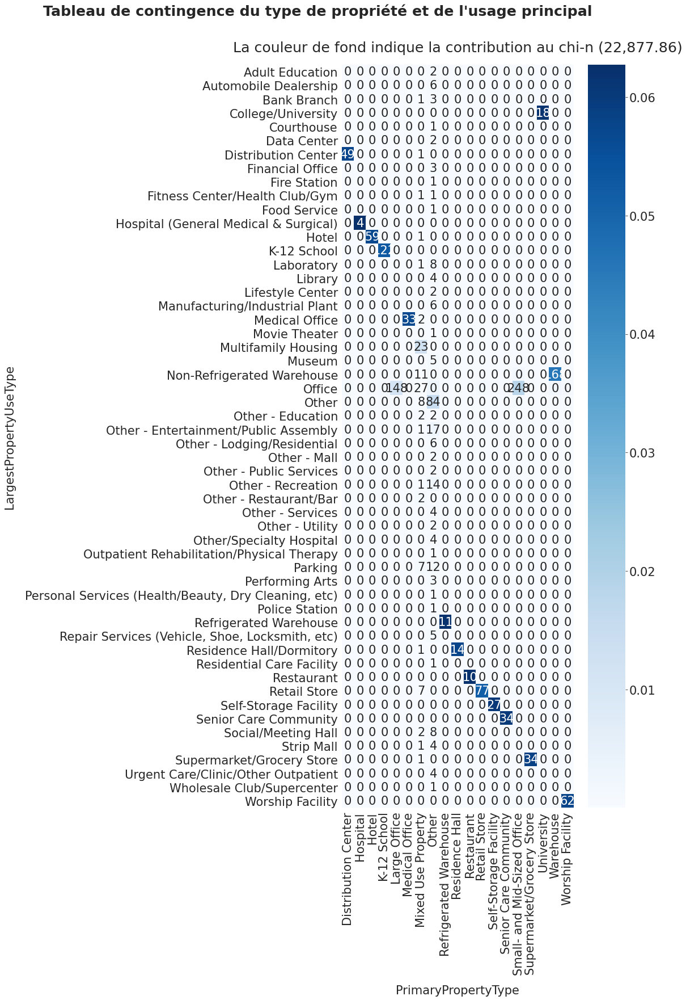

In [372]:
fig, ax = data_contingence.graph_contingency(x_label="PrimaryPropertyType",
                                             y_label="LargestPropertyUseType",
                                             title="Tableau de contingence du type de propriété et de l'usage principal",
                                             x_tick_labels=data_contingence.contingency_table.columns,
                                             y_tick_labels=data_contingence.contingency_table.index,
                                             figsize=(16,24))
plt.show()

Les valeurs 'Mixed Use Property' et 'Other' de PrimaryPropertyType regroupent plusieurs valeurs de LargestPropertyUseType. Sinon, les autres valeurs de PrimaryPropertyType ont une correspondance exacte avec une seule valeur de LargestPropertyUseType. L'avantage de PrimaryPropertyType est de ne pas avoir de valeurs avec moins de 5 données.

**Lien entre le Type de propriété et le nombre de bâtiments**

In [0]:
data_contingence = sfco.Contingency(data_anova, "more_than_onebuilding", "PrimaryPropertyType")

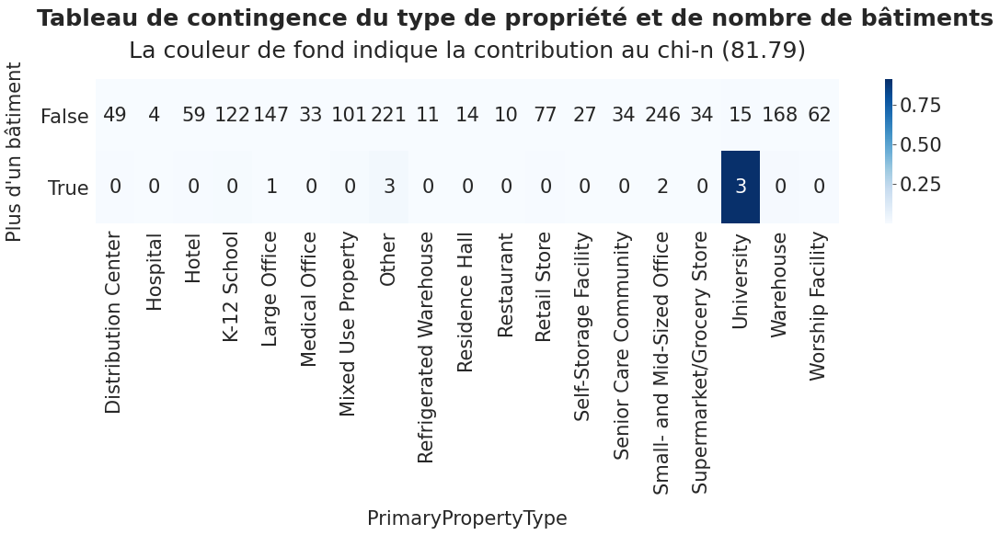

In [374]:
fig, ax = data_contingence.graph_contingency(x_label="PrimaryPropertyType",
                                             y_label="Plus d'un bâtiment",
                                             title="Tableau de contingence du type de propriété et de nombre de bâtiments",
                                             x_tick_labels=data_contingence.contingency_table.columns,
                                             y_tick_labels=data_contingence.contingency_table.index,
                                             figsize=(16,8))
plt.show()

Les propriétés avec plusieurs bâtiments correspondent à 4 types de propriétés. C'est en particulier le cas des campus universitaires et de quelques ensembles de bureaux.

**Relation entre le quartier et le type de propriété**

In [0]:
data_contingence = sfco.Contingency(data_anova, "Neighborhood", "PrimaryPropertyType")

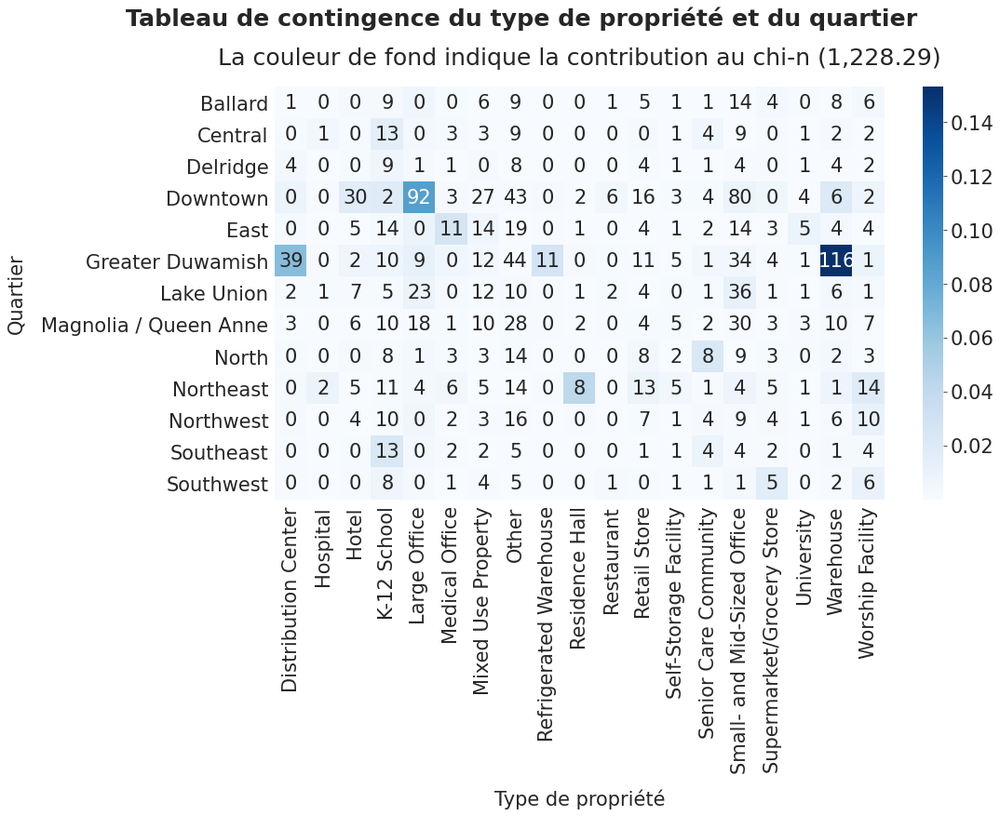

In [376]:
fig, ax = data_contingence.graph_contingency(x_label="Type de propriété",
                                             y_label="Quartier",
                                             title="Tableau de contingence du type de propriété et du quartier",
                                             x_tick_labels=data_contingence.contingency_table.columns,
                                             y_tick_labels=data_contingence.contingency_table.index,
                                             figsize=(16,12))
plt.show()

Certaines activités sont regroupées dans certains quartiers :
- les entrepôts et centres de distribution à Greater Duwamish ;
- les hotels dans le centre-ville ;
- les bureaux sont surtout présents en centre-ville ;
- les bureaux médicaux et les universités à l'est.

**Remarque sur les tests**

Je n'ai effectué aucun test car de nombreuses combinaisons de variables catégorielles ne comportent aucun enregistrement et les regrouper ne serait pas significatif. Or, ces tests n'ont pas de sens si on ne dispose d'au moins 5 observations par croisement de catégories.